**Table of contents**<a id='toc0_'></a>    
- [General Information](#toc1_)    
- [Importing Libraries](#toc2_)    
  - [Theme-Related Libraries](#toc2_1_)    
  - [Visualization-Related Libraries](#toc2_2_)    
  - [Other Auxiliary Libraries](#toc2_3_)    
- [Configuring Settings](#toc3_)    
  - [Visualization-Related Settings](#toc3_1_)    
  - [Other Auxiliary Settings](#toc3_2_)    
- [Pre-installing Custom Modules](#toc4_)    
- [Implementation of Lecture Content](#toc5_)    
  - [Preprocessing](#toc5_1_)    
    - [Preprocessing of the Original Training Dataset Labels](#toc5_1_1_)    
    - [Preprocessing of DICOM Files in the Original Training Dataset](#toc5_1_2_)    
  - [Train - Part One - Data Loading](#toc5_2_)    
    - [Data Transformation](#toc5_2_1_)    
    - [Batch Loading](#toc5_2_2_)    
  - [Train - Part Two - Model Creation](#toc5_3_)    
  - [Train - Part Three - Trainer](#toc5_4_)    
  - [Train - Part Four - Evaluation](#toc5_5_)    
    - [Saving and Restoring the Trained Model](#toc5_5_1_)    
    - [Prediction and Evaluation of Validation Dataset](#toc5_5_2_)    
    - [Visualization of Prediction and Evaluation](#toc5_5_3_)    
  - [Interpretability](#toc5_6_)    
    - [Class Activation Mapping (CAM)](#toc5_6_1_)    
    - [Visualization of CAM](#toc5_6_2_)    
- [Beyond the Lecture](#toc6_)    
  - [Understanding the PyTorch Hooks](#toc6_1_)    
    - [Recap of the Computational Graph](#toc6_1_1_)    
    - [Settings for Tensor Hooks](#toc6_1_2_)    
    - [Setting of Module Hooks](#toc6_1_3_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[General Information](#toc0_)

![Course Title](../../Images/Course_Title.jpeg)

**Course Tags:** #Python, #PyTorch, #machine learning, #deep learning, #medical image analysis

**Section Tags:** #PyTorch Lightning, #Pydicom, #convolutional neural network, #CNN, #residual learning, #residual network, #ResNet-18, #image classification, #object localization, #discriminative regions, #class activation mapping, #CAM, #gradient-weighted class activation mapping, #Grad-CAM, #Grad-CAM++, #chest X-ray images, #pneumonia

**Author:** [Hao ZHANG](https://www.linkedin.com/in/hao-zhang-6b7008107/)

**Description**

This notebook organizes the content of “Section 8: Pneumonia-Classification” from the Udemy course “Deep Learning with PyTorch for Medical Image Analysis”$^{\sf_{1}}$ and makes modifications or additions where necessary. As far as possible, while adapting to the current versions of the various necessary libraries and to the author's own computer's system environment, in addition to completing the steps in the lecture, additional annotations as well as relevant references have been added, together with more informative visualization performances and visualization comparisons.

The chest X-ray image dataset used for training in this lecture was downloaded from a Kaggle Competition.$^{\sf_{2, 3}}$ This notebook demonstrates how to train chest X-ray images for pneumonia and non-pneumonia classification using the ResNet-18 model, a deep residual learning model for image recognition,$^{\sf_{4}}$ and compares the accuracy, precision, and other metrics of this classification training at different thresholds. This classification training was performed using a deep learning algorithm trained on a large chest X-ray image dataset to recognize patterns and features indicative of pneumonia, which involves the use of convolutional neural networks (CNNs). Incidentally, the CNN architecture is a deep learning architecture that is particularly suited for image classification tasks, while the Residual Network (ResNet) model utilizes the CNN architecture and provides a solution to the vanishing gradient problem common to this architecture.

The framework of CNN is trained to perform classification on medical image datasets, but it can also be used to identify focal regions in medical images corresponding to infected regions (e.g., pneumonia) by learning image features in the convolutional layer, i.e., identifying discriminative regions. This image-level supervised object localization method is a weakly supervised object localization (WSOL) method, and most existing WSOL methods rely on various thresholding class activation mappings (CAMs) generated by pre-trained networks to highlight and localize objects. Therefore this notebook also highlights and localizes objects by generating class activation maps from the trained ResNet-18 model, these methods for generating class activation maps include (CAM, gradient-weighted class activation mapping (Grad-CAM), Grad-CAM++, etc.).$^{\sf_{5 - 7}}$

**References**

1. [Deep Learning with PyTorch for Medical Image Analysis](https://www.udemy.com/course/deep-learning-with-pytorch-for-medical-image-analysis/)

2. [RSNA Pneumonia Detection Challenge](https://www.kaggle.com/competitions/rsna-pneumonia-detection-challenge/)

3. [X. Wang, Y. Peng, L. Lu, Z. Lu, M. Bagheri and R. M. Summers, "ChestX-Ray8: Hospital-Scale Chest X-Ray Database and Benchmarks on Weakly-Supervised Classification and Localization of Common Thorax Diseases," 2017 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Honolulu, HI, USA, 2017, pp. 3462-3471, doi: 10.1109/CVPR.2017.369.](https://arxiv.org/abs/1705.02315)

4. [K. He, X. Zhang, S. Ren and J. Sun, "Deep Residual Learning for Image Recognition," 2016 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Las Vegas, NV, USA, 2016, pp. 770-778, doi: 10.1109/CVPR.2016.90.](https://arxiv.org/abs/1512.03385)

5. [B. Zhou, A. Khosla, A. Lapedriza, A. Oliva and A. Torralba, "Learning Deep Features for Discriminative Localization," 2016 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Las Vegas, NV, USA, 2016, pp. 2921-2929, doi: 10.1109/CVPR.2016.319.](https://arxiv.org/abs/1512.04150)

6. [R. R. Selvaraju, M. Cogswell, A. Das, R. Vedantam, D. Parikh and D. Batra, "Grad-CAM: Visual Explanations from Deep Networks via Gradient-Based Localization," 2017 IEEE International Conference on Computer Vision (ICCV), Venice, Italy, 2017, pp. 618-626, doi: 10.1109/ICCV.2017.74.](https://arxiv.org/abs/1610.02391)

7. [A. Chattopadhay, A. Sarkar, P. Howlader and V. N. Balasubramanian, "Grad-CAM++: Generalized Gradient-Based Visual Explanations for Deep Convolutional Networks," 2018 IEEE Winter Conference on Applications of Computer Vision (WACV), Lake Tahoe, NV, USA, 2018, pp. 839-847, doi: 10.1109/WACV.2018.00097.](https://arxiv.org/abs/1710.11063)


# <a id='toc2_'></a>[Importing Libraries](#toc0_)

## <a id='toc2_1_'></a>[Theme-Related Libraries](#toc0_)

**_PyTorch Lightning_**

- _PyTorch Lightning_ is an open source Python library that provides a high-level interface to PyTorch, a popular deep learning framework for professional artificial intelligence researchers and machine learning engineers.

- The `ModelCheckpoint` class from the `lightning.pytorch.callbacks` module: periodically saves the model by monitoring a quantity, where each metric recorded as a key-value pair or value dictionary is a candidate for the monitored key.

- The `TensorBoardLogger` class from the `lightning.pytorch.loggers` module: logs to local or remote file system in TensorBoard format, for more information on TensorBoard, click [here](https://www.tensorflow.org/tensorboard).

  > **Tips**
  >
  > - TensorBoard can be started either from the command line or directly from the notebook by experiencing the magic commands provided by the IPython kernel. The two commands are roughly the same, except that in the notebook, the IPython kernel uses `%` as a syntax element for magic commands, i.e., the line magic starting with `%tensorboard`. On the command line, run the same command without `%`.
  >
  > - Before using the line magic `%tensorboard`, the TensorBoard notebook extension needs to be loaded using the magic command `%load_ext tensorboard`.
  >
  > - To start TensorBoard, the previously used root log directory must be specified. The argument `logdir` is used to point to the directory where the root directory structure is located, and then TensorBoard will recursively traverse this directory and find the event files to display. The command line to start TensorBoard is: `tensorboard --logdir=path_to_logs`. Of course, the magic command to start TensorBoard is: `%tensorboard --logdir=path_to_logs`.

**_TorchMetrics_**

- _TorchMetrics_ is a collection of over 100 PyTorch metric implementations and an easy-to-use API for creating custom metrics. Among other benefits, it provides a standardized interface for improved repeatability and automatic batch accumulation.

- _TorchMetrics_ was originally created as part of PyTorch Lightning and can be used in any PyTorch model, as well as in PyTorch Lightning to enjoy additional benefits such as the ability to log `Metric` objects directly in Lightning in order to reduce even more boilerplate.

**The _Torchvision_ Library**

- The _torchvision_ library is part of the PyTorch project and consists of popular datasets, model architectures, and common image transformations for computer vision.

- The `torchvision.datasets` module: contains numerous built-in datasets, as well as utility classes for building users' own datasets.

- The `torchvision.models` package: contains definitions of models to handle different tasks including image classification, object detection, and so forth.

- The `torchvision.transforms` module: contains commonly used computer vision transformations that can be used to transform or augment data for training or inference on different tasks (image classification, detection, and so on).

- The `torchvision.utils` module: contains various utilities, mainly for visualization. Among them, the `make_grid` function is used to make image grids.

**The `torch.utils.data` API**

- The `torch.utils.data` API is a PyTorch data loading utility centered around the `DataLoader` class.

- The `torch.utils.data.Dataset` class: an abstract class that represents a dataset.

- The `torch.utils.data.DataLoader` class: a data loader that combines a dataset with a sampler and provides an iterable over the given dataset.

- The `torch.utils.data.RandomSampler` class: a sampler that samples elements randomly. If no replacement is performed, samples elements from a shuffled dataset.

**The `sklearn.utils` Module**

- Scikit-learn contains numerous utilities that assist in development, these are located in the `sklearn.utils` module and include several categories of tools.

- The `sklearn.utils.class_weight` module: contains utilities for handling weights based on class labels, including the `compute_class_weight` function used to estimate class weights for imbalanced datasets.


In [1]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, RandomSampler

import torchmetrics

from torchvision import datasets, models, transforms
from torchvision.utils import make_grid

## <a id='toc2_2_'></a>[Visualization-Related Libraries](#toc0_)


In [2]:
import cv2

import matplotlib as mpl
import matplotlib.pyplot as plt

import pydicom

import seaborn as sns

## <a id='toc2_3_'></a>[Other Auxiliary Libraries](#toc0_)


In [3]:
from collections import OrderedDict
from datetime import datetime
from functools import wraps
import math
from pathlib import Path
import reprlib
import sys
from tqdm.notebook import tqdm
import warnings

# <a id='toc3_'></a>[Configuring Settings](#toc0_)

## <a id='toc3_1_'></a>[Visualization-Related Settings](#toc0_)


In [4]:
%matplotlib inline

In [5]:
XINHUI = "#7a7374"
XUEBAI = "#fffef9"
YINBAI = "#f1f0ed"
YINHUI = "#918072"

figure_size = (16, 9)

custom_params = {
    "axes.axisbelow": True,
    "axes.edgecolor": YINBAI,
    "axes.facecolor": XUEBAI,
    "axes.grid": True,
    "axes.labelcolor": XINHUI,
    "axes.spines.right": False,
    "axes.spines.top": False,
    "axes.titlecolor": XINHUI,
    "figure.edgecolor": YINBAI,
    "figure.facecolor": XUEBAI,
    "grid.alpha": 0.8,
    "grid.color": YINBAI,
    "grid.linestyle": "--",
    "grid.linewidth": 1.2,
    "legend.edgecolor": YINHUI,
    "patch.edgecolor": XUEBAI,
    "patch.force_edgecolor": True,
    "text.color": XINHUI,
    "xtick.color": YINHUI,
    "ytick.color": YINHUI,
}

mpl.rcParams.update(custom_params)

## <a id='toc3_2_'></a>[Other Auxiliary Settings](#toc0_)


In [6]:
reprlib_rules = reprlib.Repr()
reprlib_rules.maxother = 250

In [7]:
warnings.filterwarnings("ignore", ".*does not have many workers.*")
warnings.filterwarnings("ignore", "Found keys that are.*in the checkpoint.*")
warnings.filterwarnings("ignore", ".*not a leaf Tensor is being accessed.*")

# <a id='toc4_'></a>[Pre-installing Custom Modules](#toc0_)


In [8]:
sys.path.append("../../")

In [9]:
from Modules import *

# <a id='toc5_'></a>[Implementation of Lecture Content](#toc0_)

## <a id='toc5_1_'></a>[Preprocessing](#toc0_)

### <a id='toc5_1_1_'></a>[Preprocessing of the Original Training Dataset Labels](#toc0_)

**Introduction to the Dataset**

- Pneumonia is a serious disease that kills more than 15% of children under 5 years old worldwide, is a common cause of emergency department visits, and is the leading cause of death in the United States. Diagnosing pneumonia is difficult and requires reviewing chest X-ray images, considering other lung issues and technical factors.

- The [Radiological Society of North America (RSNA®)](https://www.rsna.org/) is an international society comprised of radiologists, medical physicists, and other medical professionals from around the world who work with medical imaging, such as X-ray images. The RSNA has reached out to [Kaggle](https://www.kaggle.com/)’s machine learning community and collaborated with other partners in organizing the [RSNA Pneumonia Detection Challenge](https://www.kaggle.com/competitions/rsna-pneumonia-detection-challenge/) and developing a rich X-ray image dataset for this challenge.

- The medical image dataset used in this lecture was downloaded from the aforementioned Kaggle Competition, which was originally sourced from the [National Institutes of Health (NIH) Clinical Center](https://clinicalcenter.nih.gov/)'s publicly available [chest X-ray image dataset](https://nihcc.app.box.com/v/ChestXray-NIHCC). The related [NIH](https://www.nih.gov/) press release is available at the following [link](https://www.nih.gov/news-events/news-releases/nih-clinical-center-provides-one-largest-publicly-available-chest-x-ray-datasets-scientific-community).

> **Bibliographies**
>
> - [RSNA Pneumonia Detection Challenge](https://www.kaggle.com/competitions/rsna-pneumonia-detection-challenge/)
>
> - [X. Wang, Y. Peng, L. Lu, Z. Lu, M. Bagheri and R. M. Summers, "ChestX-Ray8: Hospital-Scale Chest X-Ray Database and Benchmarks on Weakly-Supervised Classification and Localization of Common Thorax Diseases," 2017 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Honolulu, HI, USA, 2017, pp. 3462-3471, doi: 10.1109/CVPR.2017.369.](https://arxiv.org/abs/1705.02315)


In [10]:
original_labels = pd.read_csv(
    "../../Datasets/Kaggle - RSNA Pneumonia Detection Challenge/stage_2_train_labels.csv"
)

# Positive targets indicated that these subjects suffered from pneumonia, with more positive
# targets indicating a more significant condition.
grouped_labels = pd.DataFrame(
    original_labels.groupby(["patientId"])["Target"].sum()
).reset_index()

most_tagged_IDs = grouped_labels.loc[
    grouped_labels["Target"] == grouped_labels["Target"].max()
]

dataframe_1 = DataFrame_Generator(original_labels.columns.to_list())
for index in range(len(original_labels)):
    dataframe_1.updater(original_labels.iloc[index].to_list())

dataframe_2 = DataFrame_Generator(grouped_labels.columns.to_list())
for index in range(len(grouped_labels)):
    dataframe_2.updater(grouped_labels.iloc[index].to_list())

dataframe_3 = DataFrame_Generator(most_tagged_IDs.columns.to_list())
for index in range(len(most_tagged_IDs)):
    dataframe_3.updater(most_tagged_IDs.iloc[index].to_list())

tabulation = Form_Generator()
tabulation.heading_printer("Obtaining Labels from the Original Training Dataset")

statements = [
    """
original_labels = pd.read_csv(
    "../../Datasets/Kaggle - RSNA Pneumonia Detection Challenge/stage_2_train_labels.csv"
)

grouped_labels = pd.DataFrame(
    original_labels.groupby(["patientId"])["Target"].sum()
).reset_index()

most_tagged_IDs = grouped_labels.loc[
    grouped_labels["Target"] == grouped_labels["Target"].max()
]
"""
]
tabulation.statement_generator(statements)

expressions = [
    "original_labels.count()",
    "grouped_labels.count()",
    "grouped_labels.Target.max()",
    "most_tagged_IDs.count()",
]
results = [
    str(original_labels.count()),
    str(grouped_labels.count()),
    str(grouped_labels.Target.max()),
    str(most_tagged_IDs.count()),
]
tabulation.expression_generator(expressions, results)

df_table_1 = dataframe_1.tabulation()
tabulation.dataframe_generator(df_table_1)

df_table_2 = dataframe_2.tabulation()
tabulation.dataframe_generator(df_table_2)

df_table_3 = dataframe_3.tabulation()
tabulation.dataframe_generator(df_table_3)

Obtaining Labels from the Original Training Dataset

    +------------------------------------------------------------+
    | Statement                                                  |
    +------------------------------------------------------------+
    | original_labels = pd.read_csv(                             |
    |     "../../Datasets/Kaggle - RSNA Pneumonia Detection      |
    |     Challenge/stage_2_train_labels.csv"                    |
    | )                                                          |
    |                                                            |
    | grouped_labels = pd.DataFrame(                             |
    |     original_labels.groupby(["patientId"])["Target"].sum() |
    | ).reset_index()                                            |
    |                                                            |
    | most_tagged_IDs = grouped_labels.loc[                      |
    |     grouped_labels["Target"] ==                            |
    |    

In [11]:
# The `drop_duplicates` function from the `pandas.DataFrame` class: returns the DataFrame from
# which duplicate rows have been removed.
deduplicated_labels = original_labels.drop_duplicates("patientId")

dataframe = DataFrame_Generator(deduplicated_labels.columns.to_list())

for index in range(len(deduplicated_labels)):
    dataframe.updater(deduplicated_labels.iloc[index].to_list())

tabulation = Form_Generator()
tabulation.heading_printer(
    "Removing Duplicate Labels from the Original Training Dataset"
)

statements = ['deduplicated_labels = original_labels.drop_duplicates("patientId")']
tabulation.statement_generator(statements)

expressions = [
    "deduplicated_labels.count()",
    "deduplicated_labels.Target.unique()",
    "deduplicated_labels.Target.value_counts()",
]
results = [
    str(deduplicated_labels.count()),
    str(deduplicated_labels.Target.unique()),
    str(deduplicated_labels.Target.value_counts()),
]
tabulation.expression_generator(expressions, results, 1)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

Removing Duplicate Labels from the Original Training Dataset

    +--------------------------------------------------+
    | Statement                                        |
    +--------------------------------------------------+
    | deduplicated_labels =                            |
    |     original_labels.drop_duplicates("patientId") |
    +--------------------------------------------------+
    +-------------------------------------------+---------------+
    | Expression                                | Result        |
    +-------------------------------------------+---------------+
    | deduplicated_labels.count()               | patientId     |
    |                                           |  26684        |
    |                                           | x             |
    |                                           |  6012         |
    |                                           | y             |
    |                                           |  6012         |
  

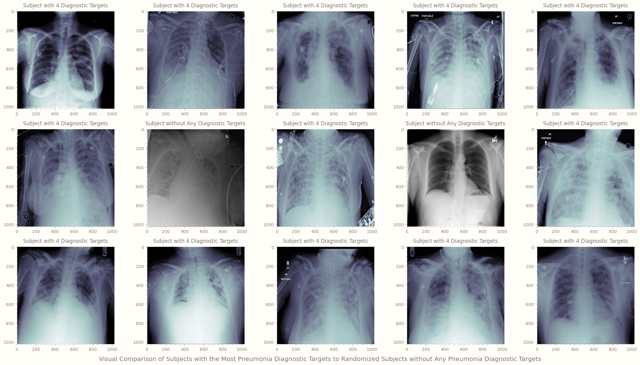

In [12]:
def image_display(image, ax, title, cmap):
    ax.imshow(image, cmap)
    ax.grid(False)
    ax.set_title(title, loc="center", pad=10)
    x_ticks = list(range(0, image.shape[1], 200))
    y_ticks = list(range(0, image.shape[0], 200))
    ax.set(xticks=x_ticks, xticklabels=x_ticks, yticks=y_ticks, yticklabels=y_ticks)
    ax.set_xlim(left=0)
    ax.set_ylim(top=0)
    ax.minorticks_on()
    return ax


ROOT_PATH = Path(
    "../../Datasets/Kaggle - RSNA Pneumonia Detection Challenge/stage_2_train_images/"
)

fig, axs = plt.subplots(3, 5, figsize=(figure_size[0] / 3 * 4, figure_size[1] / 3 * 4))

c = 0
for i, ax in enumerate(axs.flat):
    untargeted = iter(
        deduplicated_labels.loc[deduplicated_labels["Target"] == 0].sample(2)[
            "patientId"
        ]
    )
    if i not in [6, 8]:
        patient_id = most_tagged_IDs.patientId.iloc[c]
        dcm_path = ROOT_PATH / patient_id
        # The `with_suffix` function from the `pathlib.PurePath` class returns a new path
        # with the suffix changed. Note that if the original path has no suffix, the specified
        # argument `suffix` is appended instead; if the specified argument `suffix` is an empty
        # string, the original suffix is removed.
        dcm_path = dcm_path.with_suffix(suffix=".dcm")
        dcm = pydicom.read_file(dcm_path).pixel_array
        targets = most_tagged_IDs["Target"].iloc[c]
        title = f"Subject with {targets} Diagnostic Targets"
        image_display(dcm, ax, title, "bone")
        c += 1
    else:
        patient_id = next(untargeted)
        dcm_path = ROOT_PATH / patient_id
        dcm_path = dcm_path.with_suffix(".dcm")
        dcm = pydicom.read_file(dcm_path).pixel_array
        title = "Subject without Any Diagnostic Targets"
        image_display(dcm, ax, title, "gray")

fig.suptitle(
    "Visual Comparison of Subjects with the Most Pneumonia Diagnostic Targets to Randomized "
    "Subjects without Any Pneumonia Diagnostic Targets",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc5_1_2_'></a>[Preprocessing of DICOM Files in the Original Training Dataset](#toc0_)

**Digital Imaging and Communications in Medicine (_DICOM_)**

- Digital Imaging and Communications in Medicine (_DICOM_) is a standard for the storing and transferring medical images and related information that specifies a non-proprietary data exchange protocol designed to facilitate the transmission of images between machines from different manufacturers.

- Bits Stored (0028,0101) Attribute: the number of bits stored for each pixel sample. Note that the number of bits stored for each sample must be the same.


In [13]:
SAVE_PATH = Path("processed/")

for c, patient_id in enumerate(tqdm(deduplicated_labels.patientId)):
    dcm_path = ROOT_PATH / patient_id
    dcm_path = dcm_path.with_suffix(".dcm")
    bits_stored = pydicom.read_file(dcm_path).BitsStored
    dcm = pydicom.read_file(dcm_path).pixel_array / (np.power(2, bits_stored) - 1)
    # Resize the original image to 224 x 224 to reduce the processing load on the deep learning
    # model. Meanwhile, when storing the image, the image is converted to the half-precision
    # data type to reduce the amount of space used. Because in computing, half-precision
    # (sometimes referred to as FP16 or float16) is a binary floating-point computer number
    # format that occupies two bytes in computer memory and is used to represent numbers with
    # small storage space and low precision.
    dcm_array = cv2.resize(dcm, (224, 224)).astype(np.float16)

    # Retrieve the corresponding label for each image.
    label = deduplicated_labels.Target.iloc[c]
    # Split the original training dataset into a processed training dataset and a processed
    # validation dataset.
    train_or_val = "train" if c < 24000 else "val"
    # Divide each of the two freshly split datasets into labeled subsets based on their labels.
    current_save_path = ROOT_PATH / SAVE_PATH / train_or_val / str(label)
    # The `mkdir` function from the `pathlib.Path` class creates a new directory at the given
    # path. If the argument `parents` is False (the default is False), the `FileNotFoundError`
    # exception is raised if the parent directory is missing; otherwise, it creates the missing
    # parent directory under the path as needed. As well, if the argument `exist_ok` is False
    # (the default is False), it raises the `FileExistsError` exception in case the given path
    # already exists on the file system; otherwise it is ignored if the given path already
    # exists and is not a directory.
    current_save_path.mkdir(parents=True, exist_ok=True)
    np.save(file=current_save_path / patient_id, arr=dcm_array)

tabulation = Form_Generator()
tabulation.heading_printer("Preprocessing and Splitting the Original Training Dataset")

statements = [
    """
SAVE_PATH = Path("processed/")

for c, patient_id in enumerate(tqdm(deduplicated_labels.patientId)):
    dcm_path = ROOT_PATH / patient_id
    dcm_path = dcm_path.with_suffix(".dcm")
    bits_stored = pydicom.read_file(dcm_path).BitsStored
    dcm = pydicom.read_file(dcm_path).pixel_array / (np.power(2, bits_stored) - 1)
    dcm_array = cv2.resize(dcm, (224, 224)).astype(np.float16)

    label = deduplicated_labels.Target.iloc[c]
    train_or_val = "train" if c < 24000 else "val"
    current_save_path = ROOT_PATH / SAVE_PATH / train_or_val / str(label)
    current_save_path.mkdir(parents=True, exist_ok=True)
    np.save(file=current_save_path / patient_id, arr=dcm_array)
"""
]
tabulation.statement_generator(statements)

variables = ["bits_stored", "dcm", "dcm_array", "label", "train_or_val"]
values = [
    str(bits_stored),
    str(reprlib_rules.repr(dcm)),
    str(reprlib_rules.repr(dcm_array)),
    str(label),
    str(train_or_val),
]
tabulation.variable_generator(variables, values)

expressions = ["dcm.shape", "dcm_array.shape"]
results = [str(dcm.shape), str(dcm_array.shape)]
tabulation.expression_generator(expressions, results)

  0%|          | 0/26684 [00:00<?, ?it/s]

Preprocessing and Splitting the Original Training Dataset

    +----------------------------------------------------------+
    | Statement                                                |
    +----------------------------------------------------------+
    | SAVE_PATH = Path("processed/")                           |
    |                                                          |
    | for c, patient_id in                                     |
    |     enumerate(tqdm(deduplicated_labels.patientId)):      |
    |     dcm_path = ROOT_PATH / patient_id                    |
    |     dcm_path = dcm_path.with_suffix(".dcm")              |
    |     bits_stored = pydicom.read_file(dcm_path).BitsStored |
    |     dcm = pydicom.read_file(dcm_path).pixel_array /      |
    |     (np.power(2, bits_stored) - 1)                       |
    |     dcm_array = cv2.resize(dcm, (224,                    |
    |     224)).astype(np.float16)                             |
    |                          

In [14]:
processed_path = ROOT_PATH / SAVE_PATH

sums = 0
sums_squared = 0
count = 0

# Calculate dataset statistics using only the processed training dataset.
for processed_array_path in processed_path.glob("train/*/*"):
    # The`numpy.load` function can load arrays or pickled objects from `.npy`, `.npz`, or
    # pickle files.
    processed_array = np.load(processed_array_path)
    normalizer = processed_array.shape[0] * processed_array.shape[1]
    sums += np.sum(processed_array) / normalizer
    sums_squared += (np.power(processed_array, 2).sum()) / normalizer
    count += 1

mean = sums / count
std = np.sqrt(sums_squared / count - (mean**2))

tabulation = Form_Generator()
tabulation.heading_printer("Statistical Computing on the Processed Training Dataset")

statements = [
    """
processed_path = ROOT_PATH / SAVE_PATH

sums = 0
sums_squared = 0
count = 0

for processed_array_path in processed_path.glob("train/*/*"):
    processed_array = np.load(processed_array_path)
    normalizer = processed_array.shape[0] * processed_array.shape[1]
    sums += np.sum(processed_array) / normalizer
    sums_squared += (np.power(processed_array, 2).sum()) / normalizer
    count += 1

mean = sums / count
std = np.sqrt(sums_squared / count - (mean**2))
"""
]
tabulation.statement_generator(statements)

variables = [
    "processed_array",
    "count",
    "normalizer",
    "sums",
    "sums_squared",
    "mean",
    "std",
]
values = [
    str(reprlib_rules.repr(processed_array)),
    str(count),
    str(normalizer),
    str(sums),
    str(sums_squared),
    str(mean),
    str(std),
]
tabulation.variable_generator(variables, values)

expressions = ["processed_array.shape"]
results = [str(processed_array.shape)]
tabulation.expression_generator(expressions, results)

Statistical Computing on the Processed Training Dataset

    +------------------------------------------------------------+
    | Statement                                                  |
    +------------------------------------------------------------+
    | processed_path = ROOT_PATH / SAVE_PATH                     |
    |                                                            |
    | sums = 0                                                   |
    | sums_squared = 0                                           |
    | count = 0                                                  |
    |                                                            |
    | for processed_array_path in                                |
    |     processed_path.glob("train/*/*"):                      |
    |     processed_array = np.load(processed_array_path)        |
    |     normalizer = processed_array.shape[0] *                |
    |     processed_array.shape[1]                               |
    |

## <a id='toc5_2_'></a>[Train - Part One - Data Loading](#toc0_)

### <a id='toc5_2_1_'></a>[Data Transformation](#toc0_)

**The `torchvision.transforms` Module**

- The `torchvision.transforms` module in the torchvision library supports common computer vision transformations i.e., transforming or augmenting data for training or inference on different tasks (image classification, detection, segmentation, video classification).

  > **Tips**
  >
  > - In order to make reliable predictions, deep learning models usually require a large amount of training data, which is not always available, and thus require augmentation of existing data to build better generalized models.
  >
  > - Data augmentation is a technique to increase the amount of data used to train a model.
  >
  > - The most commonly used image data augmentation techniques include _positional augmentation_ (e.g., scaling, cropping, flipping, padding, rotation, translation, affine transformation) and _color augmentation_ (e.g., brightness, contrast, saturation, hue).

- The `torchvision.transforms.Compose` class: composes several transforms together.

  - The argument `transforms`: the list of transforms to compose.

- The `torchvision.transforms.Normalize` class: normalizes the tensor image with mean and standard deviation.

  - The argument `inplace`: indicates whether used to make this operation in-place, defaults to False.

- The `torchvision.transforms.RandomAffine` class: sets up a random affine transformation of the image, by keeping the center invariant. Note that if the image is a PyTorch tensor, its shape should be [... , H, W], where ... denotes an arbitrary number of leading dimensions.

  - The argument `degrees`: the range of degrees to be selected. Note that if it is a number and not a sequence like (min, max), the range of degrees will be between its positive and negative absolute values, if it is set to 0, it means that the rotation is deactivated.

  - The argument `translate`: the maximum absolute fraction tuple for horizontal and vertical translation.

  - The argument `scale`: the scaling factor interval.

- The `torchvision.transforms.RandomResizedCrop` class: crops a random portion of the image and resizes it to a given size.

  - The argument `size`: the expected size of the cropping output for each edge.

  - The argument `scale`: specifies the upper and lower bounds for cropping a random area before resizing.

  - The argument `ratio`: specifies the upper and lower bounds of the random aspect ratio for cropping before resizing.

  - The argument `antialias`: indicates whether antialiasing is applied. Note that it only affects tensors with bilinear or bicubic modes; otherwise it is ignored.


In [15]:
train_transforms = transforms.Compose(
    transforms=[
        transforms.ToTensor(),
        transforms.Normalize(mean, std, inplace=False),
        transforms.RandomAffine(degrees=(-5, 5), translate=(0, 0.05), scale=(0.9, 1.1)),
        transforms.RandomResizedCrop(size=(224, 224), scale=(0.35, 1), antialias=False),
    ]
)

# Data augmentation is only required for the processed training dataset, not the processed
# validation dataset.
val_transforms = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize(mean, std)]
)

tabulation = Form_Generator()
tabulation.heading_printer(
    "Defining Pipelines for Data Transformation and Data Augmentation"
)

statements = [
    """
train_transforms = transforms.Compose(
    transforms=[
        transforms.ToTensor(),
        transforms.Normalize(mean, std, inplace=False),
        transforms.RandomAffine(degrees=(-5, 5), translate=(0, 0.05), scale=(0.9, 1.1)),
        transforms.RandomResizedCrop(size=(224, 224), scale=(0.35, 1), antialias=False),
    ]
)

val_transforms = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize(mean, std)]
)
"""
]
tabulation.statement_generator(statements, 12)

variables = ["train_transforms", "val_transforms"]
values = [str(train_transforms), str(val_transforms)]
tabulation.variable_generator(variables, values, 4)

Defining Pipelines for Data Transformation and Data Augmentation

    +---------------------------------------------------------+
    | Statement                                               |
    +---------------------------------------------------------+
    | train_transforms = transforms.Compose(                  |
    |     transforms=[                                        |
    |         transforms.ToTensor(),                          |
    |         transforms.Normalize(mean, std, inplace=False), |
    |         transforms.RandomAffine(degrees=(-5, 5),        |
    |             translate=(0, 0.05), scale=(0.9, 1.1)),     |
    |         transforms.RandomResizedCrop(size=(224, 224),   |
    |             scale=(0.35, 1), antialias=False),          |
    |     ]                                                   |
    | )                                                       |
    |                                                         |
    | val_transforms = transforms.Comp

**The `torchvision.datasets` Module**

- The `torchvision.datasets` module in the _torchvision_ library provides several built-in datasets, along with utility classes for constructing users' own datasets.

- The `torchvision.datasets.DatasetFolder` class: a generic dataset loader with a custom root path and a custom function to load samples for the given path, which are set by the arguments `root` and `loader`.

  - The argument `root`: the root directory path.

  - The argument `loader`: the function to load a sample given its path.

  - The argument `extensions`: the list of allowed extensions.

  - The argument `transform`: the function/transformation that takes the sample and returns the transformed version.


In [16]:
def load_file(path):
    # Since the data was previously stored as float16 to reduce space, a reconversion to
    # float32 is required to improve calculation accuracy.
    return np.load(path).astype(np.float32)


train_dataset = datasets.DatasetFolder(
    root=f"{ROOT_PATH}/{SAVE_PATH}/train/",
    loader=load_file,
    extensions=["npy"],
    transform=train_transforms,
)
# The `np.unique` function returns the sorted unique elements of the array, where the argument
# `ar` denotes the input array, and if the optional argument `return_counts` is True, it also
# returns the number of times each unique item appears in the input array.
train_targets = np.unique(ar=train_dataset.targets, return_counts=True)

val_dataset = datasets.DatasetFolder(
    f"{ROOT_PATH}/{SAVE_PATH}/val/",
    loader=load_file,
    extensions="npy",
    transform=val_transforms,
)
val_targets = np.unique(val_dataset.targets, return_counts=True)


tabulation = Form_Generator()
tabulation.heading_printer(
    "Loading the Processed Training Dataset and the Processed Validation Dataset"
)

definitions = [
    """
def load_file(path):
    return np.load(path).astype(np.float32)
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
train_dataset = datasets.DatasetFolder(
    root=f"{ROOT_PATH}/{SAVE_PATH}/train/",
    loader=load_file,
    extensions=["npy"],
    transform=train_transforms,
)
train_targets = np.unique(ar=train_dataset.targets, return_counts=True)

val_dataset = datasets.DatasetFolder(
    f"{ROOT_PATH}/{SAVE_PATH}/val/",
    loader=load_file,
    extensions="npy",
    transform=val_transforms,
)
val_targets = np.unique(val_dataset.targets, return_counts=True)
"""
]
tabulation.statement_generator(statements)

variables = ["train_dataset", "train_targets", "val_dataset", "val_targets"]
values = [
    str(reprlib_rules.repr(train_dataset)),
    str(train_targets),
    str(reprlib_rules.repr(val_dataset)),
    str(val_targets),
]
tabulation.variable_generator(variables, values)

expressions = [
    "len(train_dataset)",
    "train_dataset[0]",
    "type(train_dataset[0])",
    "len(train_dataset[0])",
    "train_dataset[0][0].shape",
    "len(val_dataset)",
    "val_dataset[0]",
    "type(val_dataset[0])",
    "len(val_dataset[0])",
    "val_dataset[0][0].shape",
]
results = [
    str(len(train_dataset)),
    str(reprlib_rules.repr(train_dataset[0])),
    str(type(train_dataset[0])),
    str(len(train_dataset[0])),
    str(train_dataset[0][0].shape),
    str(len(val_dataset)),
    str(reprlib_rules.repr(val_dataset[0])),
    str(type(val_dataset[0])),
    str(len(val_dataset[0])),
    str(train_dataset[0][0].shape),
]
tabulation.expression_generator(expressions, results, 2)

Loading the Processed Training Dataset and the Processed Validation Dataset

    +---------------------------------------------+
    | Definition                                  |
    +---------------------------------------------+
    | def load_file(path):                        |
    |     return np.load(path).astype(np.float32) |
    +---------------------------------------------+
    +-----------------------------------------------------+
    | Statement                                           |
    +-----------------------------------------------------+
    | train_dataset = datasets.DatasetFolder(             |
    |     root=f"{ROOT_PATH}/{SAVE_PATH}/train/",         |
    |     loader=load_file,                               |
    |     extensions=["npy"],                             |
    |     transform=train_transforms,                     |
    | )                                                   |
    | train_targets = np.unique(ar=train_dataset.targets, |
    |     r

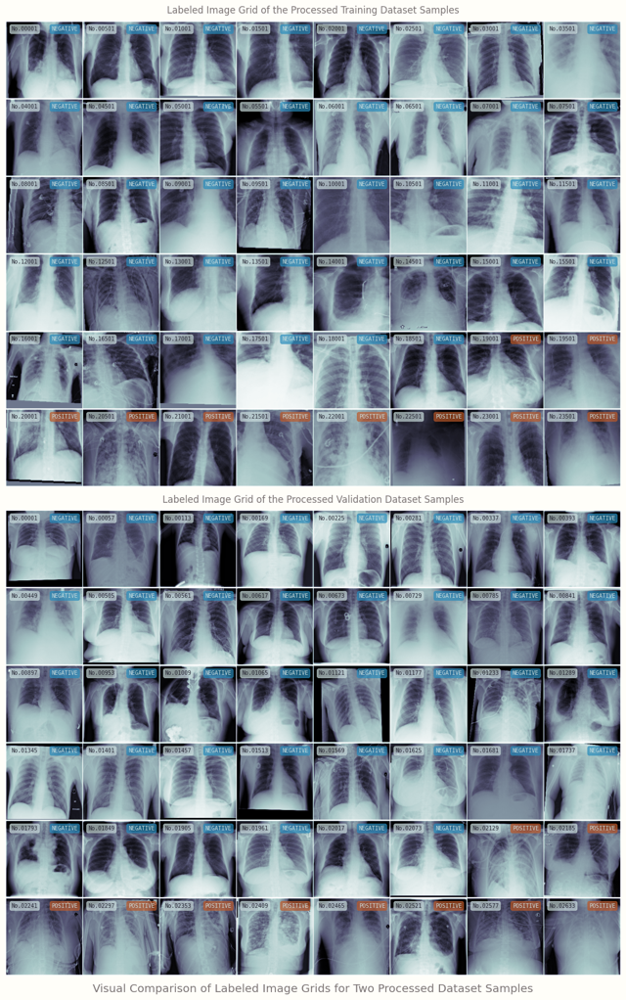

In [17]:
# Create a new class for each dataset and add indexes so that the data can be retrieved later
# by the indexes.
class Training_Dataset(Dataset):
    def __init__(self):
        global train_transforms, ROOT_PATH, SAVE_PATH
        self.dataset = datasets.DatasetFolder(
            root=f"{ROOT_PATH}/{SAVE_PATH}/train/",
            loader=load_file,
            extensions="npy",
            transform=train_transforms,
        )

    def __getitem__(self, index):
        data, target = self.dataset[index]
        return data, target, index

    def __len__(self):
        return len(self.dataset)


class Validation_Dataset(Dataset):
    def __init__(self):
        global val_transforms, ROOT_PATH, SAVE_PATH
        self.dataset = datasets.DatasetFolder(
            f"{ROOT_PATH}/{SAVE_PATH}/val/",
            loader=load_file,
            extensions="npy",
            transform=val_transforms,
        )

    def __getitem__(self, index):
        data, target = self.dataset[index]
        return data, target, index

    def __len__(self):
        return len(self.dataset)


def annotation_color(cmap):
    cmap_color = mpl.colormaps[cmap]
    return cmap_color(0.85)


def positive_negative(labels):
    return ["positive" if label == 1 else "negative" for label in labels]


def title_adder(func):
    @wraps(func)
    def wrapper(input, ax, title=None, **kwargs):
        if title is None:
            dataset = "Training" if input == indexed_train_dataset else "Validation"
            title = f"Labeled Image Grid of the Processed {dataset} Dataset Samples"
        func(input, ax, **kwargs)
        ax.set_title(
            label=title,
            loc="center",
            pad=10,
        )

    return wrapper


def grid_annotator(func):
    @wraps(func)
    def wrapper(*args, fontsize_adjustment=0, show_index=True, preds=None, **kwargs):
        global colors
        labels, indexes, positions, cmap, ax = func(*args, **kwargs)
        x_positions_1, x_positions_2, y_positions_1, y_positions_2 = positions
        labels = positive_negative(labels)
        font_color = mpl.colormaps[cmap](0.15)
        if show_index == True:
            for (y_1, x_1), index in zip(
                itertools.product(y_positions_1, x_positions_1), indexes
            ):
                bbox_props = dict(
                    boxstyle="round",
                    ec=annotation_color(cmap),
                    fc=annotation_color(cmap),
                    alpha=0.67,
                )
                text = f"No.{(index + 1):>05}"
                ax.text(
                    x_1,
                    y_1,
                    text,
                    bbox=bbox_props,
                    transform=ax.transData,
                    fontsize=7 + fontsize_adjustment,
                    fontfamily="monospace",
                    c=font_color,
                    zorder=2,
                )

        colors_dict = {"positive": colors[0], "negative": colors[1]}
        for (y_1, x_2), label in zip(
            itertools.product(y_positions_1, x_positions_2), labels
        ):
            bbox_props = dict(
                boxstyle="round",
                ec=colors_dict[label],
                fc=colors_dict[label],
                alpha=0.67,
            )
            text = f"{label}"
            ax.text(
                x_2,
                y_1,
                text.upper(),
                bbox=bbox_props,
                transform=ax.transData,
                fontsize=7 + fontsize_adjustment,
                fontfamily="monospace",
                c=annotation_color(cmap),
                zorder=2,
            )

        if preds is not None:
            preds = positive_negative(preds)
            colors_dict = {"positive": colors[0], "negative": colors[1]}
            for (y_2, x_1), (y_2, x_2), label, pred in zip(
                itertools.product(y_positions_2, x_positions_1),
                itertools.product(y_positions_2, x_positions_2),
                labels,
                preds,
            ):
                bbox_props_1 = dict(
                    boxstyle="round",
                    ec=colors_dict[pred],
                    fc=colors_dict[pred],
                    alpha=0.67,
                )
                text_1 = f"{pred}"
                ax.text(
                    x_2,
                    y_2,
                    text_1.upper(),
                    bbox=bbox_props_1,
                    transform=ax.transData,
                    fontsize=7 + fontsize_adjustment,
                    fontfamily="monospace",
                    c=annotation_color(cmap),
                    zorder=2,
                )
                if label == "positive":
                    text_2 = "TP" if pred == "positive" else "FN"
                    color = colors[2] if pred == "positive" else colors[3]
                else:
                    text_2 = "TN" if pred == "negative" else "FP"
                    color = colors[4] if pred == "positive" else colors[5]
                bbox_props_2 = dict(
                    boxstyle="circle",
                    ec=color,
                    fc=color,
                    alpha=0.67,
                )
                ax.text(
                    x_1,
                    y_2,
                    text_2.upper(),
                    bbox=bbox_props_2,
                    transform=ax.transData,
                    fontsize=7 + fontsize_adjustment,
                    fontfamily="monospace",
                    c=annotation_color(cmap),
                    zorder=2,
                )

    return wrapper


@title_adder
@grid_annotator
def grid_DICOM_2D_image(input, ax, n=None, row_size=8, slice_interval=500, pad_value=1):
    if n is None:
        n = len(input)
    n = math.ceil(n / slice_interval)
    nrows = math.ceil(n / row_size)
    cmap = "bone"

    images, labels, indexes = [], [], []
    for i in range(len(input)):
        image, label, index = input[i]
        images.append(image)
        labels.append(label)
        indexes.append(index)
    # The `torch.cat` function concatenates the given sequence tensor by a given dimension.
    # The argument `dim` indicates the dimension over which the tensors are concatenated.
    images = torch.cat(images, dim=0).unsqueeze(1)
    images = images[::slice_interval, :, :, :]
    labels = labels[::slice_interval]
    indexes = indexes[::slice_interval]

    x_positions_1 = [
        math.ceil(
            x * images[:row_size].shape[3]
            + 0.075 * images[:row_size].shape[3]
            + pad_value * x * 2
        )
        for x in range(images[:row_size].shape[0])
    ]
    x_positions_2 = [
        math.ceil(
            x * images[:row_size].shape[3]
            + 0.6 * images[:row_size].shape[3]
            + pad_value * x * 2
        )
        for x in range(images[:row_size].shape[0])
    ]
    y_positions_1 = [
        math.ceil(
            y * images[:row_size].shape[2]
            + 0.125 * images[:row_size].shape[2]
            + pad_value * y * 4
        )
        for y in range(nrows)
    ]
    y_positions_2 = [
        math.ceil(
            y * images[:row_size].shape[2]
            + 0.875 * images[:row_size].shape[2]
            + pad_value * y * 4
        )
        for y in range(nrows)
    ]
    positions = [x_positions_1, x_positions_2, y_positions_1, y_positions_2]

    for i in range(nrows):
        if len(images) > row_size:
            row_images = images[:row_size]
            images = images[row_size:]
        else:
            row_images = images[:]
        grid_row = make_grid(
            row_images,
            nrow=row_size,
            normalize=True,
            pad_value=pad_value,
        )
        scalar_row = grid_row.numpy().transpose(1, 2, 0)[:, :, 0]
        if i == 0:
            if nrows != 1:
                scalar_image = scalar_row
            else:
                scalar_image = np.full(
                    (
                        scalar_row.shape[0],
                        math.ceil(scalar_row.shape[1] / images.shape[0] * row_size),
                    ),
                    np.nan,
                )
                scalar_image[:, : scalar_row.shape[1]] = scalar_row
        elif scalar_image.shape[1] == scalar_row.shape[1]:
            scalar_image = np.concatenate((scalar_image, scalar_row), axis=0)
        else:
            image_to_concat = np.full(
                (scalar_image.shape[0] + scalar_row.shape[0], scalar_image.shape[1]),
                np.nan,
            )
            image_to_concat[: scalar_image.shape[0], :] = scalar_image
            image_to_concat[scalar_image.shape[0] :, : scalar_row.shape[1]] = scalar_row
            scalar_image = image_to_concat
    ax.imshow(scalar_image, cmap=cmap, zorder=0)
    ax.set(xticks=[], yticks=[], frame_on=False)
    ax.grid(False)
    return labels, indexes, positions, cmap, ax


colors = calm_color_generator(2)
indexed_train_dataset = Training_Dataset()
indexed_val_dataset = Validation_Dataset()

fig, axs = plt.subplots(2, 1, figsize=(figure_size[0], figure_size[1] * 2))
grid_DICOM_2D_image(indexed_train_dataset, axs[0])
grid_DICOM_2D_image(indexed_val_dataset, axs[1], slice_interval=56)

fig.suptitle(
    "Visual Comparison of Labeled Image Grids for Two Processed Dataset Samples",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc5_2_2_'></a>[Batch Loading](#toc0_)

**The `torch.utils.data.DataLoader` Class**

- The `torch.utils.data.DataLoader` class: a data loader that combines a dataset with a sampler and provides an iterable over a given dataset. Note that this class supports mapped and iterable datasets, single- or multi-process loading, custom loading order, and optional automatic batching (collation) and memory pinning.

- The argument `batch_size`: indicates how many samples to load per batch, default value is 1.

- The argument `shuffle`: indicates whether the data is reshuffled at every epoch, the default value is False.

- The argument `num_workers`: indicates how many child processes will be used to load the data, the default value is 0.

  > **Tips**
  >
  > - When the argument `num_workers` is set to 0 (i.e., the default value), it means that the data will be loaded in the main process.
  >
  > - When the argument `num_workers` is set to greater than 0, PyTorch will use multiple processes to load the data, but the Jupyter Notebook (IPython kernel) does not support Python multiprocessing.


In [18]:
torch.manual_seed(101)
batch_size = 64
# Since Jupyter Notebook does not support Python multiprocessing, the argument `num_workers`
# can only be set to 0 here.
num_workers = 0

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True
)
val_loader = DataLoader(
    val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False
)

tabulation = Form_Generator()
tabulation.heading_printer("Configuring Batch Loading")

statements = [
    """
torch.manual_seed(101)
batch_size = 64
num_workers = 0

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True
)
val_loader = DataLoader(
    val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False
)
"""
]
tabulation.statement_generator(statements)

expressions = [
    "len(train_loader)",
    "len(train_loader.dataset)",
    "len(val_loader)",
    "len(val_loader.dataset)",
]
results = [
    str(len(train_loader)),
    str(len(train_loader.dataset)),
    str(len(val_loader)),
    str(len(val_loader.dataset)),
]
tabulation.expression_generator(expressions, results, 12)

Configuring Batch Loading

    +--------------------------------------------+
    | Statement                                  |
    +--------------------------------------------+
    | torch.manual_seed(101)                     |
    | batch_size = 64                            |
    | num_workers = 0                            |
    |                                            |
    | train_loader = DataLoader(                 |
    |     train_dataset, batch_size=batch_size,  |
    |     num_workers=num_workers, shuffle=True  |
    | )                                          |
    | val_loader = DataLoader(                   |
    |     val_dataset, batch_size=batch_size,    |
    |     num_workers=num_workers, shuffle=False |
    | )                                          |
    +--------------------------------------------+
    +---------------------------+--------+
    | Expression                | Result |
    +---------------------------+--------+
    | len(train_loader)     

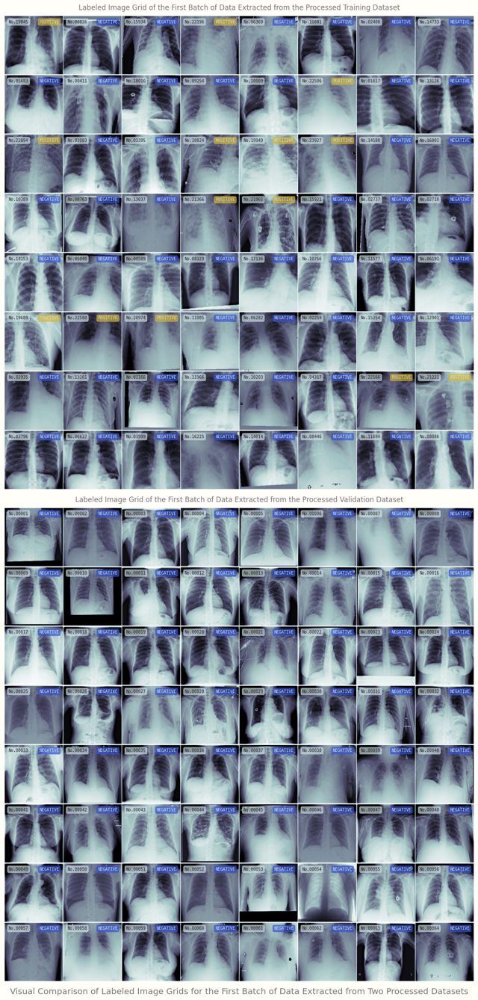

In [19]:
indexed_train_loader = DataLoader(
    indexed_train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True
)

indexed_val_loader = DataLoader(
    indexed_val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=False
)

for images, labels, indexes in indexed_train_loader:
    break
indexed_train_list = list(itertools.zip_longest(images, labels, indexes))

for images, labels, indexes in indexed_val_loader:
    break
indexed_val_list = list(itertools.zip_longest(images, labels, indexes))

colors = calm_color_generator(2)

fig, axs = plt.subplots(2, 1, figsize=(figure_size[0], figure_size[1] / 3 * 8))

grid_DICOM_2D_image(
    indexed_train_list,
    axs[0],
    slice_interval=1,
    title="Labeled Image Grid of the First Batch of Data Extracted from the Processed "
    "Training Dataset",
)
grid_DICOM_2D_image(
    indexed_val_list,
    axs[1],
    slice_interval=1,
    title="Labeled Image Grid of the First Batch of Data Extracted from the Processed "
    "Validation Dataset",
)

fig.suptitle(
    "Visual Comparison of Labeled Image Grids for the First Batch of Data Extracted from "
    "Two Processed Datasets",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc5_3_'></a>[Train - Part Two - Model Creation](#toc0_)

**_Residual Learning_ and _Identity Mapping_**

- Deep convolutional neural networks significantly improve image classification by using multiple layers to process different levels of features. The effectiveness of deep convolutional neural networks depends on their depth, but past experiments have shown that networks with deeper layers are not really better.

- Recent evidence demonstrates that the first problem faced by deep networks is the vanishing/exploding gradients, which can make it difficult for the network to converge. However, this issue is also effectively addressed through normalized initialization and intermediate normalization layers, allowing deep networks to converge.

- As deeper networks are able to start converging, deeper networks expose a second problem, degradation: the increase in depth of the network in turn decreases the accuracy of the network. However, this degradation problem is not caused by overfitting, because as the depth of the network increases, not only does the accuracy degrade rapidly after reaching saturation, but the training error of the model also increases.

- The degradation in training accuracy reveals that not all systems are similarly easy to optimize. In fact, for the deeper model, there exists a constructive solution: the added layers are _identity mapping_, while the other layers are copied from the shallower model that was learned. The existence of this constructed solution suggests that deeper models should not produce higher training errors than their shallower counterparts.

- Therefore, the deep _residual learning_ framework is proposed to address this degradation problem.

  - The goal is not to directly let every few stacked layers fit the desired underlying mapping, but to explicitly let these layers fit a residual mapping: assuming that the desired underlying mapping is $\mathcal{H}(\mathrm{x})$, the residual mapping to be fitted by the stacked nonlinear layers is $\mathcal{F}(\mathrm{x}) \coloneqq \mathcal{H}(\mathrm{x}) - \mathrm{x}$. Thus, the original mapping is reformulated as $\mathcal{F}(\mathrm{x}) + \mathrm{x}$.

  - As mentioned earlier, if the added layers can be constructed as _identity mappings_, the training error of a deeper model should not be larger than that of its corresponding shallow model. With the _residual learning_ recasts, if _identity mappings_ are optimal, the solver can approximate _identity mappings_ by simply setting the weights of multiple nonlinear layers (i.e., residual mappings) toward zero, which is much easier than fitting an _identity mapping_ by a stack of nonlinear layers.

  - In reality, _identity mappings_ are unlikely to be optimal, and the _residual learning_ reformulation can be helpful for preconditioning this problem. If the optimal function approaches an _identity mapping_ more closely than a zero mapping, it is much easier for the solver to find perturbations with respect to an _identity mapping_ than it is to learn a new function. Experiments show that the learned residual functions are generally smaller in response, suggesting that _identity mappings_ provide reasonable preconditioning.

  - The operation of the formula $\mathcal{F}(\mathrm{x}) + \mathrm{x}$ can be realized by feedforward neural networks with "shortcut connections" (i.e., connections that skip one or more layers) and element-wise addition.

    - In this _residual learning_ framework, the shortcut connections simply perform _identity mapping_, then add their outputs to the outputs of the stacked layers, and adopt a second nonlinearity after the addition, as shown below.

      ![Shortcut Connections](../../Images/Shortcut_Connections.png)

    - Since identity shortcut connections add no extra parameters or computational complexity, it is possible to make fair comparisons between plain and residual networks with the same parameters, depth, width, and computational cost (except for negligible element-wise additions). This not only applicable to fully-connected layers, but also to convolutional layers.

    - The entire network can still be trained end-to-end using SGD and backpropagation, and can be easily implemented using common libraries without modifying the solvers.

**Plain Network and _Residual Network_**

- The baselines of plain networks are mainly inspired by the philosophy of VGG networks. The convolutional layers mostly use $3 \times 3$ filters, which are directly downsampled by a convolutional layer with a stride of 2, and follow two simple design rules:

  1. Feature map size equal: the number of filters in each layer is the same;

  2. Feature map size halved: the number of filters in each layer is doubled to maintain the time complexity.

- Inserting shortcut connections on the above plain network enables it to be converted to its counterpart residual version, i.e., the _residual network_.

  - When the dimensions of the input and output feature maps are the same, the identity shortcuts can be used directly.

  - When the dimensions of the output feature maps increase compared to the dimensions of the counterpart input feature maps, the following two options can be considered, both of which perform a stride of 2 when the shortcuts go through feature maps of two sizes:

    1. Zero-padding shortcuts: shortcuts with this option still perform identity mapping, with extra zero entries padded for increasing dimensions, and this option introduces no extra parameter;

    2. Projection shortcuts: shortcuts with this option match dimensions by a $1 \times 1$ convolution.

- The detailed network architecture of the plain and _residual networks_ is shown below. For ease of representation, the 18/34/50/101/152-layer _residual network_ (ResNet) could be abbreviated as ResNet-18/34/50/101/152, respectively.

  ![Network Architecture](../../Images/Network_Architecture.png)

- It is worth noting that compared to the model of VGG networks (with the VGG-16/19 model as a reference), the model of 18/34/50/101/152-layer plain and _residual networks_ and has fewer filters and lower complexity.

> **Bibliographies**
>
> - [K. He, X. Zhang, S. Ren and J. Sun, "Deep Residual Learning for Image Recognition," 2016 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Las Vegas, NV, USA, 2016, pp. 770-778, doi: 10.1109/CVPR.2016.90.](https://arxiv.org/abs/1512.03385)


In [20]:
# Torchvision provides a new backwards compatible API for building models with multi-weight
# support, allowing different weights to be loaded in existing model builder methods, in which
# the argument `weights` defines the pre-training weights to be used, with the default value
# of None, i.e., no pre-training weights are used.
ResNet_18 = models.resnet18(weights=None)

tabulation = Form_Generator()
tabulation.heading_printer("Initial Understanding of the ResNet-18 Architecture")

statements = ["ResNet_18 = models.resnet18(weights=None)"]
tabulation.statement_generator(statements)

variables = ["ResNet_18"]
values = [str(reprlib_rules.repr(ResNet_18))]
tabulation.variable_generator(variables, values)

expressions = [
    "ResNet_18.conv1",
    "ResNet_18.avgpool",
    "ResNet_18.fc",
]
results = [
    str(ResNet_18.conv1),
    str(ResNet_18.avgpool),
    str(ResNet_18.fc),
]
tabulation.expression_generator(expressions, results, 7)

Initial Understanding of the ResNet-18 Architecture

    +-------------------------------------------+
    | Statement                                 |
    +-------------------------------------------+
    | ResNet_18 = models.resnet18(weights=None) |
    +-------------------------------------------+
    +-----------+------------------------------------------------+
    | Variable  | Value                                          |
    +-----------+------------------------------------------------+
    | ResNet_18 | ResNet(                                        |
    |           |   (conv1): Conv2d(3, 64, kernel_size=(7, 7),   |
    |           |         stride=(2, 2), padding=(3, 3),         |
    |           |         bias=False)                            |
    |           |   (bn1): BatchNorm2d(64, ep...    )            |
    |           |   )                                            |
    |           |   (avgpool): AdaptiveAvgPool2d(output_size=(1, |
    |           |         1

**The `lightning.pytorch.LightningModule` API**

- The `lightning.pytorch.LightningModule` API is one of the two core APIs for PyTorch Lightning, and it organizes PyTorch code into 6 sections:

  1. Initialization (the `__init__` and `setup` functions);
  
  2. Train loop (the `training_step`functions);
  
  3. Validation loop (the `validation_step` functions);
  
  4. Test loop (the `test_step` functions);
  
  5. Prediction loop (the `predict_step` functions);
  
  6. Optimizers and learning rate schedulers (the `configure_optimizers` functions).

- The `lightning.pytorch.LightningModule` API is equivalent to the `torch.nn.Module` class, but with added functionality and many convenient methods.

**The `torch.nn.BCEWithLogitsLoss` Class**

- The `torch.nn.BCEWithLogitsLoss` class combines the `torch.nn.Sigmoid` class with the `torch.nn.BCELoss` class in a single class.

  - The `torch.nn.Sigmoid` class: applies the element-wise logistic sigmoid function.
  
  	- The sigmoid function is any mathematical function whose graph has a characteristic S-shaped curve or sigmoid curve. There are a number of common sigmoid functions, such as the logistic function, the hyperbolic tangent, and the arctangent.
  	
  	- In some fields, notably artificial neural networks, the sigmoid function is often used to refer specifically to the logistic sigmoid function, which is a special form of the logistic function and a common example of the sigmoid function, usually denoted by $\sigma(x)$.
  	
  	- The logistic sigmoid function converts any real number in the domain $(-\infty, \infty)$ to a number between the codomain $(0, 1)$, and it is often useful in predicting probabilities and solving binary classification problems. More precisely, the logistic sigmoid function asymptotes at $\displaystyle{\lim_{x \to \infty} \sigma(x) = 1}$ and $\displaystyle{\lim_{x \to -\infty} \sigma(x) = 0}$, and crosses zero at $\sigma(x) = 0.5$. The formula is deduced as follows.
  	
  		$$\sigma(x) = \frac{1}{1 + e^{-x}} = \frac{e^{x}}{1 + e^{x}} = 1 - \frac{1}{1 + e^{x}} = 1 - \sigma(-x)$$
  	
  	- The derivative of the logistic sigmoid function is symmetric with respect to the y-axis and has a maximum at $\frac{d}{dx} \sigma(0) = 0.25$, with a codomain of $(0, 0.25]$. The derivative formula is deduced as follows.
  	
  		$$\frac{d}{dx} \sigma(x) = \frac{d}{dx} \left( \frac{1}{1 + e^{-x}} \right) = -\frac{1}{(1 + e^{-x})^2} \cdot \frac{d}{dx} (1 + e^{-x}) = -\frac{1}{(1 + e^{-x})^2} \cdot e^{-x} \cdot \frac{d}{dx} (-x) = \frac{e^{-x}}{(1 + e^{-x})^2} = \frac{1}{1 + e^{-x}} \cdot \left( 1 - \frac{1}{1 + e^{-x}} \right) = \sigma(x)(1 - \sigma(x))$$
  	
  	- There are two common problems with the logistic sigmoid function:
  	
  		1. The most common problem with the logistic sigmoid function is the vanishing gradient problem, which is commonly seen in multilayer neural networks that use logistic sigmoid functions. Since the derivatives of logistic sigmoid functions are very small, the derivatives become smaller and smaller when they are multiplied together during backpropagation, i.e., the smaller the gradients, the less effective the backpropagation will be.
  		
  		2. In addition, the logistic sigmoid function an activation function not zero-centered, which usually makes training a neural network more difficult and unstable. Therefore, for a neural network, a zero-centered activation function is preferred as it ensures that the average activation value is around zero, which helps in smoother and faster convergence during the training process.
  	
  	> **Tips**
	> 
  	> - The hyperbolic tangent (tanh) function is very similar to the logistic sigmoid function, although it has its own drawbacks. As an improved version of the logistic sigmoid function, it is commonly used as the activation function in the hidden layers of a recurrent neural network (RNN) which helps capture complex temporal dependencies and can handle both positive and negative values in sequential data, while the latter is often used in the output layer of a binary classification neural network. The function and derivative graphs of these two functions are shown below.
  	> 
  	> 	![Logistic Sigmoid and Hyperbolic Tangent](../../Images/Logistic_Sigmoid_and_Hyperbolic_Tangent.png)
  	> 
  	> - As shown above, the hyperbolic tangent function is a rescaling and stretching of the logistic sigmoid function with an output range of $(-1, 1)$, which can be thought of as a rescaled version of the latter. More precisely, the hyperbolic tangent function asymptotes at $\displaystyle{\lim_{x \to \infty} \tanh(x) = 1}$ and $\displaystyle{\lim_{x \to -\infty} \tanh(x) = -1}$, and crosses zero at $\tanh(x) = 0$. The formula is deduced as follows.
  	> 
  	> 	$$\tanh(x) = \frac{e^{x} - e^{-x}}{e^{x} + e^{-x}} = \frac{e^{2x} - 1}{e^{2x} + 1} = 2 \cdot \frac{e^{2x}}{1 + e^{2x}} - 1 = 2 \cdot \sigma(2x) − 1$$
  	> 
  	> The output of the hyperbolic tangent function is centered at the origin, which maps strongly positive (negative) inputs to positive (negative) outputs, respectively, with a codomain of $(-1, 1)$, and maps near-zero inputs to near-zero outputs, making the outputs near-zero in mean, which helps in centering the data. This allows for better weight initialization and faster convergence during training, which is an advantage over logistic sigmoid functions.
  	> 
  	> - The derivative of the hyperbolic tangent function is also symmetric with respect to the y-axis, which has a maximum at $\frac{d}{dx} \tanh(0) = 1$, with a codomain of $(0, 1]$. The derivative formula is deduced as follows.
  	> 
  	> 	$$\frac{d}{dx} \tanh(x) = \frac{(e^{x} + e^{-x}) \cdot \frac{d}{dx} (e^{x} - e^{-x}) - (e^{x} - e^{-x}) \cdot \frac{d}{dx} (e^{x} + e^{-x})}{(e^{x} + e^{-x})^2} = \frac{(e^{x} + e^{-x})^2 - (e^{x} - e^{-x})^2}{(e^{x} + e^{-x})^2} = 1 - \left( \frac{e^{x} - e^{-x}}{e^{x} + e^{-x}} \right) ^2 = 1 - \tanh^2(x)$$
  	> 
  	> - The gradient of the hyperbolic tangent function is steeper than that of the logistic sigmoid function, especially near the origin. The steeper gradient enables the network to obtain higher gradient values during backpropagation, thereby mitigating the vanishing gradient problem to some extent (which may still occur in deep networks), and fastening the learning and convergence of the network. This is another advantage over the latter.
  	> 
  	> - However, activation functions with saturated regions, such as the logistic sigmoid function and the hyperbolic tangent function, always fail to completely avoid the vanishing gradient problem during backpropagation.
  	
  - The `torch.nn.BCELoss` class: creates a criterion that measures the binary cross-entropy between the target and the input probabilities.
  
  	- The concept of information entropy was introduced by Claude Shannon in his monumental 1948 paper "A Mathematical Theory of Communication," hence it is also known as Shannon entropy. In information theory, the information entropy (or simply entropy) is a mathematical function that intuitively gives a measure of the uncertainty of the random variable; the larger the entropy, the less a priori information one has on the value of the random variable. In information theoretic terms, the information entropy of a system is the amount of "missing" information needed to determine a microstate, given the macrostate. 
  	
  	- In information theory, the information content is a basic quantity derived from the probability of a particular event occurring from a random variable, also known as Shannon information content. In other words, for an ensemble $X$ that can be represented as a triple $(x, \mathcal{A}_{X}, \mathcal{P}_{X})$, the information content $h(a_{i})$ is a natural measure of the information content of the event $x = a_{i}$, and hence the name of this quantity can be shortened to the self-information. The information content of an outcome $x$ is defined as follows.
  	
  		$$h(x) = \log_{b}\frac{1}{P(x)} = -\log_{b}P(x),$$
  		
  		where the outcome $x$ is the value of a random variable, which takes on one of a set of possible values, $\mathcal{A}_{X} = \{a_{1}, a_{2}, \cdots , a_{i}, \cdots , a_{I}\}$, having probabilities $\mathcal{P}_{X} = \{p_{1}, p_{2}, \cdots , p_{i}, \cdots , p_{I}\}$, with $P(x = a_{i}) = p_{i} \geq 0$ and $\displaystyle{\sum_{a_{i} \in \mathcal{A}_{X}}} P(x = a_{i}) = 1$. Note that, the name $\mathcal{A}$ is mnemonic for "alphabet," and $P(x = a_{i})$ may be written as $P(a_{i})$ or $P(x)$ for abbreviations. In addition, $b$ denotes the base of the logarithm, unless it is used to simplify the formula if necessary, which is currently not critical in this series of definitions, since it only affects the value by a multiplicative constant, and the common value of $b$ is $2$, which means measured in bits.
  		
  	- The information content is closely related to the entropy, which is the average amount of self-information that an observer would expect to obtain when measuring a random variable, while the latter is the expected value of the self-information of a random variable, quantifying the degree of surprise that the random variable "on average" is, and hence one could also say that the entropy is the measure of surprise of a specific event/random variable. The information entropy of an ensemble $X$ can be defined as the average information content of the following outcome, which can also be referred to as the uncertainty of $X$.
  	  	
  		$$H(X) \equiv \displaystyle{\sum_{x \in \mathcal{A}_{X}}} P(x) \cdot \log_{b}\frac{1}{P(x)} = -\displaystyle{\sum_{x \in \mathcal{A}_{X}}} P(x) \cdot \log_{b}P(x) = \mathbb{E} [-\log_{b}P(x)] = \mathbb{E} [h(x)],$$
  		
  		with the convention for $P(x) = 0$ that $0 \times \log \frac{1}{0} \equiv 0$, since $\lim_{\theta \rightarrow 0^+} \theta \log \frac{1}{\theta} = 0$.
  		
  	- The cross-entropy is a fundamental concept in information theory builds upon the idea of the information entropy and calculates the number of bits required to represent or transmit an average event from one distribution compared to another distribution. In simple terms, if there exists a target or underlying probability distribution (the true probability distribution) $P$ and an approximation of the target distribution (the predicted probability distribution) $Q$, then the cross-entropy of $Q$ from $P$ is the number of additional bits to represent an event using $Q$ instead of $P$. The cross-entropy between two probability distributions, such as Q from P, can be defined formally defined as follows.
  	
  		$$H(P, Q) = \displaystyle{\sum_{x \in \mathcal{A}_{X}}} P(x) \cdot \log_{b}\frac{1}{Q(x)} = -\displaystyle{\sum_{x \in \mathcal{A}_{X}}} P(x) \cdot \log_{b}Q(x),$$
  		
  		where $P(x)$ is the probability of event $x = a_{i}$ in the true probability distribution $\mathcal{P}_{X}$, and $Q(x)$ is the probability of event $x = a_{i}$ in the predicted probability distribution $\mathcal{Q}_{X}$.
  	
  	- The cross-entropy can be used to define a loss function in machine learning and optimization that is called the cross-entropy (CE) loss, also known as the log loss (or logarithmic loss or logistic loss) which can be applied to both binary and multi-class classification problems. The cross-entropy loss measures the performance of a classification model whose output is a probability value between $0$ and $1$ and which increases as the predicted probability diverges from the actual label, as defined below (as the average loss over all samples).
  	
  		$$L_{CE} = -\frac{1}{N} \sum_{i = 1}^{N} \sum_{j = 1}^{C} y_{ij} \cdot \log_{b}\hat{y}_{ij},$$
  		
  		where $N$ is the number of samples, $C$ is the number of classes, $y_{ij}$ is the true output for the $i$-th sample and $j$-th class, and $\hat{y}_{ij}$ is the predicted output of the current model for the $i$-th sample and $j$-th class.
  		
  	- More specifically, the binary cross-entropy (BCE) loss function, can be used to classify two possible classes from a binary regression model. And unlike in the multinomial logistic regression, in the binary (or binomial) logistic regression, the predicted probability distribution is not modeled using the softmax function, but is usually modeled using the logistic sigmoid function. Therefore, the definition of the binary cross-entropy loss function can be rewritten by the above cross-entropy loss function as follows.
  		
  		$$L_{BCE} = -\frac{1}{N} \sum_{i = 1}^{N} [y_{i} \cdot \log_{b}\hat{y}_{i} + (1 - y_{i}) \cdot \log_{b}(1 - \hat{y}_{i})],$$
  		
  		where $N$ is still the number of samples, $y_{i}$ is the true output for the $i$-th sample, and $\hat{y}_{i}$ is the predicted output of the current model for the $i$-th sample, which comes from a probability distribution modeled as the logistic sigmoid function.

- Using this recombined class at the input layer is numerically more stable than using a plain sigmoid function (the `torch.nn.Sigmoid` class) followed by the loss function based on the binary cross-entropy criterion (the `torch.nn.BCELoss` class), since combining these operations into a single layer facilitates the use of the log-sum-exp trick to improve numerical stability.

  - When implementing the binary cross-entropy loss, if the logistic sigmoid function $\sigma(x_{i})$ is computed first, and then inserting $\hat{y}_{i} = \sigma(x_{i})$ into the definition of the binary cross-entropy loss, at this point it will be found in practice that there is a problem: at the beginning of the training, a positive example may be confidently classified as a negative example at the beginning of training ($x_{i} \ll 0$, which means $y_{i} \approx 0$). However, if $y_{i}$ is small enough, it may be less than the smallest floating-point value, i.e., have a value of $0$. Then, if taking the logarithm of $0$ in the calculation of the binary cross-entropy loss, it gives $-\infty$, i.e., arithmetic underflow.
    
  - To tackle this potential numerical stability issue, the TensorFlow and PyTorch libraries usually combine the logistic sigmoid function and the binary cross-entropy loss into one. As shown below, the logistic sigmoid function is introduced into the binary cross-entropy loss formula and simplified by the quotient rule for logarithms $\log \frac{m}{n} = \log m - \log n$ and the power rule for logarithms $\log m^{k} = k \log m$ to obtain the simplified formula. However, the numerical stability problem is not completely controlled since if $x_{i}$ is a large negative number, $e^{-x_{i}}$ blow up, i.e., arithmetic overflow.
  
    \begin{align}
    L_{BCE} &= -\frac{1}{N} \sum_{i = 1}^{N} \left[y_{i} \cdot \log_{b} \frac{1}{1 + e^{-x_{i}}} + (1 - y_{i}) \cdot \log_{b} (1 - \frac{1}{1 + e^{-x_{i}}})\right] \notag \\
    &= -\frac{1}{N} \sum_{i = 1}^{N} [-y_{i} \cdot \log_{b} (1 + e^{-x_{i}}) + (1 - y_{i}) \cdot (\log_{b} e^{-x_{i}} - \log_{b} (1 + e^{-x_{i}}))] \notag \\
    &= -\frac{1}{N} \sum_{i = 1}^{N} [-y_{i} \cdot \log_{b} (1 + e^{-x_{i}}) - y_{i} \cdot \log_{b} e^{-x_{i}} + y_{i} \cdot \log_{b} (1 + e^{-x_{i}}) + \log_{b} e^{-x_{i}} - \log_{b} (1 + e^{-x_{i}})] \notag \\
    &= -\frac{1}{N} \sum_{i = 1}^{N} [-y_{i} \cdot \log_{b} e^{-x_{i}} + \log_{b} e^{-x_{i}} - \log_{b} (1 + e^{-x_{i}})] \notag \\
    &= -\frac{1}{N} \sum_{i = 1}^{N} [x_{i} \cdot y_{i} \log_{b} e - x_{i} \cdot \log_{b} e - \log_{b} (1 + e^{-x_{i}})] \notag
    \end{align}
    
  - To solve this potential problem, the log-sum-exp (LSE) trick is used to shift the center of the exponential sum, which is described as follows. Taking the following equation as an example, using the log-sum-exp trick forces the greatest value to be zero, even if other values would underflow. A typical manner of setting the value is to set an arbitrary $\alpha$ to its maximum $\alpha = \max\limits_{i} x_{i}$ so as to get a reasonable result.
  
  	$$\log_{e} \sum_{i = 1}^{N} e^{x_{i}} = \alpha + \log_{e} \sum_{i = 1}^{N} e^{x_{i}} - \alpha = \alpha + \log_{e} \sum_{i = 1}^{N} e^{x_{i}} - \log_{e} e^{\alpha} = \alpha + \log_{e} \sum_{i = 1}^{N} \frac{e^{x_{i}}}{e^{\alpha}} = \alpha + \log_{e} \sum_{i = 1}^{N} e^{x_{i} - \alpha}$$
  
  - It should be noted that before using the log-sum-exp trick, the base of the default logarithm should be set to Euler's number $e$, so that it is convenient to convert $\log_{b} b = 1$ when the argument and base of the logarithm are the same, and also to unify with the base of the logarithm in the log-sum-exp trick, which makes it easy to integrate them better.
  
  	$$L_{BCE} = -\frac{1}{N} \sum_{i = 1}^{N} [x_{i} \cdot y_{i} \log_{e} e - x_{i} \cdot \log_{e} e - \log_{e} (1 + e^{-x_{i}})] = \frac{1}{N} \sum_{i = 1}^{N} [\log_{e} (1 + e^{-x_{i}}) + x_{i} (1 - y_{i})]$$
  
  - After unifying the base of the logarithm, the formula can be further simplified using the log-sum-exp trick, as shown below. In addition to this, a very interesting discovery was noted that PyTorch uses the negative of the rectified linear unit (-ReLU) as $\alpha$, i.e., $\alpha = \max (-x_{i}, 0) = \begin{cases}0 &if\ x_{i} \geq 0,\\-x_{i} &otherwise.\end{cases}$, which is basically a clever way of avoiding positive exponents and thus avoiding overflow.

    \begin{align}
    L_{BCE} &= \frac{1}{N} \sum_{i = 1}^{N} [\log_{e} (1 + e^{-x_{i}}) + x_{i} (1 - y_{i}) + \log_{e} e^{-\alpha} + \alpha] \notag \\
    &= \frac{1}{N} \sum_{i = 1}^{N} [\log_{e} (1 + e^{-x_{i}}) \cdot e^{-\alpha} + x_{i} (1 - y_{i}) + \alpha] \notag \\
    &= \frac{1}{N} \sum_{i = 1}^{N} [\log_{e} (e^{-\alpha} + e^{-x_{i} - \alpha}) + x_{i} (1 - y_{i}) + \alpha] \notag
    \end{align}

\begin{align}
L*{BCE} &= -\frac{1}{N} \sum*{i = 1}^{N} [x*{i} \cdot y*{i} \log*{e} e - x*{i} \cdot \log*{e} e - \log*{e} (1 + e^{-x*{i}})] \notag \\
&= \frac{1}{N} \sum*{i = 1}^{N} [\log*{e} (1 + e^{-x*{i}}) + x*{i} (1 - y*{i})] \notag \\
&= \frac{1}{N} \sum*{i = 1}^{N} [\log_{e} (1 + e^{-x_{i}}) + x_{i} (1 - y_{i}) + \log_{e} e^{-\alpha} + \alpha] \notag \\
&= \frac{1}{N} \sum*{i = 1}^{N} [\log*{e} (1 + e^{-x*{i}}) \cdot e^{-\alpha} + x*{i} (1 - y*{i}) + \alpha] \notag \\
&= \frac{1}{N} \sum*{i = 1}^{N} [\log_{e} (e^{-\alpha} + e^{-x_{i} - \alpha}) + x_{i} (1 - y_{i}) + \alpha] \notag
\end{align}

- It should be noted that in this case, PyTorch uses the negative of the rectified linear unit (-ReLU) as $\alpha$, which is basically a clever way of avoiding taking positive exponents and thus avoiding overflow. The equation for $\alpha$ is shown below.$\alpha = \max (-x_{i}, 0) = \begin{cases}0 &if\ x_{i} \geq 0,\\-x_{i} &otherwise.\end{cases}$


In [21]:
class PneumoniaModel(pl.LightningModule):
    def __init__(self, weight):
        super().__init__()

        # Based on empirical studies and experience in training a model on these processed
        # datasets, it has been found that using pre-training weights leads to early saturation
        # of the model's learning capacity, at which point the model stops learning about the
        # general problem and begins to learn about the data, thus showing a decrease in the
        # training loss and an increase in the validation loss, i.e., overfitting.
        self.model = models.resnet18()
        # Since the images in these datasets are not default RGB color images, but grayscale
        # images, the model's first convolutional layer needs to be changed from the original
        # 3 input channels to 1 input channel.

        # Whether in the `torch.nn.Conv2d` class or the `torch.nn.Linear` class, the argument
        # `bias` defaults to True, indicating whether the layer learns an additive bias.
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        # Since both processed datasets contain only one binary class label, the argument
        # `out_features` for the last layer of the model, i.e., the fully connected (FC) layer,
        # needs to be changed from 1000 to 1, which refers to the Boolean result of the binary
        # class label.
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        # `nn.Sigmoid` applies the element-wise function:
        # Sigmoid(x) = σ(x) = 1 / (1 + exp(-x)) = exp(x) / (1 + exp(x)) = 1 - σ(-x)

        # `nn.BCELoss` creates a criterion that measures the Binary Cross Entropy between
        # the target and the input probabilities

        # The log-sum-exp trick helps prevent underflow/overflow errors, and is in essence
        # just taking advantage of mathematical properties to reduce underflow/overflow by
        # using the log-sum-exp function which computes a smoothed maximum, i.e., a smoothed
        # approximation of the maximum value function, and is mainly used in machine learning
        # algorithms

        # The parameter `pos_weight` denotes the weight of the positive example to be broadcast
        # with the target, which must be a tensor transformed by a list whose length can be 1
        # or equal to batch size

        # In short, the parameter `pos_weight` is a scalar indicating the weight of the
        # positive class

        # As can be seen from the visual comparisons above, there are more images without signs
        # of pneumonia than there are images with signs of pneumonia, which means that the
        # classes in these datasets are imbalanced

        # There are several ways to deal with imbalanced datasets, and weighted loss is one of
        # them; the parameter `pos_weight` provides a way to customize the weighted loss
        self.loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight]))

        # The `Accuracy` class in the `torchmetrics` module calculates accuracy by setting the
        # parameter `task` to either "binary", "multiclass" or "multilabel"
        self.train_acc = torchmetrics.Accuracy(task="binary")
        self.val_acc = torchmetrics.Accuracy(task="binary")
        self.training_step_outputs = []
        self.validation_step_outputs = []

    def forward(self, data):
        return self.model(data)

    def training_step(self, batch):
        x_ray, label = batch
        # Convert labels to float type for use in calculating loss
        label = label.float()
        # Here, the instance of the class `PneumoniaModel` inherited from the PyTorch Lightning
        # module is invoked as a function, which is actually a shorthand form of invoking the
        # `self.__call__` function

        # Need to make sure that the predictions and labels have the same shape, in this case
        # `self(x_ray)[:, 0]` works the same as `self(x_ray).view(-1)`
        pred = self(x_ray)[:, 0]
        loss = self.loss_fn(pred, label)
        self.training_step_outputs.append(loss)

        # Logs can be logged from anywhere in the LightningModule and its callbacks by using
        # the `log` or `log_dict` method

        # Batch loss and batch accuracy of the processed training dataset are logged here

        # The parameters `on_step`, `on_epoch`, and `prog_bar` in the `log` or `log_dict`
        # method respectively correspond to whether the log is logged at this step, whether
        # the accumulated metrics are logged epoch by epoch, and whether the log is logged
        # to the progress bar
        self.log_dict(
            {
                "Batch Training Loss": loss,
                # Since the prediction type is binary, this accuracy function expects the label
                # type to be an integer
                "Batch Training Accuracy": self.train_acc(
                    # Note that the default setting of the parameter `threshold` in the
                    # `Accuracy` class of the `torchmetrics` module is 0.5, indicating the
                    # threshold for transforming probabilities into binary predictions
                    # (i.e., 0, 1), but the current threshold for the predicted probabilities
                    # obtained from the training model is 0, so to resolve this issue, use the
                    # `torch.sigmoid` function to convert the current probability threshold
                    # from 0 to 0.5 to make the interval of probability between 0 and 1
                    torch.sigmoid(pred),
                    label.int(),
                ),
            },
            on_step=True,
            on_epoch=False,
            prog_bar=False,
        )
        # At the end of the `training_step` function, as with the `validation_step` function,
        # it is possible to return a tensor of loss or predictions, or a dictionary containing
        # the loss and predictions, etc., if it is needed for later in training

        # Importantly, when the internal variable `automatic_optimization` is set to the
        # default value of True, the loss returned from the `training_step` function will
        # be called to perform backward operations via the internal `backward` function

        # This is why the return of loss from the `training_step` function cannot be skipped,
        # even if the return is a dictionary in which the key "loss" and the value loss must
        # be preserved in this dictionary
        return {"loss": loss}

    # After one epoch the overall loss and accuracy of the processed training dataset is
    # computed
    def on_train_epoch_end(self):
        train_loss_epoch = torch.stack(self.training_step_outputs).mean()
        self.log(
            "Epoch Training Loss",
            train_loss_epoch,
            on_step=False,
            on_epoch=True,
            prog_bar=False,
        )
        # Use the `clear` method to remove all elements from the list to free up memory
        self.training_step_outputs.clear()

        self.log(
            "Epoch Training Accuracy",
            # The `compute` function is used to compute a final value from the state of
            # the metric, and can be used when implementing custom metrics
            self.train_acc.compute(),
            on_step=False,
            on_epoch=True,
            prog_bar=True,
        )

    # In general, the settings used in the `validation_step` function are almost identical to
    # those used in the `training_step` function
    def validation_step(self, batch):
        x_ray, label = batch
        label = label.float()
        pred = self(x_ray)[:, 0]
        loss = self.loss_fn(pred, label)
        self.validation_step_outputs.append(loss)

        # Batch loss and batch accuracy of the processed validation dataset are logged here
        self.log_dict(
            {
                "Batch Validation Loss": loss,
                "Batch Validation Accuracy": self.val_acc(
                    torch.sigmoid(pred), label.int()
                ),
            },
            on_step=True,
            on_epoch=False,
            prog_bar=False,
        )

    # After one epoch the overall loss and accuracy of the processed validation dataset is
    # computed
    def on_validation_epoch_end(self):
        val_loss_epoch = torch.stack(self.validation_step_outputs).mean()
        self.log(
            "Epoch Validation Loss",
            val_loss_epoch,
            on_step=False,
            on_epoch=True,
            prog_bar=False,
        )
        self.validation_step_outputs.clear()

        self.log(
            "Epoch Validation Accuracy",
            self.val_acc.compute(),
            on_step=False,
            on_epoch=True,
            prog_bar=True,
        )

    def configure_optimizers(self):
        # The `configure_optimizers` function selects which optimizers and learning rate
        # schedulers to use in model optimization

        # Normally only one optimizer is needed, in some cases more than one may be needed, but
        # optimization with multiple optimizers is only available in manual optimization mode

        # The return value of the `configure_optimizers` function can be an optimizer,
        # a list of optimizers or a tuple of optimizers, two lists, a dictionary, or None
        # (in which case no optimizer is used at runtime)
        return [self.optimizer]


# If the parameter `class_weight` is set to "balanced", `compute_class_weight` calculates the
# class weight according to the following formula: `n_samples / (n_classes * np.bincount(y))`
# where `np.bincount` calculates the number of times each value occurs in an array of
# non-negative integers

# The parameters `classes` and `y` denote the array of classes occurring in the data and
# the array of original class labels per sample respectively

# Since float64 is not supported by the MPS framework, it needs to be converted to float32
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=sorted(deduplicated_labels.Target.unique()),
    y=deduplicated_labels.Target,
).astype(np.float32)
model = PneumoniaModel(weight=class_weights[1] / class_weights[0])

tabulation = Form_Generator()
tabulation.heading_printer("Configuring PyTorch Lightning Training Section")


definitions = [
    """
class PneumoniaModel(pl.LightningModule):
    def __init__(self, weight):
        super().__init__()

        self.model = models.resnet18()
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight]))

        self.train_acc = torchmetrics.Accuracy(task="binary")
        self.val_acc = torchmetrics.Accuracy(task="binary")
        self.training_step_outputs = []
        self.validation_step_outputs = []

    def forward(self, data):
        return self.model(data)

    def training_step(self, batch):
        x_ray, label = batch
        label = label.float()
        pred = self(x_ray)[:, 0]
        loss = self.loss_fn(pred, label)
        self.training_step_outputs.append(loss)

        self.log_dict(
            {
                "Batch Training Loss": loss,
                "Batch Training Accuracy": self.train_acc(
                    torch.sigmoid(pred), label.int()
                ),
            },
            on_step=True,
            on_epoch=False,
            prog_bar=False,
        )
        return {"loss": loss}

    def on_train_epoch_end(self):
        train_loss_epoch = torch.stack(self.training_step_outputs).mean()
        self.log(
            "Epoch Training Loss",
            train_loss_epoch,
            on_step=False,
            on_epoch=True,
            prog_bar=False,
        )
        self.training_step_outputs.clear()

        self.log(
            "Epoch Training Accuracy",
            self.train_acc.compute(),
            on_step=False,
            on_epoch=True,
            prog_bar=True,
        )

    def validation_step(self, batch):
        x_ray, label = batch
        label = label.float()
        pred = self(x_ray)[:, 0]
        loss = self.loss_fn(pred, label)
        self.validation_step_outputs.append(loss)

        self.log_dict(
            {
                "Batch Validation Loss": loss,
                "Batch Validation Accuracy": self.val_acc(
                    torch.sigmoid(pred), label.int()
                ),
            },
            on_step=True,
            on_epoch=False,
            prog_bar=False,
        )

    def on_validation_epoch_end(self):
        val_loss_epoch = torch.stack(self.validation_step_outputs).mean()
        self.log(
            "Epoch Validation Loss",
            val_loss_epoch,
            on_step=False,
            on_epoch=True,
            prog_bar=False,
        )
        self.validation_step_outputs.clear()

        self.log(
            "Epoch Validation Accuracy",
            self.val_acc.compute(),
            on_step=False,
            on_epoch=True,
            prog_bar=True,
        )

    def configure_optimizers(self):
        return [self.optimizer]
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=sorted(deduplicated_labels.Target.unique()),
    y=deduplicated_labels.Target,
).astype(np.float32)
model = PneumoniaModel(weight=class_weights[1] / class_weights[0])
"""
]
tabulation.statement_generator(statements)

variables = ["class_weights", "model"]
values = [str(class_weights), str(reprlib_rules.repr(model))]
tabulation.variable_generator(variables, values)

expressions = [
    "model.model.conv1",
    "model.model.avgpool",
    "model.model.fc",
    "model.optimizer",
    "model.loss_fn",
    "model.train_acc",
    "model.val_acc",
]
results = [
    str(model.model.conv1),
    str(model.model.avgpool),
    str(model.model.fc),
    str(model.optimizer),
    str(model.loss_fn),
    str(model.train_acc),
    str(model.val_acc),
]
tabulation.expression_generator(expressions, results, 7)

Configuring PyTorch Lightning Training Section

    +-------------------------------------------------------------+
    | Definition                                                  |
    +-------------------------------------------------------------+
    | class PneumoniaModel(pl.LightningModule):                   |
    |     def __init__(self, weight):                             |
    |         super().__init__()                                  |
    |                                                             |
    |         self.model = models.resnet18()                      |
    |         self.model.conv1 = nn.Conv2d(                       |
    |             1, 64, kernel_size=(7, 7), stride=(2, 2),       |
    |     padding=(3, 3), bias=False                              |
    |         )                                                   |
    |         self.model.fc = nn.Linear(in_features=512,          |
    |     out_features=1, bias=True)                              |


## <a id='toc5_4_'></a>[Train - Part Three - Trainer](#toc0_)


In [22]:
# The parameter `monitors` indicates the quantity to monitor, the default value is None, i.e.,
# only the checkpoint of the last epoch is saved

# The parameter `save_top_k` can be set to any integer equal to or greater than -1

# If the parameter `save_top_k` is set to k, it means that the best k models according to the
# quantity monitored will be saved; if it is set to 0, it means that no models will be saved;
# and if it is set to -1, it means that all models will be saved

# The `mode` parameter should be one of the strings `min` and `max`, indicating that if
# `save_top_k` is not set to 0, the decision to overwrite the current save file is made
# based on either the maximization or the minimization of the monitored quantity
checkpoint_callback = ModelCheckpoint(
    monitor="Epoch Validation Accuracy", save_top_k=10, mode="max"
)

tabulation = Form_Generator()
tabulation.heading_printer("Configuring Checkpoints for Model Logging")

statements = [
    """
checkpoint_callback = ModelCheckpoint(
    monitor="Epoch Validation Accuracy", save_top_k=10, mode="max"
)
"""
]
tabulation.statement_generator(statements)

expressions = [
    "checkpoint_callback.state_key",
    "checkpoint_callback.monitor",
    "checkpoint_callback.mode",
]
results = [
    str(checkpoint_callback.state_key),
    str(checkpoint_callback.monitor),
    str(checkpoint_callback.mode),
]
tabulation.expression_generator(expressions, results, 1)

Configuring Checkpoints for Model Logging

    +---------------------------------------------------------+
    | Statement                                               |
    +---------------------------------------------------------+
    | checkpoint_callback = ModelCheckpoint(                  |
    |     monitor="Epoch Validation Accuracy", save_top_k=10, |
    |     mode="max"                                          |
    | )                                                       |
    +---------------------------------------------------------+
    +-------------------------------+----------------------------+
    | Expression                    | Result                     |
    +-------------------------------+----------------------------+
    | checkpoint_callback.state_key | ModelCheckpoint{'monitor': |
    |                               |  'Epoch Validation         |
    |                               |  Accuracy', 'mode': 'max', |
    |                               |  'eve

In [23]:
# The `Trainer` function in the LightningModule can be used to create a model trainer by
# customizing every aspect of training by flags, which can be customized by the parameters
# `accelerator`, `devices`, `logger` and `callbacks` for the type of accumulator, the device
# used, the experiment tracking logger, the callback or the list of callbacks, respectively

# In particular, the parameter `log_every_n_steps` indicates how often to log within steps,
# with a default value of 50, and the parameter `max_epochs` specifies a number of epochs,
# which the model trainer stops training once it is reached, with a default value of None
trainer = pl.Trainer(
    accelerator="mps",
    devices=1,
    logger=TensorBoardLogger(
        save_dir="../../Logs/",
        name="4 - Pneumonia-Classification",
    ),
    log_every_n_steps=1,
    callbacks=[checkpoint_callback, CustomProgressBar()],
    max_epochs=35,
)

# The `fit` function runs the full optimization routine for LightningModule's model trainer by
# setting the basic parameters `model`, `train_dataloaders` and `val_dataloaders`
trainer.fit(model=model, train_dataloaders=train_loader, val_dataloaders=val_loader)

tabulation = Form_Generator()
tabulation.heading_printer("Creating and Implementing Model Trainer")

statements = [
    """
trainer = pl.Trainer(
    accelerator="mps",
    devices=1,
    logger=TensorBoardLogger(
        save_dir="../../Logs/",
        name="4 - Pneumonia-Classification",
    ),
    log_every_n_steps=1,
    callbacks=[checkpoint_callback, CustomProgressBar()],
    max_epochs=35,
)

trainer.fit(model=model, train_dataloaders=train_loader, val_dataloaders=val_loader)
"""
]
tabulation.statement_generator(statements)

expressions = [
    "trainer.model",
    "trainer.optimizers",
    "trainer.lr_scheduler_configs",
    "trainer.device_ids",
    "trainer.max_epochs",
    "trainer.max_steps",
    "trainer.num_training_batches",
    "trainer.num_val_batches",
    "trainer.overfit_batches",
]
results = [
    str(reprlib_rules.repr(trainer.model)),
    str(trainer.optimizers),
    str(trainer.lr_scheduler_configs),
    str(trainer.device_ids),
    str(trainer.max_epochs),
    str(trainer.max_steps),
    str(trainer.num_training_batches),
    str(trainer.num_val_batches),
    str(trainer.overfit_batches),
]
tabulation.expression_generator(expressions, results, 3)

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


┏━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃   ┃ Name      ┃ Type              ┃ Params ┃
┡━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0 │ model     │ ResNet            │ 11.2 M │
│ 1 │ loss_fn   │ BCEWithLogitsLoss │      0 │
│ 2 │ train_acc │ BinaryAccuracy    │      0 │
│ 3 │ val_acc   │ BinaryAccuracy    │      0 │
└───┴───────────┴───────────────────┴────────┘

Trainable params: 11.2 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 11.2 M                                                                                               
Total estimated model params size (MB): 44

Output()

`Trainer.fit` stopped: `max_epochs=35` reached.


Creating and Implementing Model Trainer

    +-----------------------------------------------------------+
    | Statement                                                 |
    +-----------------------------------------------------------+
    | trainer = pl.Trainer(                                     |
    |     accelerator="mps",                                    |
    |     devices=1,                                            |
    |     logger=TensorBoardLogger(                             |
    |         save_dir="../../Logs/",                           |
    |         name="4 - Pneumonia-Classification",              |
    |     ),                                                    |
    |     log_every_n_steps=1,                                  |
    |     callbacks=[checkpoint_callback, CustomProgressBar()], |
    |     max_epochs=35,                                        |
    | )                                                         |
    |                              

## <a id='toc5_5_'></a>[Train - Part Four - Evaluation](#toc0_)

### <a id='toc5_5_1_'></a>[Saving and Restoring the Trained Model](#toc0_)


In [24]:
# Use the `save_checkpoint` function to manually save the model's checkpoints through the model
# trainer so that the model can be restored later from the saved checkpoints
ckpt_path = "../../Checkpoints/4 - Pneumonia-Classification/"
trainer.save_checkpoint(f"{ckpt_path}/weights.ckpt")

tabulation = Form_Generator()
tabulation.heading_printer("Saving the Trained Model to a Specified Checkpoint")

statements = [
    """
ckpt_path = "../../Checkpoints/4 - Pneumonia-Classification/"
trainer.save_checkpoint(f"{ckpt_path}/weights.ckpt")
"""
]
tabulation.statement_generator(statements)

expressions = [
    "trainer.callback_metrics",
]
results = [
    str(trainer.callback_metrics),
]
tabulation.expression_generator(expressions, results, 1)

Saving the Trained Model to a Specified Checkpoint

    +------------------------------------------------------+
    | Statement                                            |
    +------------------------------------------------------+
    | ckpt_path = "../../Checkpoints/4 -                   |
    |     Pneumonia-Classification/"                       |
    | trainer.save_checkpoint(f"{ckpt_path}/weights.ckpt") |
    +------------------------------------------------------+
    +--------------------------+----------------------------------+
    | Expression               | Result                           |
    +--------------------------+----------------------------------+
    | trainer.callback_metrics | {'Batch Training Loss':          |
    |                          |  tensor(0.4764), 'Batch Training |
    |                          |  Accuracy': tensor(0.7812),      |
    |                          |  'Epoch Validation Loss':        |
    |                          |  tensor(0.64

In [25]:
device = torch.device("mps:0" if torch.backends.mps.is_available() else "cpu")

# It is easy to load and instantiate the LightningModule directly from a checkpoint using the
# `load_from_checkpoint` function

# The parameter `weight` in the `load_from_checkpoint` function of the Lightning module is
# inherited from the initial function `__init__` of the instantiated class `PneumoniaModel`,
# so it can be set according to the settings used in the model training

# The parameter `strict` indicates whether it is strictly enforced that the key value in the
# checkpoint located by the parameter `checkpoint_path` matches the key value returned by the
# module's `state_dict`, which is set to True by default, although a setting of False is also
# acceptable in some special cases
model = PneumoniaModel.load_from_checkpoint(
    checkpoint_path=f"{ckpt_path}/weights.ckpt",
    weight=class_weights[1] / class_weights[0],
    strict=True,
)
# Remember that it is mandatory to call the `eval` function of this model to set dropout and
# batch normalization layers to evaluation mode before running the inference; otherwise it will
# lead to inconsistent inference results
model.eval()
model.to(device)

tabulation = Form_Generator()
tabulation.heading_printer("Restoring the Trained Model from a Specified Checkpoint")

statements = [
    """
device = torch.device("mps:0" if torch.backends.mps.is_available() else "cpu")

model = PneumoniaModel.load_from_checkpoint(
    checkpoint_path=f"{ckpt_path}/weights.ckpt",
    weight=class_weights[1] / class_weights[0],
    strict=True,
)
model.eval()
model.to(device)
"""
]
tabulation.statement_generator(statements)

variables = ["device", "model"]
values = [str(device), str(reprlib_rules.repr(model))]
tabulation.variable_generator(variables, values, 6)

expressions = [
    "model.model",
    "model.optimizer",
    "model.state_dict()",
    "model.device",
]
results = [
    str(reprlib_rules.repr(model.model)),
    str(model.optimizer),
    str(reprlib_rules.repr(model.state_dict())),
    str(model.device),
]
tabulation.expression_generator(expressions, results, 4)

Restoring the Trained Model from a Specified Checkpoint

    +---------------------------------------------------+
    | Statement                                         |
    +---------------------------------------------------+
    | device = torch.device("mps:0" if                  |
    |     torch.backends.mps.is_available() else "cpu") |
    |                                                   |
    | model = PneumoniaModel.load_from_checkpoint(      |
    |     checkpoint_path=f"{ckpt_path}/weights.ckpt",  |
    |     weight=class_weights[1] / class_weights[0],   |
    |     strict=True,                                  |
    | )                                                 |
    | model.eval()                                      |
    | model.to(device)                                  |
    +---------------------------------------------------+
    +----------+------------------------------------------------+
    | Variable | Value                                          |

### <a id='toc5_5_2_'></a>[Prediction and Evaluation of Validation Dataset](#toc0_)


In [26]:
preds = []
labels = []

with torch.no_grad():
    for data, label in tqdm(val_dataset):
        # Use the `torch.unsqueeze` method to add the batch dimension before the other
        # dimensions, as the trained model requires 4D inputs rather than 3D inputs
        data = data.to(device).float().unsqueeze(0)
        # As with the model trainer, the `torch.sigmoid` function here is equivalent to
        # manually adding the final softmax or sigmoid layer to the model that is imported
        # from the `torchvision.models` module

        # Don't forget to remove the batch channel dimension as it is no longer needed

        # Using the `cpu` function of the PyTorch tensor object returns a copy of that object
        # in CPU memory, but if the object is already in CPU memory and on the correct device,
        # the copy is not executed, and the original object is returned
        pred = torch.sigmoid(model(data)[0].cpu())
        preds.append(pred)
        labels.append(label)
preds = torch.tensor(preds)
labels = torch.tensor(labels).int()

tabulation = Form_Generator()
tabulation.heading_printer(
    "Computing Predictions on the Complete Processed Validation Dataset"
)

statements = [
    """
preds = []
labels = []

with torch.no_grad():
    for data, label in tqdm(val_dataset):
        data = data.to(device).float().unsqueeze(0)
        pred = torch.sigmoid(model(data)[0].cpu())
        preds.append(pred)
        labels.append(label)
preds = torch.tensor(preds)
labels = torch.tensor(labels).int()
"""
]
tabulation.statement_generator(statements)

variables = ["preds", "labels"]
values = [str(preds), str(labels)]
tabulation.variable_generator(variables, values)

expressions = [
    "model(data)[0].device",
    "model(data)[0].cpu().device",
    "preds.device",
    "labels.device",
    "len(preds)",
    "len(labels)",
]
results = [
    str(model(data)[0].device),
    str(model(data)[0].cpu().device),
    str(preds.device),
    str(labels.device),
    str(len(preds)),
    str(len(labels)),
]
tabulation.expression_generator(expressions, results)

  0%|          | 0/2684 [00:00<?, ?it/s]

Computing Predictions on the Complete Processed Validation Dataset

    +-----------------------------------------------------+
    | Statement                                           |
    +-----------------------------------------------------+
    | preds = []                                          |
    | labels = []                                         |
    |                                                     |
    | with torch.no_grad():                               |
    |     for data, label in tqdm(val_dataset):           |
    |         data = data.to(device).float().unsqueeze(0) |
    |         pred = torch.sigmoid(model(data)[0].cpu())  |
    |         preds.append(pred)                          |
    |         labels.append(label)                        |
    | preds = torch.tensor(preds)                         |
    | labels = torch.tensor(labels).int()                 |
    +-----------------------------------------------------+
    +----------+----------------

In [27]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()


def confusion_matrix(cm, labels, num=4):
    def string_alignment(line, num):
        new_line = "["
        for l in line:
            new_line += str(l).rjust(num) if l == line[0] else str(l).rjust(num + 1)
        new_line += "]"
        return new_line

    if isinstance(cm, (np.ndarray, torch.Tensor)):
        cm = cm.tolist()
    if isinstance(labels, torch.Tensor):
        labels = labels.unique().tolist()
    elif isinstance(labels, np.ndarray):
        labels = np.unique(labels).tolist()

    end = "\n\n"[:-1]
    length = len(cm)
    interval = "-" * (num - 1) + "|-"
    format_line = "[[" + interval * (length - 1) + "-" * (num - 1) + "|" + "]]" + end
    frame_line = "[[" + "=" * (len(format_line) - 5) + "]]"
    labels_line = f"[{string_alignment(labels, num)}]{end}"

    cm_lines = ""
    for i in cm:
        if i == cm[0]:
            cm_lines += f"[{string_alignment(i, num)}{end}"
        elif i == cm[-1]:
            cm_lines += f" {string_alignment(i, num)}]{end}"
        else:
            cm_lines += f" {string_alignment(i, num)}{end}"
    return frame_line + end + labels_line + format_line + cm_lines + frame_line


# Confusion matrix provides insight into the correctness of the predictions and how well the
# predicted values match the actual values, one such confusion matrix for binary classification
# is a two-by-two table consisting of the number of the four outcomes of a binary classifier

# The four outcomes obtained above through the binary classifier are TP, FN, TN and FP, which
# stand for true positive, false negative, true negative and false positive, respectively

# As with the `Accuracy` class, other classes from the `torchmetrics` module, such as the
# `Precision` class, the `Recall` class, and the `ConfusionMatrix` class, also require the
# parameter `task`, which needs to be set to "binary", "multiclass" or "multilabel" to specify
# the type of task, and the parameter `threshold`, which is used to indicate a threshold for
# transforming probabilities into binary predictions, if this parameter is ignored, the default
# setting of 0.5 will be used

# Normally, the parameter `num_classes` in the `ConfusionMatrix` class needs to be set to an
# integer to specify the number of labels, but when the parameter `task` is set to "binary",
# this parameter can be ignored and kept at the default value of None
cm = torchmetrics.ConfusionMatrix(task="binary", num_classes=2)(preds, labels)
# Accuracy is one of the simplest of all machine learning metrics, it is the ratio of the total
# number of correct predictions to the total number of predictions, and intuitively serves as
# a defining metric for a machine learning model, but usually precision and recall are also
# suggested

# Accuracy = (TP + TN) / (P + N) = (TP + TN) / (TP + FN + TN + FP)
acc = torchmetrics.Accuracy(task="binary")(preds, labels)
# Precision is the ratio between true positives and all positives, and may be more important in
# cases such as fraud detection, where it is better to avoid false positives and not accuse
# innocent people of fraud

# Precision = TP / (TP + FP) = 1 - FP / (TP + FP)
precision = torchmetrics.Precision(task="binary")(preds, labels)
# Recall is a measure of how well the model correctly identifies true positives, and thus
# a high recall is usually more important in cases such as medical diagnostics, where it is
# better to identify all possible disease cases (even if there will be a few false positives)
# than to miss any

# Recall = TP / P = TP / (TP + FN) = 1 - FN / (TP + FN) = 1 - FN / P
recall = torchmetrics.Recall(task="binary")(preds, labels)
# Due to data imbalances, a large number of false-negative results will appear in the processed
# training and validation datasets, and such a phenomenon is particularly serious in the field
# of medical imaging, as the missed results can be fatal, so to solve this problem, the model
# can be retrained with a new weighted loss, as mentioned earlier, or a simple alternative
# can be used, that is, to lower the classification thresholds, for example from 0.5 to 0.25,
# which reduces false negatives but increases the number of false positives, which is known as
# the precision-recall trade-off
cm_threshed = torchmetrics.ConfusionMatrix(task="binary", threshold=0.25)(preds, labels)
acc_threshed = torchmetrics.Accuracy(task="binary", threshold=0.25)(preds, labels)
precision_threshed = torchmetrics.Precision(task="binary", threshold=0.25)(
    preds, labels
)
recall_threshed = torchmetrics.Recall(task="binary", threshold=0.25)(preds, labels)

cprint("At a Threshold of 0.5".center(36), font_color, attrs=["bold"])
cprint("-" * 36, font_color)
cprint(
    "Confusion Matrix: ",
    font_color,
    attrs=["bold"],
)
cprint(confusion_matrix(cm, labels), font_color)
cprint("Validation Accuracy: ", font_color, attrs=["bold"], end="")
cprint(f"{acc:.7f}", font_color)
cprint("Validation Precision: ", font_color, attrs=["bold"], end="")
cprint(f"{precision:.7f}", font_color)
cprint("Validation Recall: ", font_color, attrs=["bold"], end="")
cprint(f"{recall:.7f}", font_color, end="\n\n")
cprint("At a Threshold of 0.25".center(36), font_color, attrs=["bold"])
cprint("-" * 36, font_color)
cprint(
    "Confusion Matrix: ",
    font_color,
    attrs=["bold"],
)
cprint(
    confusion_matrix(cm_threshed, labels),
    font_color,
)
cprint("Validation Accuracy: ", font_color, attrs=["bold"], end="")
cprint(f"{acc_threshed:.7f}", font_color)
cprint("Validation Precision: ", font_color, attrs=["bold"], end="")
cprint(f"{precision_threshed:.7f}", font_color)
cprint("Validation Recall: ", font_color, attrs=["bold"], end="")
cprint(f"{recall_threshed:.7f}", font_color, end="\n\n")

tabulation.heading_printer(
    "Improving Model Evaluation through a Precision-Recall Trade-off Approach"
)

definitions = [
    """
def confusion_matrix(cm, labels, num=4):
    def string_alignment(line, num):
        new_line = "["
        for l in line:
            new_line += str(l).rjust(num) if l == line[0] else str(l).rjust(num + 1)
        new_line += "]"
        return new_line

    if isinstance(cm, (np.ndarray, torch.Tensor)):
        cm = cm.tolist()
    if isinstance(labels, torch.Tensor):
        labels = labels.unique().tolist()
    elif isinstance(labels, np.ndarray):
        labels = np.unique(labels).tolist()

    end = "\n\n"[:-1]
    length = len(cm)
    interval = "-" * (num - 1) + "|-"
    format_line = "[[" + interval * (length - 1) + "-" * (num - 1) + "|" + "]]" + end
    frame_line = "[[" + "=" * (len(format_line) - 5) + "]]"
    labels_line = f"[{string_alignment(labels, num)}]{end}"

    cm_lines = ""
    for i in cm:
        if i == cm[0]:
            cm_lines += f"[{string_alignment(i, num)}{end}"
        elif i == cm[-1]:
            cm_lines += f" {string_alignment(i, num)}]{end}"
        else:
            cm_lines += f" {string_alignment(i, num)}{end}"
    return frame_line + end + labels_line + format_line + cm_lines + frame_line
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
cm = torchmetrics.ConfusionMatrix(task="binary", num_classes=2)(preds, labels)
acc = torchmetrics.Accuracy(task="binary")(preds, labels)
precision = torchmetrics.Precision(task="binary")(preds, labels)
recall = torchmetrics.Recall(task="binary")(preds, labels)
cm_threshed = torchmetrics.ConfusionMatrix(task="binary", threshold=0.25)(preds, labels)
acc_threshed = torchmetrics.Accuracy(task="binary", threshold=0.25)(preds, labels)
precision_threshed = torchmetrics.Precision(task="binary", threshold=0.25)(
    preds, labels
)
recall_threshed = torchmetrics.Recall(task="binary", threshold=0.25)(preds, labels)

cprint("At a Threshold of 0.5".center(36), font_color, attrs=["bold"])
cprint("-" * 36, font_color)
cprint(
    "Confusion Matrix: ",
    font_color,
    attrs=["bold"],
)
cprint(confusion_matrix(cm, labels), font_color)
cprint("Validation Accuracy: ", font_color, attrs=["bold"], end="")
cprint(f"{acc:.7f}", font_color)
cprint("Validation Precision: ", font_color, attrs=["bold"], end="")
cprint(f"{precision:.7f}", font_color)
cprint("Validation Recall: ", font_color, attrs=["bold"], end="")
cprint(f"{recall:.7f}", font_color, end="\n\n")
cprint("At a Threshold of 0.25".center(36), font_color, attrs=["bold"])
cprint("-" * 36, font_color)
cprint(
    "Confusion Matrix: ",
    font_color,
    attrs=["bold"],
)
cprint(
    confusion_matrix(cm_threshed, labels),
    font_color,
)
cprint("Validation Accuracy: ", font_color, attrs=["bold"], end="")
cprint(f"{acc_threshed:.7f}", font_color)
cprint("Validation Precision: ", font_color, attrs=["bold"], end="")
cprint(f"{precision_threshed:.7f}", font_color)
cprint("Validation Recall: ", font_color, attrs=["bold"], end="")
cprint(f"{recall_threshed:.7f}", font_color, end="\n\n")
"""
]
tabulation.statement_generator(statements)

variables = [
    "cm",
    "cm_threshed",
    "acc",
    "acc_threshed",
    "precision",
    "precision_threshed",
    "recall",
    "recall_threshed",
]
values = [
    str(cm),
    str(cm_threshed),
    str(acc),
    str(acc_threshed),
    str(precision),
    str(precision_threshed),
    str(recall),
    str(recall_threshed),
]
tabulation.variable_generator(variables, values)

expressions = [
    "cm[1, 0]",
    "cm_threshed[1, 0]",
]
results = [
    str(cm[1, 0]),
    str(cm_threshed[1, 0]),
]
tabulation.expression_generator(expressions, results)

       At a Threshold of 0.5        
------------------------------------
Confusion Matrix: 
[[=========]]
[[   0    1]]
[[---|----|]]
[[1568  511]
 [  85  520]]
[[=========]]
Validation Accuracy: 0.7779434
Validation Precision: 0.5043647
Validation Recall: 0.8595041

       At a Threshold of 0.25       
------------------------------------
Confusion Matrix: 
[[=========]]
[[   0    1]]
[[---|----|]]
[[1257  822]
 [  32  573]]
[[=========]]
Validation Accuracy: 0.6818182
Validation Precision: 0.4107527
Validation Recall: 0.9471074

Improving Model Evaluation through a Precision-Recall Trade-off Approach

    +-------------------------------------------------------------+
    | Definition                                                  |
    +-------------------------------------------------------------+
    | def confusion_matrix(cm, labels, num=4):                    |
    |     def string_alignment(line, num):                        |
    |         new_line = "["                    

### <a id='toc5_5_3_'></a>[Visualization of Prediction and Evaluation](#toc0_)


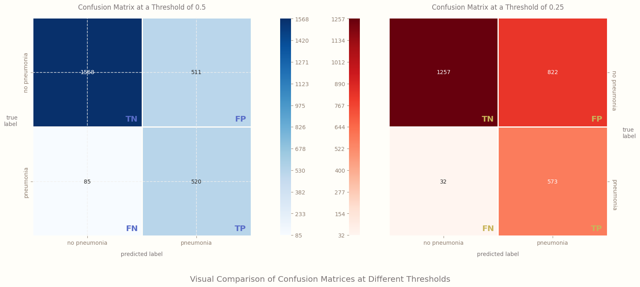

In [28]:
def is_pneumonia(labels):
    return ["pneumonia" if label == 1 else "no pneumonia" for label in labels]


def confusion_matrix_decorator(func):
    @wraps(func)
    def wrapper(
        ax,
        labels,
        *agrs,
        color,
        rotation_1=0,
        fontsize="x-large",
        fontweight="extra bold",
        rotation_2=90,
        **kwargs
    ):
        func(ax, labels, *agrs, **kwargs)
        labels = labels.unique().tolist()
        labels = is_pneumonia(labels)
        ax.set_xticklabels(labels, rotation=rotation_1)
        ax.set_yticklabels(labels, rotation=rotation_2)

        x_positions = [0.85, 1.85]
        y_positions = [0.95, 1.95]
        texts = ["TN", "FN", "FP", "TP"]
        for (x, y), text in zip(
            list(itertools.product(x_positions, y_positions)), texts
        ):
            ax.text(
                x, y, text, fontsize=fontsize, fontweight=fontweight, c=color, zorder=1
            )

    return wrapper


@confusion_matrix_decorator
def confusion_matrix_plotter(
    ax,
    labels,
    preds,
    title,
    task="binary",
    cbar_kws=None,
    cbar_location="right",
    cmap="binary",
    shrink=0.8,
    *agrs,
    **kagrs
):
    cm = torchmetrics.ConfusionMatrix(task=task, *agrs, **kagrs)(preds, labels).numpy()
    y_position = "left" if cbar_location == "right" else "right"
    cbar_kws_0 = {
        "ticks": np.linspace(cm.min(), cm.max(), 11, endpoint=True),
        "shrink": shrink,
        "location": cbar_location,
        "spacing": "uniform",
        "pad": 0.1,
    }
    cbar_kws_0 if not cbar_kws else cbar_kws_0.update(cbar_kws)
    ax = sns.heatmap(
        data=pd.DataFrame(cm),
        cmap=cmap,
        annot=True,
        fmt="d",
        annot_kws={"size": 10},
        linewidths=2,
        linecolor=custom_params["axes.facecolor"],
        cbar_kws=cbar_kws_0,
        square=True,
        ax=ax,
        zorder=0,
    )

    ax.set_title(title, loc="center", pad=15)
    ax.set_xlabel("predicted label", labelpad=10)
    ax.set_ylabel("true\nlabel", labelpad=10, rotation="horizontal", ha=cbar_location)
    ax.yaxis.set_label_position(y_position)
    ax.yaxis.set_ticks_position(y_position)

    plt.box(False)
    plt.grid(False)


colors = iter(calm_color_generator(2))

plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 7 * 6)

fig, axs = plt.subplots(nrows=1, ncols=2)

confusion_matrix_plotter(
    axs[0],
    labels,
    preds,
    "Confusion Matrix at a Threshold of 0.5",
    task="binary",
    num_classes=2,
    cmap="Blues",
    shrink=0.76,
    color=next(colors),
)
confusion_matrix_plotter(
    axs[1],
    labels,
    preds,
    "Confusion Matrix at a Threshold of 0.25",
    task="binary",
    num_classes=2,
    threshold=0.25,
    cmap="Reds",
    cbar_location="left",
    shrink=0.76,
    color=next(colors),
    rotation_2=-90,
)


fig.suptitle(
    "Visual Comparison of Confusion Matrices at Different Thresholds",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

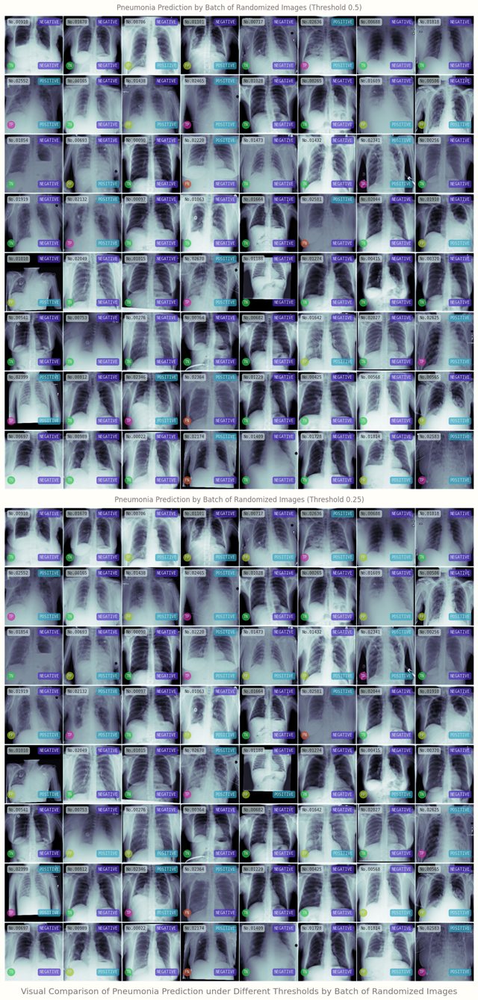

In [29]:
random_sampler = RandomSampler(indexed_val_dataset, num_samples=64)
random_dataloader = DataLoader(
    indexed_val_dataset, batch_size=len(indexed_val_dataset), sampler=random_sampler
)
with torch.no_grad():
    random_data, random_labels, random_index = next(iter(random_dataloader))
    random_data = random_data.to(device).float()
    random_preds = torch.sigmoid(model(random_data).cpu())

random_val_list = list(
    itertools.zip_longest(random_data.cpu(), random_labels, random_index)
)

threshold_1 = 0.5
random_preds_1 = [1 if x >= threshold_1 else 0 for x in random_preds[:, 0]]
threshold_2 = 0.25
random_preds_2 = [1 if x >= threshold_2 else 0 for x in random_preds[:, 0]]

colors = calm_color_generator(6)

fig, axs = plt.subplots(2, 1, figsize=(figure_size[0], figure_size[1] / 3 * 8))
grid_DICOM_2D_image(
    random_val_list,
    axs[0],
    slice_interval=1,
    title="Pneumonia Prediction by Batch of Randomized Images (Threshold 0.5)",
    preds=random_preds_1,
)
grid_DICOM_2D_image(
    random_val_list,
    axs[1],
    slice_interval=1,
    title="Pneumonia Prediction by Batch of Randomized Images (Threshold 0.25)",
    preds=random_preds_2,
)

fig.suptitle(
    "Visual Comparison of Pneumonia Prediction under Different Thresholds by Batch of "
    "Randomized Images",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc5_6_'></a>[Interpretability](#toc0_)

### <a id='toc5_6_1_'></a>[Class Activation Mapping (CAM)](#toc0_)


In [30]:
# `torch.nn.Module` provides the `children` method, which returns an iterator over the direct
# children of the module, through which it is possible to fetch all layers in the `resnet18`
# model, as well as select specific layers, for instance, selecting all layers before `avgpool`
# (average pooling)
all_layers = list(models.resnet18().children())

# The class `torch.nn.Sequential` is a sequential container to which the layers in the module
# will be added in the order passed in the constructor, or, alternatively, the module layers
# can be passed in as a dictionary with the parameter `OrderedDict`

# Remarkably, the layers of modules in the `torch.nn.Sequential` class are connected in a
# cascading way, but since they are initially stored in a list, the list of layers here needs
# to be unpacked by using the `*` method
container = nn.Sequential(*all_layers[:-2])

tabulation.heading_printer("Initial Understanding on Creating a PyTorch Sequence Model")

statements = [
    """
all_layers = list(models.resnet18().children())

container = nn.Sequential(*all_layers[:-2])
"""
]
tabulation.statement_generator(statements)

variables = [
    "all_layers",
    "container",
]
values = [
    str(reprlib_rules.repr(all_layers)),
    str(reprlib_rules.repr(container)),
]
tabulation.variable_generator(variables, values)

expressions = [
    "len(all_layers)",
    "all_layers[-1]",
    "all_layers[-2]",
    "all_layers[-3]",
    "all_layers[-3][-1]",
    "len(container)",
    "container.type",
    "container[-1][-1]",
]
results = [
    str(len(all_layers)),
    str(all_layers[-1]),
    str(all_layers[-2]),
    str(all_layers[-3]),
    str(all_layers[-3][-1]),
    str(len(container)),
    str(reprlib_rules.repr(container.type)),
    str(container[-1][-1]),
]
tabulation.expression_generator(expressions, results)

Initial Understanding on Creating a PyTorch Sequence Model

    +-------------------------------------------------+
    | Statement                                       |
    +-------------------------------------------------+
    | all_layers = list(models.resnet18().children()) |
    |                                                 |
    | container = nn.Sequential(*all_layers[:-2])     |
    +-------------------------------------------------+
    +------------+-----------------------------------------------+
    | Variable   | Value                                         |
    +------------+-----------------------------------------------+
    | all_layers | [Conv2d(3, 64, kernel_size=(7, 7), stride=(2, |
    |            |         2), padding=(3, 3), bias=False),      |
    |            |         BatchNorm2d(64, eps=1e-05,            |
    |            |         momentum=0.1, affine=True,            |
    |            |         track_running_stats=True),            |
    |       

- The interpretability discussed here is the localization of the predicted focal areas of pneumonia, inspired by the paper "Learning Deep Features for Discriminative Localization."

- This research paper introduces class activation mapping (CAM), a convolutional neural network (CNN) technique using global average pooling (GAP), which enables classification-trained CNNs to learn object localization without bounding-box annotations and to produce class activation maps that visualize the predicted class scores on images, highlighting discriminative object parts detected by the CNN, and whose accurate generation is essential for Weakly Supervised Semantic Segmentation (WSSS).

- The main idea of CAM is to compute the softmax output $S^c_k$ of the class $c$ from the last convolutional layer (consisting of $k$ feature maps) before the fully connected (FC) layer by multiplying each corresponding feature map $F_k$ with the class weight $w^c_k$ of the subsequent FC layers.


$S^c = \sum_k w^c_k \cdot F_k$


- References:
  > [3] B. Zhou, A. Khosla, A. Lapedriza, A. Oliva and A. Torralba, "Learning Deep Features for Discriminative Localization," 2016 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Las Vegas, NV, USA, 2016, pp. 2921-2929, doi: 10.1109/CVPR.2016.319.

---

This paper is publicly available at the following link: https://arxiv.org/pdf/1512.04150.pdf.


In [31]:
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = models.resnet18()
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        # As stated in the inspired paper, despite the excellent ability of convolutional
        # layers to localize objects, this ability is lost when classification is performed
        # with FC layers, making it necessary to avoid FC layers and minimize the number of
        # parameters while maintaining high performance

        # In addition to not extracting the original FC layer (i.e., the last layer) when
        # extracting the feature map from the `resnet18` model, the original average pooling
        # layer (i.e., the penultimate layer) is also not extracted
        self.feature_map = nn.Sequential(*list(self.model.children())[:-2])

    def forward(self, data):
        feature_map = self.feature_map(data)
        # The `torch.nn.AdaptiveAvgPool2d` class applies 2D adaptive average pooling to an
        # input signal consisting of multiple input planes

        # Note that for any input size, the output size of the `torch.nn.AdaptiveAvgPool2d`
        # class is H x W, and the number of output features is equal to the number of input
        # planes

        # The parameter `output_size` indicates the target output size of an image of the form
        # H x W, which can be either a tuple (H, W) or a single H of a square image H x H
        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(feature_map)
        # `torch.flatten` flattens the input by reshaping it into a 1D tensor
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        # At this point, the average pooling layer and FC layer that were not extracted when
        # the feature map was extracted have been filled in, and the FC layer can be used to
        # compute the prediction
        pred = self.model.fc(avg_pool_output_flattened)
        return pred, feature_map


# The main idea of CAM is to compute the class activation map M_k of the last convolutional
# layer (consisting of k feature maps) before the FC layer by multiplying each corresponding
# feature map A_k with the weight w_k of the subsequent FC layer, and to calculate the
# integrated class activation map M by summation, i.e., M = ∑_k w_k * A_k


# Consider all feature maps denoted by A_k as a whole feature map A, and all weights denoted by
# w_k as a whole weight w, so the computation of the class activation map M can be simplified
# to computing the dot product of the weight w and feature map A, i.e., M = w • A
def cam(model, img):
    with torch.no_grad():
        pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    # In this example, the shape of the returned feature tensor is 512x7x7, which needs to be
    # reshaped to a tensor of shape 512x49 in order to simplify the multiplication operation
    features = features.reshape((c, h * w))
    # Only weights are needed to compute the CAM, not bias
    weight_params = list(model.model.fc.parameters())[0]
    # The `detach` function returns a new tensor separated from the current graph, which is
    # used to remove the gradient information from the weight parameters for numpy conversion
    # and never needs the gradient
    weights = weight_params[0].detach()

    # Use `torch.matmul` to compute the dot product between weight w and the earlier mentioned
    # feature map A, as it will directly multiply each feature map A_k with the weight w_k of
    # the subsequent FC layer and compute the sum of the products of all feature maps

    # In this example, a 49-element vector (7x7 elements) will be yielded here
    cam_img = torch.matmul(weights, features)
    # Normalize the dot product generated class activation map (min-max feature scaling is used
    # here), but this is not always necessary
    cam_img = cam_img - torch.min(cam_img)
    cam_img = cam_img / (torch.max(cam_img) - torch.min(cam_img))
    # Reshape the normalized class activation map to the original shape of the feature tensor
    # (512x7x7 here) and move the tensor back to the CPU
    cam_img = cam_img.reshape(h, w).cpu()
    return cam_img, torch.sigmoid(pred)


# Although the construction of the new model has changed, the structure of all neural layers
# (including the final global average pooling layer as well as the fully connected layers) and
# the forward/backward propagation passes remain unchanged, so that weights previously trained
# and stored in the former model can be used directly

# The reason why the parameter `strict` needs to be set to False is that the structure of the
# new model has changed with the addition of the CAM-related feature maps, but since there were
# no CAM-related feature maps at all when the previous model was trained, the previous model
# would not have stored explicit weights for these variables, as well as the new model would
# not have used the loss function of the previous model
new_model = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt",
    strict=False,
)
# Here, the `eval` function of this model must also be called to set the dropout and batch
# normalization layers to evaluation mode so as to avoid inconsistent results in inference
new_model.eval()

TP_list = []
while len(TP_list) < 10:
    TP_list = [
        k
        for i, j, k in zip(
            random_labels.tolist(), random_preds_1, random_index.tolist()
        )
        if i == 1 and j == 1
    ]
TP_list = TP_list[:10]

random_TP = np.random.choice(TP_list, 1)[0]
img = val_dataset[random_TP][0]
activation_map, pred = cam(new_model, img)

tabulation = Form_Generator()
tabulation.heading_printer(
    "Creating a New Model for Implementing Class Activation Mapping (CAM)"
)

definitions = [
    """
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = models.resnet18()
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        self.feature_map = nn.Sequential(*list(self.model.children())[:-2])

    def forward(self, data):
        feature_map = self.feature_map(data)
        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(feature_map)
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_pool_output_flattened)
        return pred, feature_map


def cam(model, img):
    with torch.no_grad():
        pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    features = features.reshape((c, h * w))
    weight_params = list(model.model.fc.parameters())[0]
    weights = weight_params[0].detach()

    cam_img = torch.matmul(weights, features)
    cam_img = cam_img - torch.min(cam_img)
    cam_img = cam_img / (torch.max(cam_img) - torch.min(cam_img))
    cam_img = cam_img.reshape(h, w).cpu()
    return cam_img, torch.sigmoid(pred)
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
new_model = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt",
    strict=False,
)
new_model.eval()

TP_list = []
while len(TP_list) < 10:
    TP_list = [
        k
        for i, j, k in zip(
            random_labels.tolist(), random_preds_1, random_index.tolist()
        )
        if i == 1 and j == 1
    ]
TP_list = TP_list[:10]

random_TP = np.random.choice(TP_list, 1)[0]
img = val_dataset[random_TP][0]
activation_map, pred = cam(new_model, img)
"""
]
tabulation.statement_generator(statements)

variables = [
    "new_model",
    "TP_list",
    "random_TP",
    "img",
    "activation_map",
    "pred",
]
values = [
    str(reprlib_rules.repr(new_model)),
    str(TP_list),
    str(random_TP),
    str(reprlib_rules.repr(img)),
    str(reprlib_rules.repr(activation_map)),
    str(pred),
]
tabulation.variable_generator(variables, values)

expressions = [
    "new_model.model.conv1",
    "new_model.model.avgpool",
    "new_model.model.fc",
    "new_model.feature_map",
    "len(TP_list)",
    "img.shape",
    "activation_map.shape",
]
results = [
    str(new_model.model.conv1),
    str(new_model.model.avgpool),
    str(new_model.model.fc),
    str(reprlib_rules.repr(new_model.feature_map)),
    str(len(TP_list)),
    str(img.shape),
    str(activation_map.shape),
]
tabulation.expression_generator(expressions, results)

Creating a New Model for Implementing Class Activation Mapping (CAM)

    +-----------------------------------------------------------+
    | Definition                                                |
    +-----------------------------------------------------------+
    | class NewPneumoniaModel(pl.LightningModule):              |
    |     def __init__(self):                                   |
    |         super().__init__()                                |
    |                                                           |
    |         self.model = models.resnet18()                    |
    |         self.model.conv1 = nn.Conv2d(                     |
    |             1, 64, kernel_size=(7, 7), stride=(2, 2),     |
    |     padding=(3, 3), bias=False                            |
    |         )                                                 |
    |         self.model.fc = nn.Linear(in_features=512,        |
    |     out_features=1, bias=True)                            |
    | 

### <a id='toc5_6_2_'></a>[Visualization of CAM](#toc0_)


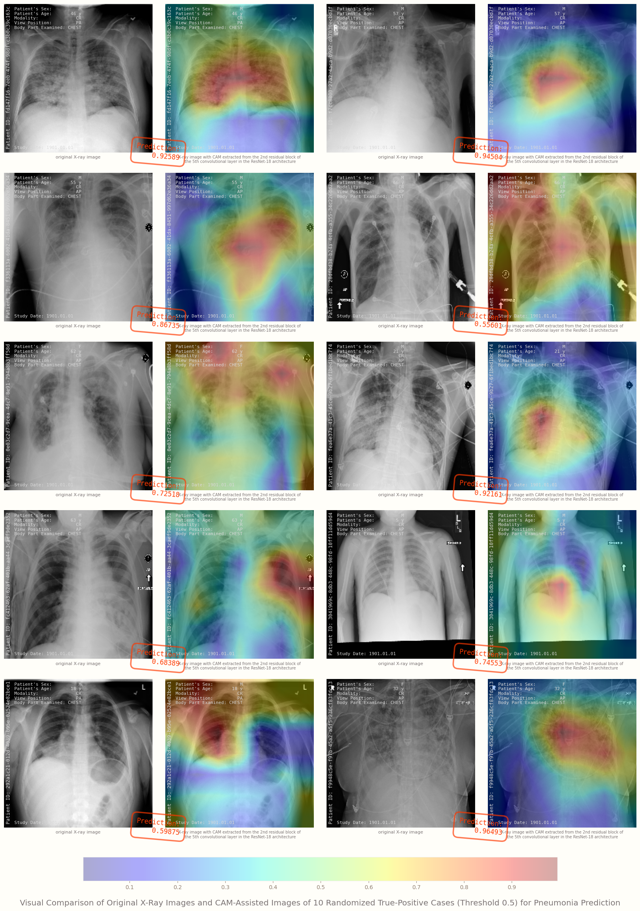

In [32]:
def layer_interpreter(conv_module):
    return int(re.findall(r"\d+", conv_module)[0])


def DICOM_file_finder(idx):
    global val_dataset
    # The attribute `samples` of the class `DatasetFolder` is a list of tuples, with each tuple
    # containing the file path of each sample and the index of the class it belongs to
    file_path, class_index = val_dataset.samples[idx]
    root_path = val_dataset.root
    # The attribute `classes` of the class `DatasetFolder` is a list of the class names
    file_name = file_path.replace(
        root_path + val_dataset.classes[class_index] + "/", ""
    ).replace(".npy", "")
    return pydicom.read_file(f"{ROOT_PATH}/{file_name}.dcm")


def annotation_color(cmap):
    cmap_color = mpl.colormaps[cmap]
    return cmap_color(0.85)


def first_max(list):
    max_element = list[0]
    for element in list[1:]:
        if len(element) > len(max_element):
            max_element = element
    return max_element


def text_aligner(text):
    line_list = text.split("\n")
    max_length = len(first_max(line_list))
    line_list = [
        (
            (":" + " " * (max_length - len(line))).join(line.split(":"))
            if len(line) < max_length
            else line
        )
        for line in line_list
    ]
    text = "\n".join(line_list)
    return text


def get_patient_ID(func):
    @wraps(func)
    def wrapper(*args, **kwargs):
        dicom_file, ax, cmap, fontsize_adjustment = func(*args, **kwargs)
        text = f"Patient ID: {dicom_file.PatientID}"
        ax.text(
            0.0125,
            0.0325,
            text_aligner(text),
            rotation=90,
            transform=ax.transAxes,
            fontsize=9 + fontsize_adjustment,
            fontfamily="monospace",
            c=annotation_color(cmap),
            zorder=2,
        )
        return dicom_file, ax, cmap, fontsize_adjustment

    return wrapper


def get_other_information(func):
    @wraps(func)
    def wrapper(*args, **kwargs):
        dicom_file, ax, cmap, fontsize_adjustment = func(*args, **kwargs)
        text = f"Patient's Sex: {dicom_file.PatientSex}"
        pattern = "[^0-9]*"
        patient_age = dicom_file.PatientAge.strip(str(0))
        patient_age = re.sub(pattern, "", patient_age)
        text += f"\nPatient's Age: {patient_age} y"
        text += f"\nModality: {dicom_file.Modality}"
        text += f"\nView Position: {dicom_file.ViewPosition}"
        text += f"\nBody Part Examined: {dicom_file.BodyPartExamined}"
        ax.text(
            0.07,
            0.8325,
            text_aligner(text),
            transform=ax.transAxes,
            fontsize=8 + fontsize_adjustment,
            fontfamily="monospace",
            c=annotation_color(cmap),
            zorder=2,
        )
        return dicom_file, ax, cmap, fontsize_adjustment

    return wrapper


def get_date_information(func):
    @wraps(func)
    def wrapper(*args, **kwargs):
        dicom_file, ax, cmap, fontsize_adjustment = func(*args, **kwargs)
        date = datetime.strptime(dicom_file.StudyDate, "%Y%m%d").strftime("%Y.%m.%d")
        text = f"Study Date: {date}"
        ax.text(
            0.07,
            0.025,
            text,
            transform=ax.transAxes,
            fontsize=8 + fontsize_adjustment,
            fontfamily="monospace",
            c=annotation_color(cmap),
            zorder=2,
        )

    return wrapper


@get_date_information
@get_other_information
@get_patient_ID
def DICOM_2D_image(
    ax,
    idx,
    keywords,
    fontsize_adjustment,
    title="",
    cmap="gray",
):
    global val_dataset
    img = val_dataset[idx][0]
    dicom_file = DICOM_file_finder(idx)
    ax.imshow(img.squeeze(0), cmap, zorder=0)
    ax.grid(False)
    ax.set_title(title, loc="center", pad=10, fontsize=12 + fontsize_adjustment)
    ax.set(xticks=[], yticks=[], frame_on=False)
    text = f"original {keywords[0]} image"
    ax.set_xlabel(
        xlabel=text,
        labelpad=5,
        rotation=0,
        loc="center",
        fontsize=8 + fontsize_adjustment,
    )

    return dicom_file, ax, cmap, fontsize_adjustment


def visual_cam(
    ax,
    idx,
    cam_type,
    model,
    keywords,
    fontsize_adjustment,
    cmap="jet",
    conv_module="layer4",
    residual_block=1,
):
    global val_dataset, cam_dict, ordinal_string
    img = val_dataset[idx][0]
    activation_map, pred = cam_type(model, img)
    # The `torchvision.transforms.functional.resize` resizes the input image to the given size,
    # and if the image is a torch tensor, it is expected to have the shape [... , H, W], where
    # ... denotes an arbitrary number of leading dimensions

    # The parameter `img` indicates the image to be resized, the type can be a PIL image or a
    # tensor

    # The parameter `size` indicates the desired output size, if it is a sequence such as
    # (h, w), the output size will be matched; if it is an int, the smaller edges of the image
    # will be matched to maintain the aspect ratio

    # The parameter `antialias` is set to True by default, which means that antialiasing will
    # be applied to bilinear or bicubic modes, but other modes are not affected
    activation_map = transforms.functional.resize(
        img=activation_map.unsqueeze(0), size=img.squeeze(0).shape, antialias=True
    )[0]
    cam_img = ax.imshow(activation_map, alpha=0.33, cmap=cmap, zorder=1)
    cam_dict["cam_img"].append(cam_img)
    cam_dict["pred"].append(pred)

    if residual_block is None:
        text_1 = f"{keywords[0]} image with {keywords[1]} extracted from"
        text_2 = (
            f"\n the {ordinal_string[layer_interpreter(conv_module)]} convolutional layer "
            f"in the {keywords[-1]} architecture"
        )
    else:
        text_1 = (
            f"{keywords[0]} image with {keywords[1]} extracted from "
            f"the {ordinal_string[residual_block+1]} residual block of"
        )
        text_2 = (
            f"\n the {ordinal_string[layer_interpreter(conv_module)+1]} convolutional layer "
            f"in the {keywords[-1]} architecture"
        )
    text = text_1 + text_2
    ax.set_xlabel(
        xlabel=text,
        labelpad=5,
        rotation=0,
        loc="center",
        fontsize=7 + fontsize_adjustment,
    )
    return pred, cmap


def cam_paired_images(
    paired_axs,
    idx,
    cam_type,
    model,
    keywords,
    fontsize_adjustment=0,
    x_adjustment=1,
    y_adjustment=1,
):
    for ax in paired_axs:
        DICOM_2D_image(ax, idx, keywords, fontsize_adjustment)
    pred, cmap = visual_cam(
        paired_axs[1], idx, cam_type, model, keywords, fontsize_adjustment
    )
    text_1 = "Prediction:".ljust(11)
    text_2 = f"{pred[0]:>11.5f}"
    bbox_props = dict(
        boxstyle="round",
        pad=0.75,
        lw=2.5,
        ec=annotation_color(cmap),
        fc="none",
        alpha=0.67,
    )
    fig.text(
        # `axes.get_position` returns the position of the Axes in the figure as a bbox, where
        # the parameter `original` is set to False by default, which means the active position
        # is returned; otherwise the original position is returned
        paired_axs[1].get_position(original=False).bounds[0] - 0.005 * x_adjustment,
        paired_axs[1].get_position().bounds[1] - 0.005 * y_adjustment,
        text_1 + "\n" + text_2,
        rotation=-5,
        bbox=bbox_props,
        fontsize=12 + fontsize_adjustment,
        fontfamily="monospace",
        c=annotation_color(cmap),
        zorder=3,
    )


fig, axs = plt.subplots(
    5,
    4,
    figsize=(figure_size[0], figure_size[1] / 2 * 5),
    constrained_layout=True,
    gridspec_kw={"wspace": 0.08, "hspace": -0.15},
)

cam_dict = {"cam_img": [], "pred": []}
ordinal_string = {1: "1st", 2: "2nd", 3: "3rd", 4: "4th", 5: "5th"}

x_adjustments = [22.5, 0]
y_adjustments = [-18, -10, -2, 6, 14]
x_label_keywords = ["X-ray", "CAM", "ResNet-18"]

iterable = iter(axs.flatten())

for idx, (y_adjustment, x_adjustment) in zip(
    TP_list, list(itertools.product(y_adjustments, x_adjustments))
):
    paired_axs = [next(iterable)]
    paired_axs.append(next(iterable))
    cam_paired_images(
        paired_axs,
        idx,
        cam_type=cam,
        model=new_model,
        keywords=x_label_keywords,
        x_adjustment=x_adjustment,
        y_adjustment=y_adjustment,
    )


# `matplotlib.figure` implements the following classes: the class `matplotlib.figure.Figure`,
# the top-level artist and contains all the plotting elements, many methods are implemented in
# the class `matplotlib.figure.FigureBase`; the class `matplotlib.figure.SubFigure`, the
# logical figure in the figure, and the class `matplotlib.figure.SubplotParams`, is used to
# control the default spacing between subfigures

# The class `matplotlib.figure.Figure` provides the `Figure.colorbar` method for adding a color
# bar to a plot

# The parameter `mappable` represents the `matplotlib.cm.ScalarMappable` object (usually an
# image) that indicates the colormap and the norm to be used, which is required for the
# `Figure.colorbar` method, but optional for the `pyplot.colorbar` function, which will be set
# by default to the current image

# The parameter `cax` is an optional parameter that indicates the Axes on which the color bar is to be drawn,
# or, if None (the default), creates a new Axes whose space will be stolen from the Axes(s) specified in the
# parameter `ax`

# The parameter `ax` is an optional parameter that specifies one or more parent Axes from which
# the new colorbar Axes will take its space, which is only used if the parameter `cax` is not
# set, and whose default value is None
fig.colorbar(
    mappable=cam_dict["cam_img"][cam_dict["pred"].index(max(cam_dict["pred"]))],
    cax=None,
    ax=axs,
    orientation="horizontal",
    shrink=0.75,
    pad=0.02,
    ticks=np.linspace(0, 1, 11, endpoint=True),
    ticklocation="top",
)

fig.suptitle(
    "Visual Comparison of Original X-Ray Images and CAM-Assisted Images of 10 Randomized "
    "True-Positive Cases (Threshold 0.5) for Pneumonia Prediction",
    fontsize="x-large",
    x=0.5,
    y=-0.01,
)

plt.show()

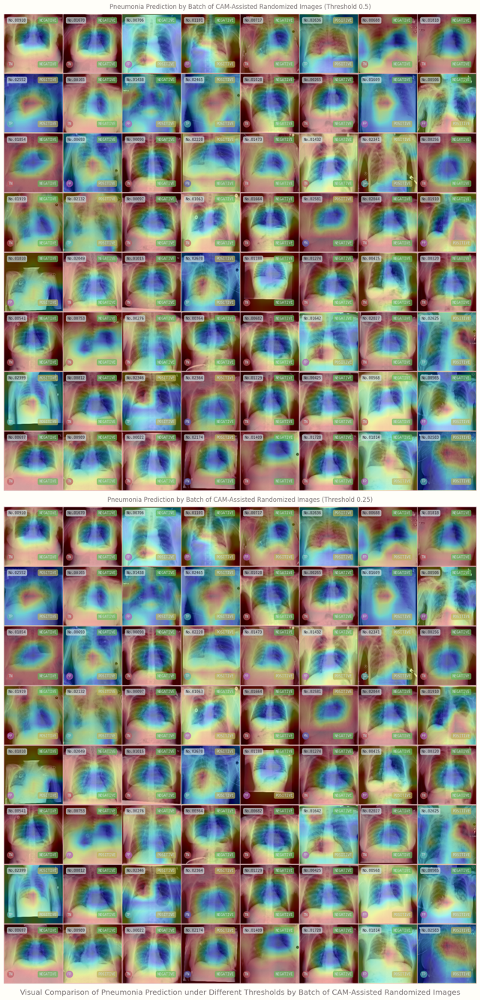

In [33]:
def cam_batch(model, img_batch):
    pred_list = []
    cam_img_list = []
    for i in range(img_batch.shape[0]):
        with torch.no_grad():
            pred, features = model(img_batch[i, :, :, :].unsqueeze(0).cpu())
            pred_list.append(torch.sigmoid(pred))
        _, c, h, w = features.shape
        features = features.reshape((c, h * w))
        weight_params = list(model.model.fc.parameters())[0]
        weights = weight_params[0].detach()
        cam_img = torch.matmul(weights, features)
        cam_img = cam_img - torch.min(cam_img)
        cam_img = cam_img / (torch.max(cam_img) - torch.min(cam_img))
        cam_img_list.append(cam_img.reshape(h, w))
    return pred_list, cam_img_list


def grid_cam_image(
    input_1,
    input_2,
    ax,
    model,
    n=None,
    slice_interval=500,
    threshold=0.5,
    row_size=8,
    pad_value=1,
):
    if n is None:
        n = len(input_1)
    n = math.ceil(n / slice_interval)
    nrows = math.ceil(n / row_size)
    cmap = "jet"

    pred_list, cam_img_list = cam_batch(model, input_1)
    cam_img_list = [
        transforms.functional.resize(
            img=cam_img.unsqueeze(0), size=input_1[0].squeeze(0).shape, antialias=True
        )
        for cam_img in cam_img_list
    ]
    cam_images = torch.cat(cam_img_list, dim=0).unsqueeze(1)
    cam_images = cam_images[::slice_interval, :, :, :]

    for i in range(nrows):
        if len(cam_images) > row_size:
            row_cam_images = cam_images[:row_size]
            cam_images = cam_images[row_size:]
        else:
            row_cam_images = cam_images[:]
        grid_row = make_grid(
            row_cam_images,
            nrow=row_size,
            normalize=True,
            pad_value=pad_value,
        )
        scalar_row = grid_row.numpy().transpose(1, 2, 0)[:, :, 0]
        if i == 0:
            if nrows != 1:
                scalar_image = scalar_row
            else:
                scalar_image = np.full(
                    (
                        scalar_row.shape[0],
                        math.ceil(scalar_row.shape[1] / images.shape[0] * row_size),
                    ),
                    np.nan,
                )
                scalar_image[:, : scalar_row.shape[1]] = scalar_row
        elif scalar_image.shape[1] == scalar_row.shape[1]:
            scalar_image = np.concatenate((scalar_image, scalar_row), axis=0)
        else:
            image_to_concat = np.full(
                (scalar_image.shape[0] + scalar_row.shape[0], scalar_image.shape[1]),
                np.nan,
            )
            image_to_concat[: scalar_image.shape[0], :] = scalar_image
            image_to_concat[scalar_image.shape[0] :, : scalar_row.shape[1]] = scalar_row
            scalar_image = image_to_concat
    grid_DICOM_2D_image(
        input_2,
        ax,
        slice_interval=1,
        title="Pneumonia Prediction by Batch of CAM-Assisted Randomized Images (Threshold "
        f"{threshold})",
        preds=[1 if x >= threshold else 0 for x in pred_list],
    )
    ax.imshow(scalar_image, alpha=0.33, cmap=cmap, zorder=1)
    ax.set(xticks=[], yticks=[], frame_on=False)
    ax.grid(False)


colors = calm_color_generator(6)

fig, axs = plt.subplots(2, 1, figsize=(figure_size[0], figure_size[1] * 3))
grid_cam_image(
    random_data,
    random_val_list,
    axs[0],
    new_model,
    slice_interval=1,
    row_size=8,
    pad_value=1,
)

grid_cam_image(
    random_data,
    random_val_list,
    axs[1],
    new_model,
    slice_interval=1,
    threshold=0.25,
    row_size=8,
    pad_value=1,
)

fig.suptitle(
    "Visual Comparison of Pneumonia Prediction under Different Thresholds by Batch of "
    "CAM-Assisted Randomized Images",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

# <a id='toc6_'></a>[Beyond the Lecture](#toc0_)

This part has been added to self-implement other more advanced CAM methods using techniques outside of the lecture, including Grad-CAM, Grad-CAM++, and Score-CAM.

## <a id='toc6_1_'></a>[Understanding the PyTorch Hooks](#toc0_)

This section was inspired by the tutorial "PyTorch Hooks Explained - In-depth Tutorial" posted on [Elliot Waite's YouTube channel](https://www.youtube.com/@elliotwaite).

### <a id='toc6_1_1_'></a>[Recap of the Computational Graph](#toc0_)


In [34]:
# In the automatic differentiation engine `torch.autograd` of PyTorch, if the parameter
# `requires_grad` is set to True, the input tensor for the operation will be tracked for
# computation, meaning that the gradient associated with that tensor will be accumulated
# in the `.grad` attribute after the computation is passed backward
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

# The `backward` function provided by the PyTorch tensor computes the gradient of the current
# tensor with respect to the graph leaves, where the parameter `gradient` denotes the gradient
# with respect to the tensor, which is passed to start the backward pass, with a default value
# of None, meaning that it starts with the default gradient value (a tensor value of 1)
c.backward(gradient=None)

tabulation = Form_Generator()
tabulation.heading_printer(
    "Understanding How Computational Graphs Work through a Simple Example"
)

statements = [
    """
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

c.backward(gradient=None)
"""
]
tabulation.statement_generator(statements)

variables = [
    "a",
    "b",
    "c",
]
values = [
    str(a),
    str(b),
    str(c),
]
tabulation.variable_generator(variables, values)

expressions = [
    "a.data",
    "a.grad",
    "a.grad_fn",
    "a.is_leaf",
    "b.data",
    "b.grad",
    "b.grad_fn",
    "b.is_leaf",
    "c.data",
    "c.grad",
    "c.grad_fn",
    "c.is_leaf",
]
results = [
    str(a.data),
    str(a.grad),
    str(a.grad_fn),
    str(a.is_leaf),
    str(b.data),
    str(b.grad),
    str(b.grad_fn),
    str(b.is_leaf),
    str(c.data),
    str(c.grad),
    str(c.grad_fn),
    str(c.is_leaf),
]
tabulation.expression_generator(expressions, results)

Understanding How Computational Graphs Work through a Simple Example

    +-------------------------------------------+
    | Statement                                 |
    +-------------------------------------------+
    | a = torch.tensor(2.0, requires_grad=True) |
    | b = torch.tensor(3.0, requires_grad=True) |
    |                                           |
    | c = a * b                                 |
    |                                           |
    | c.backward(gradient=None)                 |
    +-------------------------------------------+
    +----------+------------------------------------+
    | Variable | Value                              |
    +----------+------------------------------------+
    | a        | tensor(2., requires_grad=True)     |
    | b        | tensor(3., requires_grad=True)     |
    | c        | tensor(6., grad_fn=⟨MulBackward0⟩) |
    +----------+------------------------------------+
    +------------+----------------------------------

In [35]:
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

d = torch.tensor(4.0, requires_grad=True)

e = c * d

# The `backward` function of the PyTorch tensor is called only once during the backward pass
# of the computational graph, which results in a call to the `torch.autograd.backward` function
# for that tensor and differentiates the graph according to the chain rule
e.backward()

tabulation = Form_Generator()
tabulation.heading_printer(
    "Understanding How Computational Graphs Work through a Slightly More Complex Example"
)

statements = [
    """
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

d = torch.tensor(4.0, requires_grad=True)

e = c * d

e.backward()
"""
]
tabulation.statement_generator(statements)

variables = [
    "a",
    "b",
    "c",
    "d",
    "e",
]
values = [str(a), str(b), str(c), str(d), str(e)]
tabulation.variable_generator(variables, values)

expressions = [
    "a.data",
    "a.grad",
    "a.grad_fn",
    "a.is_leaf",
    "b.data",
    "b.grad",
    "b.grad_fn",
    "b.is_leaf",
    "c.data",
    "c.grad",
    "c.grad_fn",
    "c.is_leaf",
    "d.data",
    "d.grad",
    "d.grad_fn",
    "d.is_leaf",
    "e.data",
    "e.grad",
    "e.grad_fn",
    "e.is_leaf",
]
results = [
    str(a.data),
    str(a.grad),
    str(a.grad_fn),
    str(a.is_leaf),
    str(b.data),
    str(b.grad),
    str(b.grad_fn),
    str(b.is_leaf),
    str(c.data),
    str(c.grad),
    str(c.grad_fn),
    str(c.is_leaf),
    str(d.data),
    str(d.grad),
    str(d.grad_fn),
    str(d.is_leaf),
    str(e.data),
    str(e.grad),
    str(e.grad_fn),
    str(e.is_leaf),
]
tabulation.expression_generator(expressions, results)

Understanding How Computational Graphs Work through a Slightly More Complex Example

    +-------------------------------------------+
    | Statement                                 |
    +-------------------------------------------+
    | a = torch.tensor(2.0, requires_grad=True) |
    | b = torch.tensor(3.0, requires_grad=True) |
    |                                           |
    | c = a * b                                 |
    |                                           |
    | d = torch.tensor(4.0, requires_grad=True) |
    |                                           |
    | e = c * d                                 |
    |                                           |
    | e.backward()                              |
    +-------------------------------------------+
    +----------+-------------------------------------+
    | Variable | Value                               |
    +----------+-------------------------------------+
    | a        | tensor(2., requires_grad=True)   

### <a id='toc6_1_2_'></a>[Settings for Tensor Hooks](#toc0_)


In [36]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()


def log_printer(log_1, log_2, end="\n", length=63):
    length_log_1 = len(log_1)
    length_log_2 = length - len(log_1) - 4
    log_1 = log_1.ljust(length_log_1)
    log_2 = log_2.rjust(length_log_2, ".")
    cprint(f"  {log_1}{log_2}  ", font_color, end=end)
    return length


def grad_hook_logger(node, grad, modification, module=None):
    global count, dataframe
    count += 1
    if count == 1 and module != None:
        length = log_printer("module ", f" {str(module)}", end="\n")
        cprint(" " + "_" * (length - 2) + " ", font_color)
    dataframe.updater(
        count,
        f"{node}.grad",
        grad.detach(),
        modification.replace("grad", f"{node}.grad"),
        eval(modification).detach(),
        "",
        "",
    )
    log_1 = f"hook {count} - gradient of node {node} "
    log_2 = f" {grad.detach()} -> {eval(modification).detach()}"
    log_printer(log_1, log_2, end="\n")


def actual_value_checker(target_list, value_list, target_name="gradient of node"):
    global dataframe
    df = dataframe.converter()
    for row in range(df.shape[0]):
        for node, value in zip(target_list, value_list):
            if df.loc[row, target_name] == node:
                df.loc[row, "actual value"] = value.detach()
                if df.loc[row, "expected value"] != df.loc[row, "actual value"]:
                    df.loc[row, "value retained"] = (
                        "<" + "FALSE".center(len("value retained") - 2) + ">"
                    )
                else:
                    df.loc[row, "value retained"] = (
                        "<" + "TRUE".center(len("value retained") - 2) + ">"
                    )
    dataframe = DataFrame_Generator(*df.columns)
    for _, row in df.iterrows():
        dataframe.updater(*row)


# The gradient in the hook should avoid being modified by in-place operations, but there is
# an option to return a new gradient that can be used to replace the old one
def c_hook(grad):
    grad_hook_logger("c", grad, "grad + 2")
    return grad + 2


count = 0
dataframe = DataFrame_Generator(
    "hook n°",
    "gradient of node",
    "initial value",
    "modification",
    "expected value",
    "actual value",
    "value retained",
)

a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

# Once the `backward` function of the PyTorch tensor is called, the gradients through non-leaf
# nodes will be inaccessible throughout the computation, and the gradients cannot be inspected
# or modified as they flow through the nodes, but can only be checked by outputting them to the
# leaf nodes

# This is where the hooks on the tensor need to come into play, allowing the user to backward
# check the gradient as it flows through the graph, and change the gradient as needed

# The `register_hook` function provided by the PyTorch tensor registers a backward hook that
# is called each time the gradient with respect to the tensor is computed, and it should have
# the following signature: `hook(grad) -> Tensor or None`

# The parameter `hook` in the `register_hook` function of the PyTorch tensor can be passed by
# either a regular function or a lambda function, which returns either the new gradient or
# the same gradient (if the gradient hasn't changed)
c.register_hook(hook=c_hook)
# Note that registered hooks will be added to the ordered dictionary, and the order in which
# the hooks are added to the tensor is very important, determining the order that hooks will
# be called in the backward flow of the graph
c.register_hook(lambda grad: grad_hook_logger("c", grad, "grad"))
c.register_hook(lambda grad: grad)
# The `retain_grad` function provided by the PyTorch tensor enables the tensor to populate the
# gradient during backward flow, while the leaf tensor disables this option
c.retain_grad()

d = torch.tensor(4.0, requires_grad=True)
d.register_hook(lambda grad: grad_hook_logger("d", grad, "grad + 100"))
d.register_hook(lambda grad: grad + 100)

e = c * d

# Note that the hook that retains the gradient is also added to the ordered dictionary, but the
# order is no longer important; it can be added before or after the other hooks and only needs
# to be added once
e.retain_grad()
e.register_hook(lambda grad: grad_hook_logger("e", grad, "grad * 2"))
e.register_hook(lambda grad: grad * 2)

e.backward()
cprint("", font_color)
actual_value_checker(
    ["a.grad", "b.grad", "c.grad", "d.grad", "e.grad"],
    [a.grad, b.grad, c.grad, d.grad, e.grad],
)

tabulation.heading_printer(
    "Understanding How Hooks Work on Tensors through a Simple Example"
)

definitions = [
    """
def c_hook(grad):
    return grad + 2
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

c.register_hook(hook=c_hook)
c.register_hook(lambda grad: grad)
c.retain_grad()

d = torch.tensor(4.0, requires_grad=True)
d.register_hook(lambda grad: grad + 100)

e = c * d

e.retain_grad()
e.register_hook(lambda grad: grad * 2)

e.backward()
"""
]
tabulation.statement_generator(statements)

variables = [
    "a",
    "b",
    "c",
    "d",
    "e",
]
values = [str(a), str(b), str(c), str(d), str(e)]
tabulation.variable_generator(variables, values)

expressions = [
    "a.data",
    "a.grad",
    "a.grad_fn",
    "a.is_leaf",
    "b.data",
    "b.grad",
    "b.grad_fn",
    "b.is_leaf",
    "c.data",
    "c.grad",
    "c.grad_fn",
    "c.is_leaf",
    "d.data",
    "d.grad",
    "d.grad_fn",
    "d.is_leaf",
    "e.data",
    "e.grad",
    "e.grad_fn",
    "e.is_leaf",
]
results = [
    str(a.data),
    str(a.grad),
    str(a.grad_fn),
    str(a.is_leaf),
    str(b.data),
    str(b.grad),
    str(b.grad_fn),
    str(b.is_leaf),
    str(c.data),
    str(c.grad),
    str(c.grad_fn),
    str(c.is_leaf),
    str(d.data),
    str(d.grad),
    str(d.grad_fn),
    str(d.is_leaf),
    str(e.data),
    str(e.grad),
    str(e.grad_fn),
    str(e.is_leaf),
]
tabulation.expression_generator(expressions, results)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

  hook 1 - gradient of node e .................... 1.0 -> 2.0  
  hook 2 - gradient of node d ................. 12.0 -> 112.0  
  hook 3 - gradient of node c ................... 8.0 -> 10.0  
  hook 4 - gradient of node c .................. 10.0 -> 10.0  

Understanding How Hooks Work on Tensors through a Simple Example

    +---------------------+
    | Definition          |
    +---------------------+
    | def c_hook(grad):   |
    |     return grad + 2 |
    +---------------------+
    +-------------------------------------------+
    | Statement                                 |
    +-------------------------------------------+
    | a = torch.tensor(2.0, requires_grad=True) |
    | b = torch.tensor(3.0, requires_grad=True) |
    |                                           |
    | c = a * b                                 |
    |                                           |
    | c.register_hook(hook=c_hook)              |
    | c.register_hook(lambda grad: grad)        |
    | c.r

In [37]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()

count = 0
dataframe = DataFrame_Generator(
    "hook n°",
    "gradient of node",
    "initial value",
    "modification",
    "expected value",
    "actual value",
    "value retained",
)

a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

# The `register_hook` function of the PyTorch tensor can return a handle on which to provide
# the `handle.remove` method to remove the hook from the module
h = c.register_hook(hook=c_hook)
c.register_hook(lambda grad: grad_hook_logger("c", grad, "grad"))
c.register_hook(lambda grad: grad)
c.retain_grad()

d = torch.tensor(4.0, requires_grad=True)
d.register_hook(lambda grad: grad_hook_logger("d", grad, "grad + 100"))
d.register_hook(lambda grad: grad + 100)

e = c * d

e.retain_grad()
e.register_hook(lambda grad: grad_hook_logger("e", grad, "grad * 2"))
e.register_hook(lambda grad: grad * 2)

h.remove()

e.backward()
cprint("", font_color)
actual_value_checker(
    ["a.grad", "b.grad", "c.grad", "d.grad", "e.grad"],
    [a.grad, b.grad, c.grad, d.grad, e.grad],
)

tabulation.heading_printer(
    "Understanding How to Use Hook Handles on Tensors through a Simple Example"
)

statements = [
    """
a = torch.tensor(2.0, requires_grad=True)
b = torch.tensor(3.0, requires_grad=True)

c = a * b

h = c.register_hook(hook=c_hook)
c.register_hook(lambda grad: grad)
c.retain_grad()

d = torch.tensor(4.0, requires_grad=True)
d.register_hook(lambda grad: grad + 100)

e = c * d

e.retain_grad()
e.register_hook(lambda grad: grad * 2)

h.remove()

e.backward()
"""
]
tabulation.statement_generator(statements)

variables = [
    "a",
    "b",
    "c",
    "d",
    "e",
]
values = [str(a), str(b), str(c), str(d), str(e)]
tabulation.variable_generator(variables, values)

expressions = [
    "a.data",
    "a.grad",
    "a.grad_fn",
    "a.is_leaf",
    "b.data",
    "b.grad",
    "b.grad_fn",
    "b.is_leaf",
    "c.data",
    "c.grad",
    "c.grad_fn",
    "c.is_leaf",
    "d.data",
    "d.grad",
    "d.grad_fn",
    "d.is_leaf",
    "e.data",
    "e.grad",
    "e.grad_fn",
    "e.is_leaf",
]
results = [
    str(a.data),
    str(a.grad),
    str(a.grad_fn),
    str(a.is_leaf),
    str(b.data),
    str(b.grad),
    str(b.grad_fn),
    str(b.is_leaf),
    str(c.data),
    str(c.grad),
    str(c.grad_fn),
    str(c.is_leaf),
    str(d.data),
    str(d.grad),
    str(d.grad_fn),
    str(d.is_leaf),
    str(e.data),
    str(e.grad),
    str(e.grad_fn),
    str(e.is_leaf),
]
tabulation.expression_generator(expressions, results)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

  hook 1 - gradient of node e .................... 1.0 -> 2.0  
  hook 2 - gradient of node d ................. 12.0 -> 112.0  
  hook 3 - gradient of node c .................... 8.0 -> 8.0  

Understanding How to Use Hook Handles on Tensors through a Simple Example

    +-------------------------------------------+
    | Statement                                 |
    +-------------------------------------------+
    | a = torch.tensor(2.0, requires_grad=True) |
    | b = torch.tensor(3.0, requires_grad=True) |
    |                                           |
    | c = a * b                                 |
    |                                           |
    | h = c.register_hook(hook=c_hook)          |
    | c.register_hook(lambda grad: grad)        |
    | c.retain_grad()                           |
    |                                           |
    | d = torch.tensor(4.0, requires_grad=True) |
    | d.register_hook(lambda grad: grad + 100)  |
    |                           

### <a id='toc6_1_3_'></a>[Setting of Module Hooks](#toc0_)


In [38]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()


def text_converter(node, text, toward="backward"):
    return text if toward == "forward" else text.replace(node, f"{node}.grad")


def module_hook_logger(module, nodes, inputs, modifications, toward="backward"):
    global count, dataframe
    count += 1
    if count == 1:
        length = log_printer("module ", f" {str(module)}", end="\n")
        cprint(" " + "_" * (length - 2) + " ", font_color)
    log_key = "value" if toward == "forward" else "gradient"
    if type(inputs) in [tuple, list]:
        for node, input, modification in zip(nodes, inputs, modifications):
            text_node = text_converter(node, node, toward)
            text_modification = text_converter(node, modification, toward)
            locals()[node] = input
            if input == inputs[0]:
                dataframe.updater(
                    count,
                    text_node,
                    input.detach(),
                    text_modification,
                    eval(modification).detach(),
                    "",
                    "",
                )
                log_1 = f"hook {count} - {log_key} of node {node} "
            elif len(inputs) > 1:
                dataframe.updater(
                    "",
                    text_node,
                    input.detach(),
                    text_modification,
                    eval(modification).detach(),
                    "",
                    "",
                )
                log_1 = " " * 9 + f"{log_key} of node {node} "
            log_2 = f" {input.detach()} -> {eval(modification).detach()}"
            log_printer(log_1, log_2, end="\n")
    else:
        locals()[nodes] = inputs
        text_nodes = text_converter(nodes, nodes, toward)
        text_modifications = text_converter(nodes, modifications, toward)
        dataframe.updater(
            count,
            text_nodes,
            inputs.detach(),
            text_modifications,
            eval(modifications).detach(),
            "",
            "",
        )
        log_1 = f"hook {count} - {log_key} of node {nodes} "
        log_2 = f" {inputs.detach()} -> {eval(modifications).detach()}"
        log_printer(log_1, log_2, end="\n")


class SumNet(nn.Module):
    def _init__(self):
        super().__init__()

    def forward(self, a, b, c):
        return a + b + c


def forward_pre_hook(module, inputs):
    a, b, c = inputs
    module_hook_logger(
        module, ["a", "b", "c"], [a, b, c], ["a + 12", "b", "c + 24"], "forward"
    )
    return a + 12, b, c + 24


def forward_hook(module, inputs, output):
    d = output
    module_hook_logger(module, "d", d, "d + 100", "forward")
    return d + 100


def main():
    sum_net = SumNet()

    # The `register_module_forward_pre_hook` function of the PyTorch module registers a forward
    # pre-hook that is common to all modules, which will be called before each call to the
    # model's `forward` function, with the following signature:
    # `hook(module, input) -> None or modified input`
    sum_net.register_forward_pre_hook(forward_pre_hook)
    # The `register_module_forward_hook` function of the PyTorch module registers a generic
    # forward hook for all modules, which will be called after each call to the model's
    # `forward` function, with the following signature:
    # `hook(module, input, output) -> None or modified output`
    sum_net.register_forward_hook(forward_hook)

    a = torch.tensor(1.0, requires_grad=True)
    b = torch.tensor(2.0, requires_grad=True)
    c = torch.tensor(3.0, requires_grad=True)

    # As practice has shown, the two forward hook register functions of the PyTorch module do
    # not automatically retain the change of the non-endpoint nodes during the forward process;
    # these nodes will return to their original values after the computation
    d = sum_net(a, b, c)

    actual_value_checker(["a", "b", "c", "d"], [a, b, c, d], "value of node")


count = 0
dataframe = DataFrame_Generator(
    "hook n°",
    "value of node",
    "initial value",
    "modification",
    "expected value",
    "actual value",
    "value retained",
)
main()
cprint("", font_color)

tabulation.heading_printer(
    "Understanding How to Set up Different Forward Hooks on a Module through a Simple Example"
)

definitions = [
    """
class SumNet(nn.Module):
    def _init__(self):
        super().__init__()

    def forward(self, a, b, c):
        return a + b + c


def forward_pre_hook(module, inputs):
    a, b, c = inputs
    return a + 12, b, c + 24


def forward_hook(module, inputs, output):
    d = output
    return d + 100


def main():
    sum_net = SumNet()

    sum_net.register_forward_pre_hook(forward_pre_hook)
    sum_net.register_forward_hook(forward_hook)

    a = torch.tensor(1.0, requires_grad=True)
    b = torch.tensor(2.0, requires_grad=True)
    c = torch.tensor(3.0, requires_grad=True)

    d = sum_net(a, b, c)
"""
]
tabulation.definition_generator(definitions)

statements = ["main()"]
tabulation.statement_generator(statements)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

  module ........................................... SumNet()  
 _____________________________________________________________ 
  hook 1 - value of node a ...................... 1.0 -> 13.0  
           value of node b ....................... 2.0 -> 2.0  
           value of node c ...................... 3.0 -> 27.0  
  hook 2 - value of node d .................... 42.0 -> 142.0  

Understanding How to Set up Different Forward Hooks on a Module through a Simple Example

    +---------------------------------------------------------+
    | Definition                                              |
    +---------------------------------------------------------+
    | class SumNet(nn.Module):                                |
    |     def _init__(self):                                  |
    |         super().__init__()                              |
    |                                                         |
    |     def forward(self, a, b, c):                         |
    |        

In [39]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()


class ProductNet(nn.Module):
    def _init__(self):
        super().__init__()

    def forward(self, a, b, c):
        return a * b * c


def backward_pre_hook(module, grad_outputs):
    d, *other = grad_outputs
    module_hook_logger(module, "d", d, "d * 2")
    d.requires_grad = True
    d.register_hook(lambda grad: grad * 2)
    return d * 2, *other


def backward_hook(module, grad_inputs, grad_outputs):
    a, b, c = grad_inputs
    module_hook_logger(
        module,
        ["a", "b", "c"],
        grad_inputs,
        ["a + 12", "b", "c + 24"],
    )
    return a + 12, b, c + 24


def main():
    product_net = ProductNet()

    # The `register_full_backward_pre_hook` function of the PyTorch module registers a backward
    # pre-hook for the module, which is called every time the module's gradient is computed,
    # with the following signature: `hook(module, grad_output) -> tuple[Tensor] or None`
    product_net.register_full_backward_pre_hook(backward_pre_hook)
    # The `register_module_full_backward_hook` function of the PyTorch module registers a
    # generic backward hook for all modules, which is called every time the module's gradient
    # is computed, i.e., the hook is executed only if the gradient of the module's output
    # is computed, with the following signature:
    # `hook(module, grad_input, grad_output) -> Tensor or None`
    product_net.register_full_backward_hook(backward_hook)

    a = torch.tensor(2.0, requires_grad=True)
    b = torch.tensor(3.0, requires_grad=True)
    c = torch.tensor(4.0, requires_grad=True)

    # Similarly, it has been shown in practice that the two backward hook register functions
    # of the PyTorch module do not automatically retain the gradient change of non-leaf nodes
    # during the backward process, and that these nodes will return to their original gradients
    # after the computation
    d = product_net(a, b, c)
    # Note that the `register_hook` function of the PyTorch tensor here will only record the
    # original gradient, but will not retain the change of gradient; if it is not called, the
    # node will just return None as the gradient
    d.retain_grad()

    d.backward()

    actual_value_checker(
        ["a.grad", "b.grad", "c.grad", "d.grad"],
        [a.grad, b.grad, c.grad, d.grad],
    )


count = 0
dataframe = DataFrame_Generator(
    "hook n°",
    "gradient of node",
    "initial value",
    "modification",
    "expected value",
    "actual value",
    "value retained",
)
main()
cprint("", font_color)

tabulation.heading_printer(
    "Understanding How to Set up Different Backward Hooks on a Module through a Simple Example"
)

definitions = [
    """
class ProductNet(nn.Module):
    def _init__(self):
        super().__init__()

    def forward(self, a, b, c):
        return a * b * c


def backward_pre_hook(module, grad_outputs):
    d, *other = grad_outputs
    module_hook_logger(module, "d", d, "d * 2")
    d.requires_grad = True
    d.register_hook(lambda grad: grad * 2)
    return d * 2, *other


def backward_hook(module, grad_inputs, grad_outputs):
    a, b, c = grad_inputs
    module_hook_logger(
        module,
        ["a", "b", "c"],
        grad_inputs,
        ["a + 12", "b", "c + 24"],
    )
    return a + 12, b, c + 24


def main():
    product_net = ProductNet()

    product_net.register_full_backward_pre_hook\n(backward_pre_hook)
    product_net.register_full_backward_hook(backward_hook)

    a = torch.tensor(2.0, requires_grad=True)
    b = torch.tensor(3.0, requires_grad=True)
    c = torch.tensor(4.0, requires_grad=True)

    d = product_net(a, b, c)
    d.retain_grad()

    d.backward()
"""
]
tabulation.definition_generator(definitions)

statements = ["main()"]
tabulation.statement_generator(statements)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

  module ....................................... ProductNet()  
 _____________________________________________________________ 
  hook 1 - gradient of node d .................... 1.0 -> 2.0  
  hook 2 - gradient of node a .................. 24.0 -> 36.0  
           gradient of node b .................. 16.0 -> 16.0  
           gradient of node c .................. 12.0 -> 36.0  

Understanding How to Set up Different Backward Hooks on a Module through a Simple Example

    +------------------------------------------------------------+
    | Definition                                                 |
    +------------------------------------------------------------+
    | class ProductNet(nn.Module):                               |
    |     def _init__(self):                                     |
    |         super().__init__()                                 |
    |                                                            |
    |     def forward(self, a, b, c):                  

In [40]:
tabulation = Form_Generator()
font_color = tabulation.get_font_color()


def main():
    product_net = ProductNet()

    a = torch.tensor(2.0, requires_grad=True)
    b = torch.tensor(3.0, requires_grad=True)
    c = torch.tensor(4.0, requires_grad=True)

    d = product_net(a, b, c)

    # Using the backward hook register function of the PyTorch tensor inside the module can be
    # used as an alternative to the two backward hook register functions of the PyTorch module
    # to achieve the effect of changing the gradient of the internal nodes, and not only that,
    # it retains the change of gradient
    a.register_hook(lambda grad: grad_hook_logger("a", grad, "grad + 12", product_net))
    a.register_hook(lambda grad: grad + 12)

    b.register_hook(lambda grad: grad_hook_logger("b", grad, "grad", product_net))
    b.register_hook(lambda grad: grad)

    c.register_hook(lambda grad: grad_hook_logger("c", grad, "grad + 24", product_net))
    c.register_hook(lambda grad: grad + 24)

    d.retain_grad()
    d.register_hook(lambda grad: grad_hook_logger("d", grad, "grad * 2", product_net))
    d.register_hook(lambda grad: grad * 2)

    d.backward()

    actual_value_checker(
        ["a.grad", "b.grad", "c.grad", "d.grad"],
        [a.grad, b.grad, c.grad, d.grad],
    )


count = 0
dataframe = DataFrame_Generator(
    "hook n°",
    "gradient of node",
    "initial value",
    "modification",
    "expected value",
    "actual value",
    "value retained",
)
main()
cprint("", font_color)

tabulation.heading_printer(
    "Understanding How to Set up Tensor Backward Hooks on a Module through a Simple Example"
)

definitions = [
    """
def main():
    product_net = ProductNet()

    a = torch.tensor(2.0, requires_grad=True)
    b = torch.tensor(3.0, requires_grad=True)
    c = torch.tensor(4.0, requires_grad=True)

    d = product_net(a, b, c)

    a.register_hook(lambda grad: grad + 12)

    b.register_hook(lambda grad: grad)

    c.register_hook(lambda grad: grad + 24)

    d.retain_grad()
    d.register_hook(lambda grad: grad * 2)

    d.backward()
"""
]
tabulation.definition_generator(definitions)

statements = ["main()"]
tabulation.statement_generator(statements)

df_table = dataframe.tabulation()

tabulation.dataframe_generator(df_table)

  module ....................................... ProductNet()  
 _____________________________________________________________ 
  hook 1 - gradient of node d .................... 1.0 -> 2.0  
  hook 2 - gradient of node c .................. 12.0 -> 36.0  
  hook 3 - gradient of node a .................. 24.0 -> 36.0  
  hook 4 - gradient of node b .................. 16.0 -> 16.0  

Understanding How to Set up Tensor Backward Hooks on a Module through a Simple Example

    +-----------------------------------------------+
    | Definition                                    |
    +-----------------------------------------------+
    | def main():                                   |
    |     product_net = ProductNet()                |
    |                                               |
    |     a = torch.tensor(2.0, requires_grad=True) |
    |     b = torch.tensor(3.0, requires_grad=True) |
    |     c = torch.tensor(4.0, requires_grad=True) |
    |                                    

Grad-CAM


In [41]:
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = models.resnet18()

        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        self.feature_map = nn.Sequential(*list(self.model.children())[:-2])

        self.gradients = None

    def activation_hook(self, grad):
        self.gradients = grad

    def get_activation_grads(self):
        return self.gradients

    def forward(self, data):
        feature_map = self.feature_map(data)
        feature_map.register_hook(self.activation_hook)
        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(feature_map)
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_pool_output_flattened)
        self.zero_grad()
        pred.backward()
        return pred, feature_map


def cam(model, img):
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    weight_params = list(model.model.fc.parameters())[0]
    weights = weight_params[0].detach()

    cam_img = torch.matmul(weights, features)
    cam_img = cam_img - torch.min(cam_img)
    cam_img = cam_img / (torch.max(cam_img) - torch.min(cam_img))
    cam_img = cam_img.reshape(h, w).cpu()
    return cam_img, torch.sigmoid(pred)


def grad_cam(model, img):
    # Here is a good demonstration of why invoking the `model.__call__` function shorthanded as
    # `model` is better than invoking the `model.forward` function directly, since the latter
    # and all hooks are dispatched in the former

    # So if the `forward` function and any hooks exist in the model, it is better to invoke
    # the `__call__` function directly
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    gradiens = model.get_activation_grads().detach()
    gradiens = gradiens.reshape((c, h * w))
    weights = torch.mean(gradiens, dim=[1])

    grad_cam_img = torch.matmul(weights, features)
    # relu for grad_cam (not because of resnet18)
    grad_cam_img = np.maximum(grad_cam_img, 0)
    grad_cam_img = grad_cam_img - torch.min(grad_cam_img)
    grad_cam_img = grad_cam_img / (torch.max(grad_cam_img) - torch.min(grad_cam_img))
    grad_cam_img = grad_cam_img.reshape(h, w).cpu()
    return grad_cam_img, torch.sigmoid(pred)


new_model = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt",
    strict=False,
)
new_model.eval()

cam_img, cam_pred = cam(new_model, img)
grad_cam_img, grad_cam_pred = grad_cam(new_model, img)

tabulation = Form_Generator()
tabulation.heading_printer(
    "Creating a New Model for Both Implementing CAM and Gradient-Weighted Class Activation "
    "Mapping (Grad-CAM)"
)

definitions = [
    """
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = models.resnet18()

        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        self.feature_map = nn.Sequential(*list(self.model.children())[:-2])

        self.gradients = None

    def activation_hook(self, grad):
        self.gradients = grad

    def get_activation_grads(self):
        return self.gradients

    def forward(self, data):
        feature_map = self.feature_map(data)
        feature_map.register_hook(self.activation_hook)
        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(feature_map)
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_pool_output_flattened)
        self.zero_grad()
        pred.backward()
        return pred, feature_map


def cam(model, img):
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    weight_params = list(model.model.fc.parameters())[0]
    weights = weight_params[0].detach()

    cam_img = torch.matmul(weights, features)
    cam_img = cam_img - torch.min(cam_img)
    cam_img = cam_img / (torch.max(cam_img) - torch.min(cam_img))
    cam_img = cam_img.reshape(h, w).cpu()
    return cam_img, torch.sigmoid(pred)


def grad_cam(model, img):
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    gradiens = model.get_activation_grads().detach()
    gradiens = gradiens.reshape((c, h * w))
    weights = torch.mean(gradiens, dim=[1])

    grad_cam_img = torch.matmul(weights, features)
    grad_cam_img = np.maximum(grad_cam_img, 0)
    grad_cam_img = grad_cam_img - torch.min(grad_cam_img)
    grad_cam_img = grad_cam_img / (torch.max(grad_cam_img) - torch.min(grad_cam_img))
    grad_cam_img = grad_cam_img.reshape(h, w).cpu()
    return grad_cam_img, torch.sigmoid(pred)
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
new_model = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt",
    strict=False,
)
new_model.eval()

cam_img, cam_pred = cam(new_model, img)
grad_cam_img, grad_cam_pred = grad_cam(new_model, img)
"""
]
tabulation.statement_generator(statements)

variables = [
    "new_model",
    "img",
    "cam_img",
    "grad_cam_img",
    "cam_pred",
    "grad_cam_pred",
]
values = [
    str(reprlib_rules.repr(new_model)),
    str(reprlib_rules.repr(img)),
    str(reprlib_rules.repr(cam_img)),
    str(reprlib_rules.repr(grad_cam_img)),
    str(cam_pred),
    str(grad_cam_pred),
]
tabulation.variable_generator(variables, values)

expressions = [
    "new_model.model.conv1",
    "new_model.model.avgpool",
    "new_model.model.fc",
    "new_model.feature_map",
    "new_model.gradients",
    "img.shape",
    "cam_img.shape",
    "grad_cam_img.shape",
]
results = [
    str(new_model.model.conv1),
    str(new_model.model.avgpool),
    str(new_model.model.fc),
    str(reprlib_rules.repr(new_model.feature_map)),
    str(reprlib_rules.repr(new_model.gradients)),
    str(img.shape),
    str(cam_img.shape),
    str(grad_cam_img.shape),
]
tabulation.expression_generator(expressions, results)

Creating a New Model for Both Implementing CAM and Gradient-Weighted Class Activation Mapping (Grad-CAM)

    +------------------------------------------------------------+
    | Definition                                                 |
    +------------------------------------------------------------+
    | class NewPneumoniaModel(pl.LightningModule):               |
    |     def __init__(self):                                    |
    |         super().__init__()                                 |
    |                                                            |
    |         self.model = models.resnet18()                     |
    |                                                            |
    |         self.model.conv1 = nn.Conv2d(                      |
    |             1, 64, kernel_size=(7, 7), stride=(2, 2),      |
    |     padding=(3, 3), bias=False                             |
    |         )                                                  |
    |         self.mode

In [42]:
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self, conv_module="layer4", residual_block=1):
        super().__init__()

        self.model = models.resnet18()
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        named_children = OrderedDict()
        for name, child in self.model.named_children():
            named_children[name] = child

        self.conv_index = list(named_children.keys()).index(conv_module)
        self.residual_index = residual_block

        if self.residual_index is None:
            self.feature_map = nn.Sequential(
                *list(named_children.values())[: self.conv_index + 1]
            )
        else:
            self.feature_map = nn.Sequential(
                *list(named_children.values())[: self.conv_index]
            )
            self.feature_map.append(
                list(self.model.children())[self.conv_index][: self.residual_index + 1]
            )
        self.gradients = None

    def activation_hook(self, grad):
        self.gradients = grad

    def get_activation_grads(self):
        return self.gradients

    def forward(self, data):
        feature_map = self.feature_map(data)
        feature_map.register_hook(self.activation_hook)

        if self.residual_index is None:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index + 1 : -2]
            )(feature_map)
        elif len(list(self.model.children())[:-2]) - self.conv_index > 1:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index][self.residual_index + 1 :]
            )(feature_map)
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index + 1 : -2]
            )(output_layer)
        else:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index][self.residual_index + 1 :]
            )(feature_map)

        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(output_layer)
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_pool_output_flattened)

        self.zero_grad()
        pred.backward()
        return pred, feature_map


def grad_cam(model, img):
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    gradiens = model.get_activation_grads().detach()
    gradiens = gradiens.reshape((c, h * w))
    weights = torch.mean(gradiens, dim=[1])

    grad_cam_img = torch.matmul(weights, features)
    grad_cam_img = np.maximum(grad_cam_img, 0)
    grad_cam_img = grad_cam_img - torch.min(grad_cam_img)
    grad_cam_img = grad_cam_img / (torch.max(grad_cam_img) - torch.min(grad_cam_img))
    grad_cam_img = grad_cam_img.reshape(h, w).cpu()
    return grad_cam_img, torch.sigmoid(pred)


dataframe = DataFrame_Generator(
    "model.conv_index",
    "model.residual_index",
    "model.gradients.shape",
    "grad_cam_img.shape",
    "grad_cam_pred",
)

model_conv1 = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt", strict=False, conv_module="conv1", residual_block=None
)
model_conv1.eval()
grad_cam_img_conv1, grad_cam_pred_conv1 = grad_cam(model_conv1, img)

dataframe.updater(
    model_conv1.conv_index,
    model_conv1.residual_index,
    model_conv1.gradients.shape,
    grad_cam_img_conv1.shape,
    grad_cam_pred_conv1,
)

for module, block in itertools.product(range(1, 5), range(2)):
    exec(
        f"model_{str(module)}_{str(block)} = NewPneumoniaModel.load_from_checkpoint"
        f"('{ckpt_path}/weights.ckpt', strict=False, "
        f"conv_module='layer{str(module)}', residual_block={block})"
    )
    exec(f"model_{str(module)}_{str(block)}.eval()")
    exec(
        f"grad_cam_img_{str(module)}_{str(block)}, grad_cam_pred_{str(module)}_{str(block)} = "
        f"grad_cam(model_{str(module)}_{str(block)}, img)"
    )

    dataframe.updater(
        eval(f"model_{str(module)}_{str(block)}.conv_index"),
        eval(f"model_{str(module)}_{str(block)}.residual_index"),
        eval(f"model_{str(module)}_{str(block)}.gradients.shape"),
        eval(f"grad_cam_img_{str(module)}_{str(block)}.shape"),
        eval(f"grad_cam_pred_{str(module)}_{str(block)}"),
    )

tabulation = Form_Generator()
tabulation.heading_printer(
    "Creating a New Model for Implementing Grad-CAM with More Flexibility in Terms of "
    "Structure"
)

definitions = [
    """
class NewPneumoniaModel(pl.LightningModule):
    def __init__(self, conv_module="layer4", residual_block=1):
        super().__init__()

        self.model = models.resnet18()
        self.model.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.model.fc = nn.Linear(in_features=512, out_features=1, bias=True)

        named_children = OrderedDict()
        for name, child in self.model.named_children():
            named_children[name] = child

        self.conv_index = list(named_children.keys()).index(conv_module)
        self.residual_index = residual_block

        if self.residual_index is None:
            self.feature_map = nn.Sequential(
                *list(named_children.values())[: self.conv_index + 1]
            )
        else:
            self.feature_map = nn.Sequential(
                *list(named_children.values())[: self.conv_index]
            )
            self.feature_map.append(
                list(self.model.children())[self.conv_index][: self.residual_index + 1]
            )
        self.gradients = None

    def activation_hook(self, grad):
        self.gradients = grad

    def get_activation_grads(self):
        return self.gradients

    def forward(self, data):
        feature_map = self.feature_map(data)
        feature_map.register_hook(self.activation_hook)

        if self.residual_index is None:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index + 1 : -2]
            )(feature_map)
        elif len(list(self.model.children())[:-2]) - self.conv_index > 1:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index]\n[self.residual_index + 1 :]
            )(feature_map)
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index + 1 : -2]
            )(output_layer)
        else:
            output_layer = nn.Sequential(
                *list(self.model.children())[self.conv_index]\n[self.residual_index + 1 :]
            )(feature_map)

        avg_pool_output = nn.AdaptiveAvgPool2d(output_size=(1, 1))(output_layer)
        avg_pool_output_flattened = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_pool_output_flattened)

        self.zero_grad()
        pred.backward()
        return pred, feature_map


def grad_cam(model, img):
    pred, features = model(img.unsqueeze(0))
    _, c, h, w = features.shape
    pred = pred.detach().cpu()
    features = features.reshape((c, h * w)).detach()

    gradiens = model.get_activation_grads().detach()
    gradiens = gradiens.reshape((c, h * w))
    weights = torch.mean(gradiens, dim=[1])

    grad_cam_img = torch.matmul(weights, features)
    grad_cam_img = np.maximum(grad_cam_img, 0)
    grad_cam_img = grad_cam_img - torch.min(grad_cam_img)
    grad_cam_img = grad_cam_img / (torch.max(grad_cam_img) - torch.min(grad_cam_img))
    grad_cam_img = grad_cam_img.reshape(h, w).cpu()
    return grad_cam_img, torch.sigmoid(pred)
"""
]
tabulation.definition_generator(definitions)

statements = [
    """
model_conv1 = NewPneumoniaModel.load_from_checkpoint(
    f"{ckpt_path}/weights.ckpt", strict=False, conv_module="conv1", residual_block=None
)
model_conv1.eval()
grad_cam_img_conv1, grad_cam_pred_conv1 = grad_cam(model_conv1, img)

for module, block in itertools.product(range(1, 5), range(2)):
    exec(
        f"model_{str(module)}_{str(block)} = NewPneumoniaModel.load_from_checkpoint"
        f"('{ckpt_path}/weights.ckpt', strict=False, "
        f"conv_module='layer{str(module)}', residual_block={block})"
    )
    exec(f"model_{str(module)}_{str(block)}.eval()")
    exec(
        f"grad_cam_img_{str(module)}_{str(block)}, grad_cam_pred_{str(module)}_{str(block)} = "
        f"grad_cam(model_{str(module)}_{str(block)}, img)"
    )
"""
]
tabulation.statement_generator(statements)

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

Creating a New Model for Implementing Grad-CAM with More Flexibility in Terms of Structure

    +------------------------------------------------------------+
    | Definition                                                 |
    +------------------------------------------------------------+
    | class NewPneumoniaModel(pl.LightningModule):               |
    |     def __init__(self, conv_module="layer4",               |
    |     residual_block=1):                                     |
    |         super().__init__()                                 |
    |                                                            |
    |         self.model = models.resnet18()                     |
    |         self.model.conv1 = nn.Conv2d(                      |
    |             1, 64, kernel_size=(7, 7), stride=(2, 2),      |
    |     padding=(3, 3), bias=False                             |
    |         )                                                  |
    |         self.model.fc = nn.Line

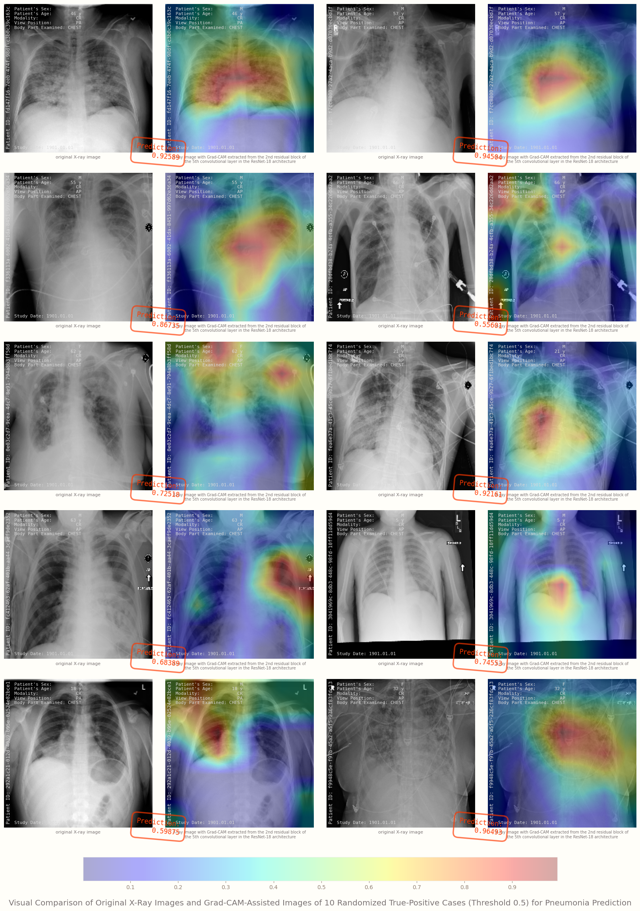

In [43]:
fig, axs = plt.subplots(
    5,
    4,
    figsize=(figure_size[0], figure_size[1] / 2 * 5),
    constrained_layout=True,
    gridspec_kw={"wspace": 0.08, "hspace": -0.15},
)

cam_dict = {"cam_img": [], "pred": []}
ordinal_string = {1: "1st", 2: "2nd", 3: "3rd", 4: "4th", 5: "5th"}

x_adjustments = [22.5, 0]
y_adjustments = [-18, -10, -2, 6, 14]
x_label_keywords = ["X-ray", "Grad-CAM", "ResNet-18"]

iterable = iter(axs.flatten())

for idx, (y_adjustment, x_adjustment) in zip(
    TP_list, list(itertools.product(y_adjustments, x_adjustments))
):
    paired_axs = [next(iterable)]
    paired_axs.append(next(iterable))
    cam_paired_images(
        paired_axs,
        idx,
        cam_type=grad_cam,
        model=new_model,
        keywords=x_label_keywords,
        x_adjustment=x_adjustment,
        y_adjustment=y_adjustment,
    )

fig.colorbar(
    mappable=cam_dict["cam_img"][cam_dict["pred"].index(max(cam_dict["pred"]))],
    cax=None,
    ax=axs,
    orientation="horizontal",
    shrink=0.75,
    pad=0.02,
    ticks=np.linspace(0, 1, 11, endpoint=True),
    ticklocation="top",
)

fig.suptitle(
    "Visual Comparison of Original X-Ray Images and Grad-CAM-Assisted Images of 10 Randomized "
    "True-Positive Cases (Threshold 0.5) for Pneumonia Prediction",
    fontsize="x-large",
    x=0.5,
    y=-0.01,
)

plt.show()

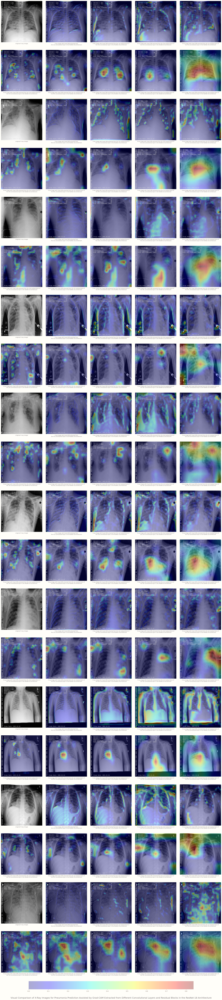

In [44]:
fig, axs = plt.subplots(
    20,
    5,
    figsize=(figure_size[0] / 4 * 5, figure_size[1] * 10),
    constrained_layout=True,
    gridspec_kw={"wspace": 0.08, "hspace": -0.15},
)

cam_dict = {"cam_img": [], "pred": []}
ordinal_string = {1: "1st", 2: "2nd", 3: "3rd", 4: "4th", 5: "5th"}

x_label_keywords = ["X-ray", "Grad-CAM", "ResNet-18"]

iterable = iter(axs.flatten())

for idx in TP_list:
    for module, block in itertools.product(range(5), range(2)):
        ax = next(iterable)
        DICOM_2D_image(ax, idx, x_label_keywords, fontsize_adjustment=0)
        if module == 0:
            if block != 0:
                visual_cam(
                    ax,
                    idx,
                    grad_cam,
                    model_conv1,
                    x_label_keywords,
                    fontsize_adjustment=0,
                    conv_module="conv1",
                    residual_block=None,
                )
        else:
            exec(
                f"visual_cam(ax, idx, grad_cam, model_{str(module)}_{str(block)}, "
                f"x_label_keywords, fontsize_adjustment=0, conv_module='layer{str(module)}', "
                f"residual_block={block})"
            )

fig.colorbar(
    mappable=cam_dict["cam_img"][cam_dict["pred"].index(max(cam_dict["pred"]))],
    cax=None,
    ax=axs,
    orientation="horizontal",
    shrink=0.75,
    pad=0.005,
    ticks=np.linspace(0, 1, 11, endpoint=True),
    ticklocation="top",
)

fig.suptitle(
    "Visual Comparison of X-Ray Images for Pneumonia Prediction Assisted by Grad-CAM "
    "Extracted from Different Convolutional Layers and Residual Blocks in the ResNet-18 "
    "Architecture",
    fontsize="x-large",
    x=0.5,
    y=-0.005,
)

plt.show()

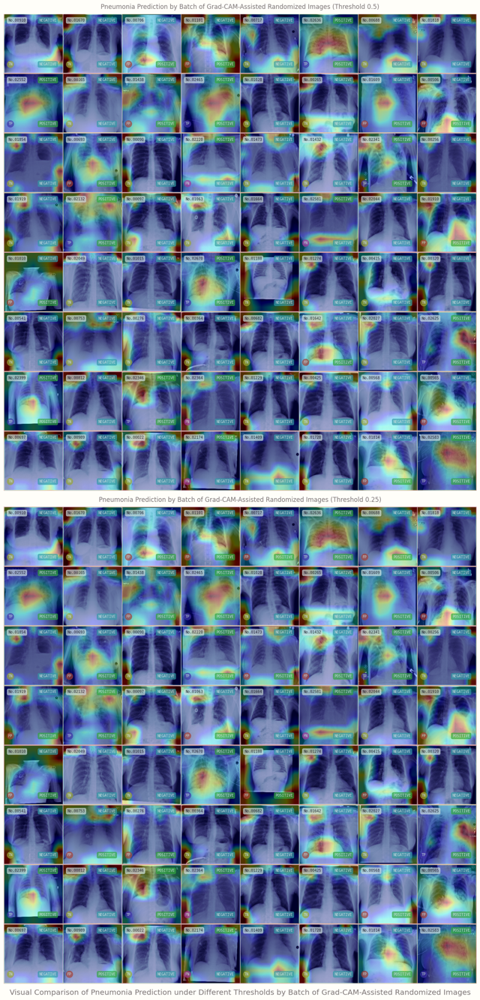

In [45]:
def grad_cam_batch(model, img_batch):
    pred_list = []
    grad_cam_img_list = []
    for i in range(img_batch.shape[0]):
        pred, features = model(img_batch[i, :, :, :].unsqueeze(0).cpu())
        pred = pred.detach().cpu()
        pred_list.append(torch.sigmoid(pred))
        _, c, h, w = features.shape
        features = features.reshape((c, h * w)).detach()

        gradiens = model.get_activation_grads().detach()
        gradiens = gradiens.reshape((c, h * w))
        weights = torch.mean(gradiens, dim=[1])

        grad_cam_img = torch.matmul(weights, features)
        grad_cam_img = np.maximum(grad_cam_img, 0)
        grad_cam_img = grad_cam_img - torch.min(grad_cam_img)
        grad_cam_img = grad_cam_img / (
            torch.max(grad_cam_img) - torch.min(grad_cam_img)
        )
        grad_cam_img_list.append(grad_cam_img.reshape(h, w))
    return pred_list, grad_cam_img_list


def grid_grad_cam_image(
    input_1,
    input_2,
    ax,
    model,
    n=None,
    slice_interval=500,
    threshold=0.5,
    row_size=8,
    pad_value=1,
):
    if n is None:
        n = len(input_1)
    n = math.ceil(n / slice_interval)
    nrows = math.ceil(n / row_size)
    cmap = "jet"

    pred_list, grad_cam_img_list = grad_cam_batch(model, input_1)
    grad_cam_img_list = [
        transforms.functional.resize(
            img=grad_cam_img.unsqueeze(0),
            size=input_1[0].squeeze(0).shape,
            antialias=True,
        )
        for grad_cam_img in grad_cam_img_list
    ]
    grad_cam_images = torch.cat(grad_cam_img_list, dim=0).unsqueeze(1)
    grad_cam_images = grad_cam_images[::slice_interval, :, :, :]

    for i in range(nrows):
        if len(grad_cam_images) > row_size:
            row_grad_cam_images = grad_cam_images[:row_size]
            grad_cam_images = grad_cam_images[row_size:]
        else:
            row_grad_cam_images = grad_cam_images[:]
        grid_row = make_grid(
            row_grad_cam_images,
            nrow=row_size,
            normalize=True,
            pad_value=pad_value,
        )
        scalar_row = grid_row.numpy().transpose(1, 2, 0)[:, :, 0]
        if i == 0:
            if nrows != 1:
                scalar_image = scalar_row
            else:
                scalar_image = np.full(
                    (
                        scalar_row.shape[0],
                        math.ceil(scalar_row.shape[1] / images.shape[0] * row_size),
                    ),
                    np.nan,
                )
                scalar_image[:, : scalar_row.shape[1]] = scalar_row
        elif scalar_image.shape[1] == scalar_row.shape[1]:
            scalar_image = np.concatenate((scalar_image, scalar_row), axis=0)
        else:
            image_to_concat = np.full(
                (scalar_image.shape[0] + scalar_row.shape[0], scalar_image.shape[1]),
                np.nan,
            )
            image_to_concat[: scalar_image.shape[0], :] = scalar_image
            image_to_concat[scalar_image.shape[0] :, : scalar_row.shape[1]] = scalar_row
            scalar_image = image_to_concat
    grid_DICOM_2D_image(
        input_2,
        ax,
        slice_interval=1,
        title="Pneumonia Prediction by Batch of Grad-CAM-Assisted Randomized Images "
        f"(Threshold {threshold})",
        preds=[1 if x >= threshold else 0 for x in pred_list],
    )
    ax.imshow(scalar_image, alpha=0.33, cmap=cmap, zorder=1)
    ax.set(xticks=[], yticks=[], frame_on=False)
    ax.grid(False)


colors = calm_color_generator(6)

fig, axs = plt.subplots(2, 1, figsize=(figure_size[0], figure_size[1] * 3))
grid_grad_cam_image(
    random_data,
    random_val_list,
    axs[0],
    new_model,
    slice_interval=1,
    row_size=8,
    pad_value=1,
)

grid_grad_cam_image(
    random_data,
    random_val_list,
    axs[1],
    new_model,
    slice_interval=1,
    threshold=0.25,
    row_size=8,
    pad_value=1,
)

fig.suptitle(
    "Visual Comparison of Pneumonia Prediction under Different Thresholds by Batch of "
    "Grad-CAM-Assisted Randomized Images",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

Grad-CAM++


```mermaid
%% Colors used for the Terminal symbols in this flowchart:
%% - Pantone / PMS 17-1937 TCX / Hot Pink / #e55982 Hex Color Code
%% - Pantone / PMS 15-1624 TCX / Conch Shell / #fc8f9b Hex Color Code

%% Colors used for the Initialization symbols in this flowchart:
%% - Pantone / PMS 18-2525 TCX / Magenta Haze / #9d446e Hex Color Code
%% - Pantone / PMS 15-2217 TCX / Aurora Pink / #e881a6 Hex Color Code

%% - Pantone / PMS 15-2217 TPG / Aurora Pink / #e683a9 Hex Color Code
%% - Pantone / PMS 17-1937 TPG / Hot Pink / #e86288 Hex Color Code

%% Colors used for the Decision symbols in this flowchart:
%% - Pantone / PMS 16-1546 TCX / Living Coral / #ff6f61 Hex Color Code
%% - Pantone / PMS 17-1736 TCX / Sun Kissed Coral / #ea6676 Hex Code Couleur

%% Colors used for the Process symbols in this flowchart:
%% - Pantone / PMS 14-1224 TCX / Coral Sands / #edaa86 Hex Code Couleur
%% - Pantone / PMS 16-1522 TCX / Rose Dawn / #c2877b Hex Code Couleur

%% Colors used for the Predefined Process symbols in this flowchart:
%% - Pantone / PMS 17-4245 TCX / Ibiza Blue / #007cb8 Hex Color Code
%% - Pantone / PMS 19-4053 TCX / Turkish Sea / #1a5190 Hex Color Code

%% Colors used for the background of subgraphs in this flowchart:
%% - Pantone / PMS 17-3922 TCX / Blue Ice / #70789b Hex Color Code
%% - Pantone / PMS 13-4202 TPG / Ice Water / #c1d6ea Hex Color Code

%% Font color used for colored background and symbols in this flowchart:
%% - Pantone / PMS 11-0601 TCX / Bright White / #f4f9ff Hex Color Code

flowchart TB
    classDef Terminal_Symbol fill: #e55982, stroke: #fc8f9b, stroke-width: 2px, color: #f4f9ff

    classDef Initialization_Symbols fill: #9d446e, stroke: #e881a6, stroke-width: 2px, color: #f4f9ff

    classDef Decision_Symbol fill: #ff6f61, stroke: #ea6676, stroke-width: 2px, color: #f4f9ff

    classDef Process_Symbol fill: #edaa86, stroke: #c2877b, stroke-width: 2px, color: #f4f9ff

    classDef Predefined_Process_Symbol fill: #007cb8, stroke: #1a5190, stroke-width: 2px, color: #f4f9ff

    classDef Background_Subgraph fill: #70789b, stroke: #c1d6ea, stroke-width: 3px, color: #f4f9ff, stroke-dasharray: 7 6

    subgraph LOOP_1[Loop Process 1]
        LOOP_1_A(LOOP ENTRY):::Terminal_Symbol
        LOOP_1_B{{LOOP CONDITION}}:::Initialization_Symbols
        LOOP_1_C{Condition 2}:::Decision_Symbol
        LOOP_1_D[Statement 2]:::Process_Symbol
        LOOP_1_E(LOOP EXIT):::Terminal_Symbol

        direction LR
            LOOP_1_A --> LOOP_1_B -- True --> LOOP_1_C -- True --> LOOP_1_D --> LOOP_1_B
            LOOP_1_C -- False --> LOOP_1_B -- False --> LOOP_1_E

        LOOP_1_A ~~~ LOOP_1_B ~~~ LOOP_1_C ~~~ LOOP_1_D
        LOOP_1_C ~~~ LOOP_1_E
    end

    subgraph LOOP_2[Loop Process 2]
        LOOP_2_A(LOOP ENTRY):::Terminal_Symbol
        LOOP_2_B{{LOOP CONDITION}}:::Initialization_Symbols
        LOOP_2_C{Condition 3}:::Decision_Symbol
        LOOP_2_D[Statement 3]:::Process_Symbol
        LOOP_2_E{Condition 4}:::Decision_Symbol
        LOOP_2_F[Statement 4]:::Process_Symbol
        LOOP_2_G[Statement 5]:::Process_Symbol
        LOOP_2_H(LOOP EXIT):::Terminal_Symbol

        direction LR
            LOOP_2_A --> LOOP_2_B -- True --> LOOP_2_C -- True --> LOOP_2_D --> LOOP_2_G --> LOOP_2_B
            LOOP_2_C -- False--> LOOP_2_E -- True --> LOOP_2_F --> LOOP_2_G
            LOOP_2_E -- False --> LOOP_2_B -- False --> LOOP_2_H

        LOOP_2_A ~~~ LOOP_2_B ~~~ LOOP_2_C ~~~ LOOP_2_D ~~~ LOOP_2_E ~~~ LOOP_2_F ~~~ LOOP_2_G
        LOOP_2_F ~~~ LOOP_2_H

    end

    LOOP_1:::Background_Subgraph
    LOOP_2:::Background_Subgraph

    A(START):::Terminal_Symbol
    B{Condition 1}:::Decision_Symbol
    C[Statement 1]:::Process_Symbol
    D(STOP):::Terminal_Symbol

    X[[File Removal]]:::Predefined_Process_Symbol

    A ==> B == True ==> LOOP_1 ==> LOOP_2 ==> D
    B == False ==> C ==> D
    X -.-> C
    X -.-> LOOP_1

    C ~~~ X
```